### This notebook visualises data used for gene expression prediction
 
Question: To what extent can mC and hmC predict gene expression?


1. Normalise epigenetic data

2. Normalise RNA-seq data

3. Visualise data distributions and inputs to DL model

In [1]:
import pandas as pd
import numpy as np
import os
import re
import collections
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import seaborn as sns
import sys
from scipy import optimize
import pickle
# import plotly.express as px
import datetime
from scipy import stats
import matplotlib.colors as colors

# from scipy.stats import zscore



sys.path.append('/well/ludwig/users/dyp502/code/tissue_atlas_code_2023/')
from tissue_atlas_v3_functions import merge_filter_new_tissue_samples

sys.path.append('/well/ludwig/users/dyp502/code/taps_tissue_atlas_Nov2022/')
from taps_tissue_atlas_functions import make_tissue_average_df
from taps_tissue_atlas_functions import plot_region, plot_tissue_sample_atlas, visualise_bed




with open('/well/ludwig/users/dyp502/tissue_atlas_v3/metadata/Atlas_V3_Metadata_New.pickle', 'rb') as f:
    project_metadata = pickle.load(f)

# Load all the variables into memory    
project_dir = project_metadata['project_dir']
atlas_dir = project_metadata['atlas_dir'] 
metadata_dir = project_metadata['metadata_dir']
gene_exp_dir = project_metadata['gene_exp_dir']
intersections_dir = project_metadata['intersections_dir']
id_tissue_map = project_metadata["id_tissue_map"]
tissue_id_map = project_metadata["tissue_id_map"]
blood_cell_types = project_metadata["blood_cell_types"]
somatic_tissue_types = project_metadata["somatic_tissue_types"]
healthy_tissue_types = project_metadata["healthy_tissue_types"]
cancer_tissue_types = project_metadata["cancer_tissue_types"]
diseased_tissue_types = project_metadata["diseased_tissue_types"]
tissues_with_tumour = project_metadata["tissues_with_tumour"]
tissue_order = project_metadata["tissue_order"]
genomic_features = project_metadata["genomic_features"]
sample_outliers = project_metadata["sample_outliers"]
healthy_high_cov_samples = project_metadata["healthy_high_cov_samples"]
genomic_feature_colnames = project_metadata["genomic_feature_colnames"]
genomic_regions_dir = project_metadata['genomic_regions_dir']
    



In [2]:
use_padding = True
if use_padding:
#     suffix = '.200bp_padding'
    suffix = '.200bp_padding.CpG_only'
else:
    suffix = ""

In [3]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:80% !important; }</style>"))

# RNA-seq data

- Derived from GTEX 

### Load RNA-seq raw

In [4]:

rna_seq_num1 = 2
rna_seq_num2 = 5
rna_seq_filepaths = ["/well/ludwig/users/qwb368/public_data/GTEx/TPM/GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_median_tpm.gct",
                     "/well/ludwig/users/qwb368/public_data/HPA/rna_tissue_hpa_formatted.tsv",
                     "/well/ludwig/users/qwb368/public_data/HPA_GTEx_consensus/rna_tissue_consensus_formatted.tsv",
                     "/well/ludwig/users/qwb368/public_data/FANTOM/rna_tissue_fantom_formatted.tsv",
                     "/well/ludwig/users/qwb368/public_data/hmC-Seal/GSE144530_RNAseq_RPKM_RefSeq_formatted.tsv",
                     "/well/ludwig/users/qwb368/public_data/HPA_immune/rna_immune_cell_formatted.tsv",
                     "/well/ludwig/users/qwb368/public_data/Monaco_immune/rna_immune_cell_monaco_formatted.tsv",
                     "/well/ludwig/users/qwb368/public_data/Schmiedel_immune/rna_immune_cell_schmiedel_formatted.tsv"]
rna_seq_filepath1 = rna_seq_filepaths[rna_seq_num1]
rna_seq_filepath2 = rna_seq_filepaths[rna_seq_num2]
rna_seq_filename1 = re.sub('\..*','', re.sub('/.*/', "", rna_seq_filepath1))
rna_seq_filename2 = re.sub('\..*','', re.sub('/.*/', "", rna_seq_filepath2))
rna_seq1 = pd.read_csv(rna_seq_filepath1,sep='\t')
rna_seq2 = pd.read_csv(rna_seq_filepath2,sep='\t')
rna_seq = pd.merge(rna_seq1, rna_seq2, on=['Name','Description']) ### bc those 2 datasets don't have version numbers

if "." in rna_seq.loc[0,"Name"]:
    rna_seq[['core_gene','version']] = rna_seq['Name'].str.split('.',expand=True)
else:
    rna_seq['core_gene'] = rna_seq['Name']
    rna_seq['version'] = 0
rna_seq = rna_seq.set_index('core_gene')
# rna_seq


In [5]:


# tissue_names = [u.lower() for u in tissue_id_map.keys()]
tissue_names = list(tissue_id_map.keys())
rna_seq_df = rna_seq
rna_seq_tissues = list(rna_seq_df.columns)


def clean_string(s):
    return s.split('-')[0]  # Split on hyphens and take the first part

# Create a lowercased version of match_tissue_list for comparison
match_tissue_list_lower = [clean_string(tissue.lower()) for tissue in rna_seq_tissues]

mapping = {}

for tissue in tissue_names:
    tissue_clean = clean_string(tissue.lower())
    for match in match_tissue_list_lower:
        if tissue_clean in match:
            mapping[tissue] = match
            break  # Found a match, go to the next tissue
        else:
            mapping[tissue] = ""  # Default case if no match is found

# print(mapping)



mapping['Neutrophils'] = 'neutrophil'
mapping['B-cells'] =  'naive B-cell' # 'memory B-cell'
mapping['Eosinophils'] = 'eosinophil'
mapping['Monocytes'] = 'classical monocyte'
mapping['NK-cells'] = 'NK-cell'
mapping['CD4-T-cells'] = 'memory CD4 T-cell'
mapping['CD8-T-cells'] = 'memory CD8 T-cell'


# Melt the RNA-seq data to long format
rna_seq_data_long = rna_seq.reset_index().melt(id_vars=['core_gene', 'Name', 'Description'], var_name='tissue', value_name='TPM')


rna_seq_data_long['logTPM'] = np.log1p(rna_seq_data_long['TPM'])



    # Calculate the mean TPM for each tissue
tissue_means = rna_seq_data_long.groupby('tissue')['TPM'].mean()

# Normalize the TPM values by dividing by the tissue mean
rna_seq_data_long['Normalized_TPM'] = rna_seq_data_long.apply(lambda row: row['TPM'] / tissue_means[row['tissue']], axis=1)


In [6]:
rna_seq

,Name,Description,adipose tissue,adrenal gland,amygdala,appendix,basal ganglia,bone marrow,breast,cerebellum,...,naive B-cell,naive CD4 T-cell,naive CD8 T-cell,neutrophil,NK-cell,non-classical monocyte,plasmacytoid DC,T-reg,total PBMC,version
core_gene,,,,,,,,,,,,,,,,,,,,,
ENSG00000000003,ENSG00000000003,TSPAN6,29.6,18.2,7.2,4.9,7.5,0.6,34.2,7.2,...,0.1,2.1,1.2,0.3,0.1,0.1,0.1,0.0,0.3,0
ENSG00000000005,ENSG00000000005,TNMD,21.1,0.2,0.2,0.6,0.1,0.0,12.9,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
ENSG00000000419,ENSG00000000419,DPM1,40.9,53.4,23.0,34.3,23.9,59.3,42.7,24.4,...,16.1,20.0,22.4,20.0,19.1,18.6,21.7,19.5,16.1,0
ENSG00000000457,ENSG00000000457,SCYL3,5.6,5.8,2.7,7.4,3.0,4.0,10.9,4.0,...,6.2,7.0,5.8,6.7,10.7,3.8,11.5,8.1,4.8,0
ENSG00000000460,ENSG00000000460,C1orf112,1.8,1.2,0.6,3.3,0.9,9.0,2.9,1.7,...,1.4,0.3,0.5,0.1,2.1,2.3,0.4,0.7,0.6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000288677,ENSG00000288677,AC105206.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
ENSG00000288678,ENSG00000288678,AL136115.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.2,0.3,0.0,0.4,0.0,3.9,0
ENSG00000288681,ENSG00000288681,AC136475.9,0.0,0.0,0.1,0.2,0.0,0.0,0.0,0.3,...,13.3,10.6,29.8,473.0,87.7,53.0,2.8,6.4,170.9,0


## Load tissue specific genes list

In [7]:
tissue_specific_df = pd.read_csv("/well/ludwig/users/qwb368/public_data/tissue_specific_genes_HPA_Magda/tissue_specific_genes.tsv",sep='\t')
housekeeping_genes = list(tissue_specific_df.loc[tissue_specific_df['specificity']=="Low tissue specificity"]['Ensembl'].unique())
tissue_specific_genes = list(tissue_specific_df.loc[tissue_specific_df['specificity'].isin(["Tissue enhanced","Group enriched","Tissue enriched"])]['Ensembl'].unique())

tissue_specific_df.head()

,Gene,Ensembl,specificity,tissue
0,TNMD,ENSG00000000005,Tissue enhanced,adipose_tissue
1,MEOX1,ENSG00000005102,Tissue enhanced,adipose_tissue
2,PRKAR2B,ENSG00000005249,Tissue enhanced,adipose_tissue
3,MGST1,ENSG00000008394,Tissue enhanced,adipose_tissue
4,SEMA3G,ENSG00000010319,Tissue enhanced,adipose_tissue


In [8]:
tissue_specific_df

,Gene,Ensembl,specificity,tissue
0,TNMD,ENSG00000000005,Tissue enhanced,adipose_tissue
1,MEOX1,ENSG00000005102,Tissue enhanced,adipose_tissue
2,PRKAR2B,ENSG00000005249,Tissue enhanced,adipose_tissue
3,MGST1,ENSG00000008394,Tissue enhanced,adipose_tissue
4,SEMA3G,ENSG00000010319,Tissue enhanced,adipose_tissue
...,...,...,...,...
26888,ANXA8,ENSG00000265190,Tissue enhanced,vagina
26889,RNF225,ENSG00000269855,Tissue enhanced,vagina
26890,H2BC9,ENSG00000275713,Tissue enhanced,vagina
26891,FAM25C,ENSG00000276430,Group enriched,vagina


## Load processed 1kb epigenetic data

In [9]:
model_name = "20kb_upstream_downstream_gene_equal_bins."
data_load_name = model_name 
# data_load_name = "1kb_bins.leave_one_out.test2.no_brain."
save_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/predict_ge/1kb_model/dl_model/"
save=False
load=False
normalise=True
remove_brain =False
use_normalised_TPM = False

In [10]:

### -----------------    Read in MLML


original_mlml_file = "/gpfs3/well/ludwig/users/cfo155/tissueMap/methcalls/aggregate_tissue/tissue_merged_common_cpg.mincov3.all_meth.txt"
mlml_colnames = list(pd.read_csv(original_mlml_file,sep="\t",nrows=1).columns)
mlml_colnames.insert(2, 'END')
# bedfile_colnames = ["chr", "start", "end", "gene_id", "gene_name", "level", "strand"]
bedfile_colnames = ["chr", "start", "end", "gene_id", "gene_name", "strand"]


# mlml_file = "/well/ludwig/users/dyp502/tissue_atlas_v3/predict_ge/data/MLML.tissue_merged_common_cpg.mincov3.all_meth.gencode.protein_coding_genes.10kb_upstream_downstream.with_header.bed"
# mlml_file = "/well/ludwig/users/dyp502/tissue_atlas_v3/predict_ge/data/MLML.tissue_merged_common_cpg.mincov3.all_meth.gencode.protein_coding_genes.20kb_upstream_downstream.bed"
# names = bedfile_colnames + mlml_colnames
# mlml = pd.read_csv(mlml_file,
#                 sep='\t',
#                   nrows=100000,
#                 names=names
#                 )




filedir = "/gpfs3/well/ludwig/users/cfo155/tissueMap/methcalls/meth_around_gene/"
filename = "MANE.GRCh38.v1.0.refseq_genomic.gene.flank20000.nwin20.all_meth.txt"


tmp = pd.read_csv(filedir + filename,
                 sep='\t',
                 nrows=100000,
                 )


# tmp.to_csv(f"/well/ludwig/users/dyp502/tissue_atlas_v3/predict_ge/1kb_model/input_data/{filename}",
#                         sep='\t',
#                         index=False)

## Load new data from Jingfei
# Function to calculate mean across tissue samples for each epigenetic mark
def calculate_tissue_means(df, tissue_id_map):
    tissue_means = {}

    for tissue, samples in tissue_id_map.items():
        for mark in ['mC', 'hmC', 'umC']:
            relevant_columns = [f"{sample}_{mark}" for sample in samples if f"{sample}_{mark}" in df.columns]
            if relevant_columns:
                tissue_means[f"{tissue}_{mark}"] = df[relevant_columns].mean(axis=1)

    return pd.DataFrame(tissue_means)

# Calculate the means
tissue_mean_df = calculate_tissue_means(tmp, tissue_id_map)
mlml = pd.concat([tmp.iloc[:,0:6],tissue_mean_df],axis=1)




if remove_brain:
    mlml = mlml.drop(columns=[u for u in mlml.columns if 'Brain' in u])

# epigenetic_cols = list(mlml.columns)[10:]
epigenetic_cols = [u for u in mlml.columns if 'mC' in u]


### Bin into 1kb bins
# mlml['gene_id'] = mlml['gene_id'].str.split('.').str[0]







### Distribution of mC hmC and umC BEFORE normalisation

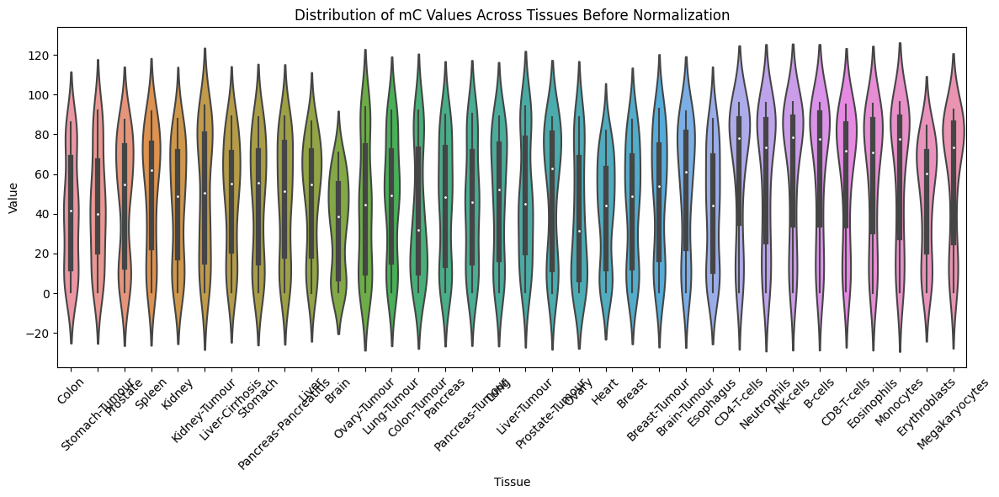

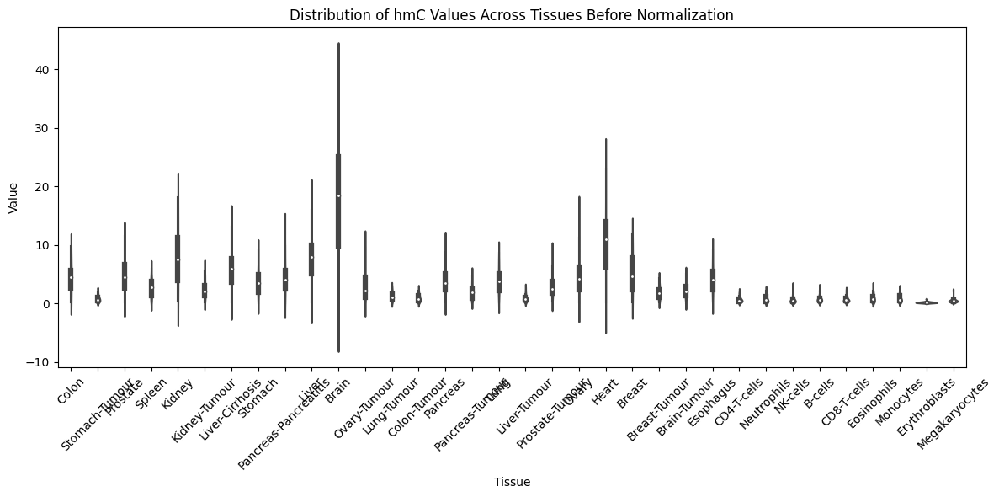

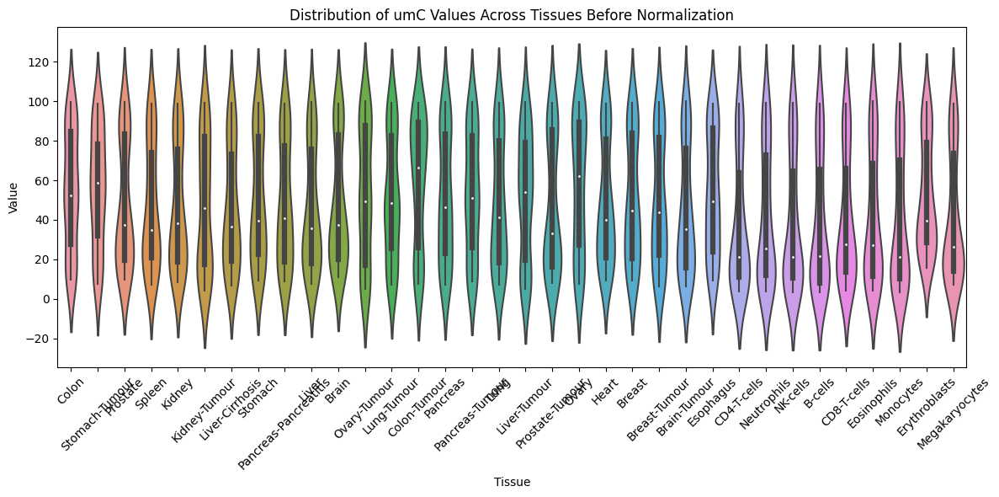

In [11]:
long_format_df = mlml.loc[mlml['gene']=="SAMD11"].melt(value_vars=epigenetic_cols, var_name='Tissue_Mark', value_name='Value')
long_format_df[['Tissue', 'Mark']] = long_format_df['Tissue_Mark'].str.split('_', n=1, expand=True)

# Now, let's plot the data
for mark in ['mC', 'hmC', 'umC']:
    plt.figure(figsize=(12, 6))
    sns.violinplot(x='Tissue', y='Value', data=long_format_df[long_format_df['Mark'] == mark])
    plt.title(f'Distribution of {mark} Values Across Tissues Before Normalization')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


### Distribution of mC hmC and umC before normalisation

In [12]:
 # Calculate the bin for each methylation site
# # data_sample=mlml
# mlml['bin'] = ((mlml['START'] - mlml['start']) // 1000).astype(int)



# Group the data by gene_id and bin, then calculate the mean for each group
# grouped_data = data_sample.groupby(['gene_id', 'bin'])[epigenetic_cols].mean().reset_index()
# grouped_data = mlml.groupby(['gene_id', 'bin']).agg({
#     'chr': 'first',
#     'start': 'first',
#     'end': 'first',
#     'gene_name': 'first',
# #     'level': 'first',
#     'strand': 'first',
#     'CHR': 'first',
#     'START': 'first',
#     'END': 'first',
#     **{col: 'mean' for col in epigenetic_cols}
# }).reset_index()


# Calculate the start and end coordinates of each bin
# grouped_data['bin_start'] = grouped_data['start'] + grouped_data['bin'] * 1000
# grouped_data['bin_end'] = grouped_data['bin_start'] + 1000



# grouped_data.to_csv(save_dir +  model_name + f"mlml_grouped_data.csv",sep='\t')


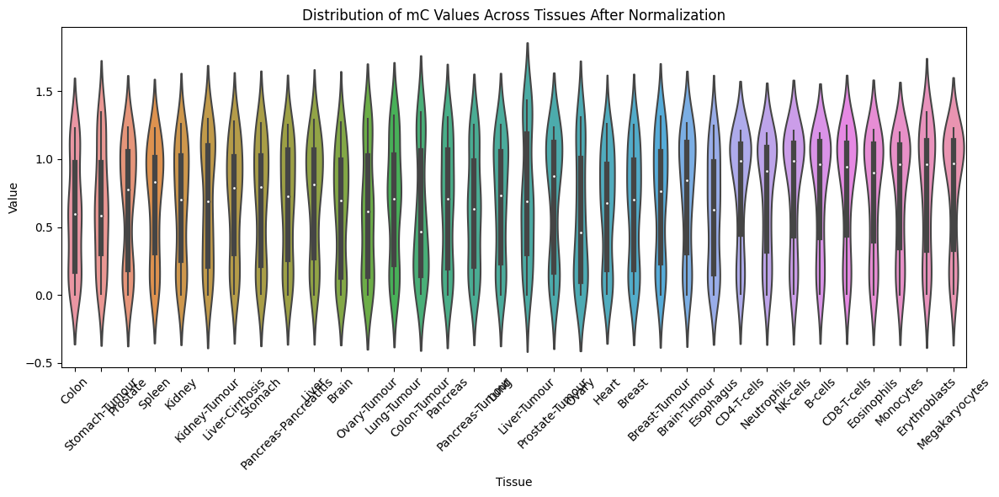

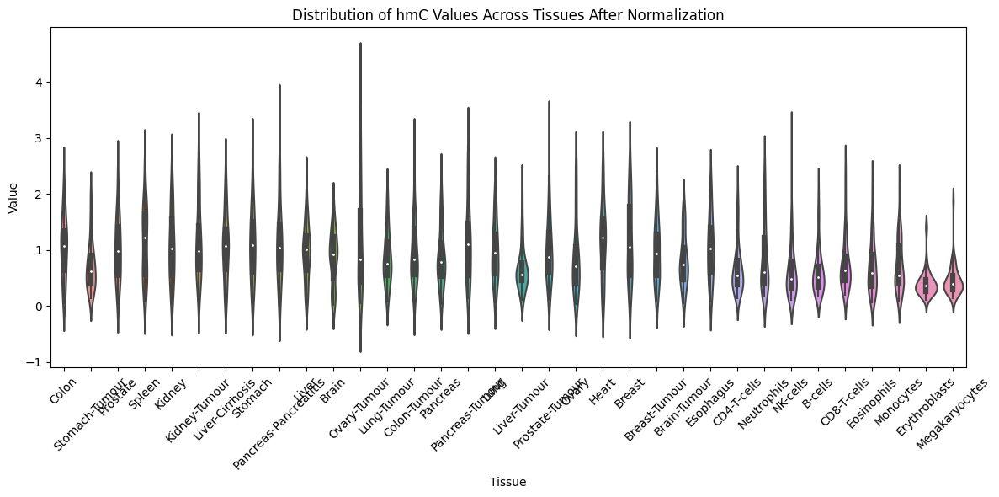

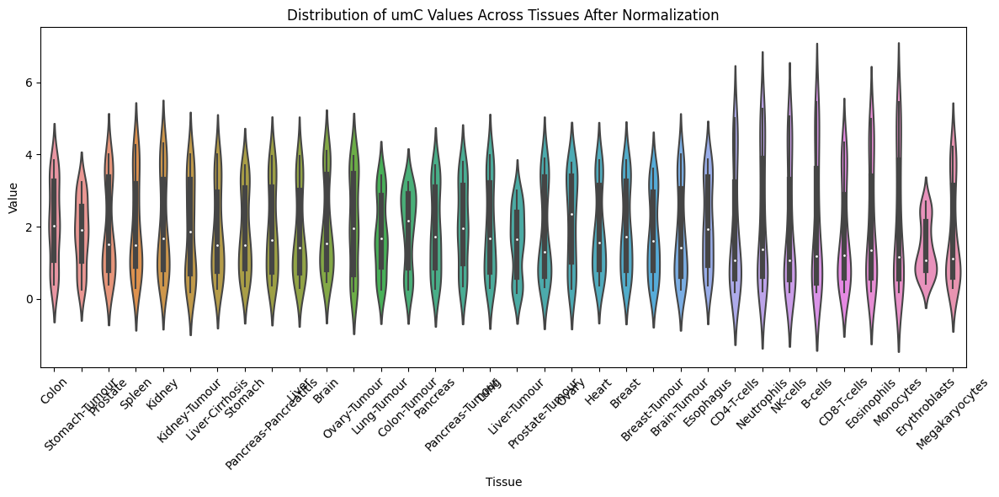

In [13]:
long_format_df = mlml.loc[mlml['gene']=="SAMD11"].melt(value_vars=epigenetic_cols, var_name='Tissue_Mark', value_name='Value')
long_format_df[['Tissue', 'Mark']] = long_format_df['Tissue_Mark'].str.split('_', n=1, expand=True)
for mark in ['mC', 'hmC', 'umC']:
    plt.figure(figsize=(12, 6))
    sns.violinplot(x='Tissue', y='Value', data=long_format_df[long_format_df['Mark'] == mark])
    plt.title(f'Distribution of {mark} Values Across Tissues After Normalization')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()


## Visualise model input data

### 1kb equal bins

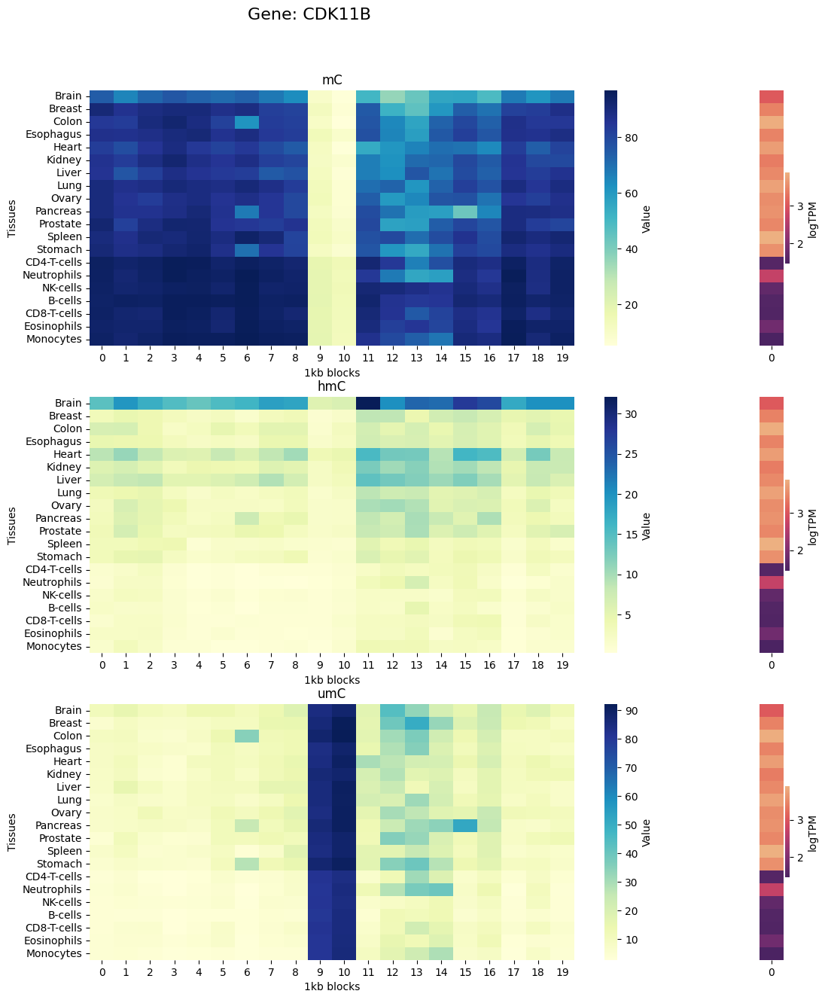

In [16]:
model_name = "1kb_bins.leave_one_out.RF2."
save=True
load=False
normalise=False
save_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/predict_ge/1kb_model/"
tissues = [u for u in healthy_tissue_types if u not in ['Bone-Marrow','Thymus']]
tissue_mapping = {
    "Erythroblasts": "CD34-erythroblasts",
    "Megakaryocytes": "CD34-megakaryocytes"
}
tissues = [tissue_mapping.get(tissue, tissue) for tissue in tissues]


rna_seq_num1 = 2
rna_seq_num2 = 5
rna_seq_filepaths = ["/well/ludwig/users/qwb368/public_data/GTEx/TPM/GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_median_tpm.gct",
                    "/well/ludwig/users/qwb368/public_data/HPA/rna_tissue_hpa_formatted.tsv",
                    "/well/ludwig/users/qwb368/public_data/HPA_GTEx_consensus/rna_tissue_consensus_formatted.tsv",
                    "/well/ludwig/users/qwb368/public_data/FANTOM/rna_tissue_fantom_formatted.tsv",
                    "/well/ludwig/users/qwb368/public_data/hmC-Seal/GSE144530_RNAseq_RPKM_RefSeq_formatted.tsv",
                    "/well/ludwig/users/qwb368/public_data/HPA_immune/rna_immune_cell_formatted.tsv",
                    "/well/ludwig/users/qwb368/public_data/Monaco_immune/rna_immune_cell_monaco_formatted.tsv",
                    "/well/ludwig/users/qwb368/public_data/Schmiedel_immune/rna_immune_cell_schmiedel_formatted.tsv"]
rna_seq_filepath1 = rna_seq_filepaths[rna_seq_num1]
rna_seq_filepath2 = rna_seq_filepaths[rna_seq_num2]
rna_seq_filename1 = re.sub('\..*','', re.sub('/.*/', "", rna_seq_filepath1))
rna_seq_filename2 = re.sub('\..*','', re.sub('/.*/', "", rna_seq_filepath2))
rna_seq1 = pd.read_csv(rna_seq_filepath1,sep='\t')
rna_seq2 = pd.read_csv(rna_seq_filepath2,sep='\t')
rna_seq = pd.merge(rna_seq1, rna_seq2, on=['Name','Description']) ### bc those 2 datasets don't have version numbers



if "." in rna_seq.loc[0,"Name"]:
    rna_seq[['core_gene','version']] = rna_seq['Name'].str.split('.',expand=True)
else:
    rna_seq['core_gene'] = rna_seq['Name']
    rna_seq['version'] = 0
rna_seq = rna_seq.set_index('core_gene')
rna_seq






# tissue_names = [u.lower() for u in tissue_id_map.keys()]
tissue_names = list(tissue_id_map.keys())
rna_seq_df = rna_seq
rna_seq_tissues = list(rna_seq_df.columns)


def clean_string(s):
    return s.split('-')[0]  # Split on hyphens and take the first part

# Create a lowercased version of match_tissue_list for comparison
match_tissue_list_lower = [clean_string(tissue.lower()) for tissue in rna_seq_tissues]

mapping = {}

for tissue in tissue_names:
    tissue_clean = clean_string(tissue.lower())
    for match in match_tissue_list_lower:
        if tissue_clean in match:
            mapping[tissue] = match
            break  # Found a match, go to the next tissue
        else:
            mapping[tissue] = ""  # Default case if no match is found

# print(mapping)



mapping['Neutrophils'] = 'neutrophil'
mapping['B-cells'] =  'naive B-cell' # 'memory B-cell'
mapping['Eosinophils'] = 'eosinophil'
mapping['Monocytes'] = 'classical monocyte'
mapping['NK-cells'] = 'NK-cell'
mapping['CD4-T-cells'] = 'memory CD4 T-cell'
mapping['CD8-T-cells'] = 'memory CD8 T-cell'


# Melt the RNA-seq data to long format
rna_seq_data_long = rna_seq.reset_index().melt(id_vars=['core_gene', 'Name', 'Description'], var_name='tissue', value_name='TPM')


rna_seq_data_long['logTPM'] = np.log1p(rna_seq_data_long['TPM'])



    # Calculate the mean TPM for each tissue
tissue_means = rna_seq_data_long.groupby('tissue')['TPM'].mean()

# Normalize the TPM values by dividing by the tissue mean
rna_seq_data_long['Normalized_TPM'] = rna_seq_data_long.apply(lambda row: row['TPM'] / tissue_means[row['tissue']], axis=1)






original_mlml_file = "/gpfs3/well/ludwig/users/cfo155/tissueMap/methcalls/aggregate_tissue/tissue_merged_common_cpg.mincov3.all_meth.txt"
mlml_colnames = list(pd.read_csv(original_mlml_file,sep="\t",nrows=1).columns)
mlml_colnames.insert(2, 'END')

bedfile_colnames = ["chr", "start", "end", "gene_id", "gene_name", "level", "strand"]

# mlml_file = "/well/ludwig/users/dyp502/tissue_atlas_v3/predict_ge/data/MLML.tissue_merged_common_cpg.mincov3.all_meth.gencode.protein_coding_genes.10kb_upstream_downstream.with_header.bed"
mlml_file = "/well/ludwig/users/dyp502/tissue_atlas_v3/predict_ge/data/MLML.tissue_merged_common_cpg.mincov3.all_meth.gencode.protein_coding_genes.10kb_upstream_downstream.bed"
names = bedfile_colnames + mlml_colnames
mlml = pd.read_csv(mlml_file,
                sep='\t',
                  nrows=100000,
                names=names
                )

epigenetic_cols = names[10:]

### Bin into 1kb bins
mlml['gene_id'] = mlml['gene_id'].str.split('.').str[0]

# Calculate the bin for each methylation site
# data_sample=mlml
mlml['bin'] = ((mlml['START'] - mlml['start']) // 1000).astype(int)

if normalise:
    mlml[epigenetic_cols] = mlml[epigenetic_cols]/ mlml[epigenetic_cols].mean()

# Group the data by gene_id and bin, then calculate the mean for each group
# grouped_data = data_sample.groupby(['gene_id', 'bin'])[epigenetic_cols].mean().reset_index()
grouped_data = mlml.groupby(['gene_id', 'bin']).agg({
    'chr': 'first',
    'start': 'first',
    'end': 'first',
    'gene_name': 'first',
#     'level': 'first',
    'strand': 'first',
    'CHR': 'first',
    'START': 'first',
    'END': 'first',
    **{col: 'mean' for col in epigenetic_cols}
}).reset_index()


# Calculate the start and end coordinates of each bin
grouped_data['bin_start'] = grouped_data['start'] + grouped_data['bin'] * 1000
grouped_data['bin_end'] = grouped_data['bin_start'] + 1000




selected_gene = "ENSG00000248333"
# selected_gene = "ENSG00000162571"
df = grouped_data.loc[grouped_data['gene_id']==selected_gene]
remove_cols = [col for col in df.columns if any(s in col for s in ['CD34'])]
df.drop(remove_cols, axis=1, inplace=True)

strand = df['strand'].iloc[0]


tissues = tissues[0:-2]
# Extracting epigenetic data
mC_data = df[[f"{tissue}_mC" for tissue in tissues]].to_numpy()
hmC_data = df[[f"{tissue}_hmC" for tissue in tissues]].to_numpy()
umC_data = df[[f"{tissue}_umC" for tissue in tissues]].to_numpy()


rna_seq_tissues = [u for u in [mapping.get(u,'') for u in tissues] if u]
rna_seq_subset = rna_seq_data_long[(rna_seq_data_long['Name'] == selected_gene) & (rna_seq_data_long['tissue'].isin(rna_seq_tissues))]
rna_seq_subset['tissue'] = pd.Categorical(rna_seq_subset['tissue'], categories=rna_seq_tissues, ordered=True)#.sor('tissue')
rna_seq_subset.sort_values(by='tissue',inplace=True)


# Extracting logTPM data for the gene of interest
logTPM = rna_seq_subset['logTPM'].to_numpy().reshape(20,1)






gene_name = df['gene_name'].iloc[0]

# Plotting the heatmaps

fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [20, 1]})

# fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [5, 1]})

sns.heatmap(mC_data.T, ax=axes[0, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
axes[0, 0].set_title('mC')
axes[0, 0].set_ylabel('Tissues')
axes[0, 0].set_xlabel('1kb blocks')

sns.heatmap(hmC_data.T, ax=axes[1, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
axes[1, 0].set_title('hmC')
axes[1, 0].set_ylabel('Tissues')
axes[1, 0].set_xlabel('1kb blocks')

sns.heatmap(umC_data.T, ax=axes[2, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
axes[2, 0].set_title('umC')
axes[2, 0].set_ylabel('Tissues')
axes[2, 0].set_xlabel('1kb blocks')


# fig.suptitle(f"Gene: {selected_gene}, Strand: {strand}",fontsize=16)
# fig.suptitle(f"Gene: {gene_name}", fontsize=16, ha='left')
fig.suptitle(f"Gene: {gene_name}", fontsize=16,
             ha='left', va='bottom',
             x=0.3,y=0.94
#              bbox={'x': 1.2, 'y': 1.05},
            )

# Secondary heatmap (logTPM values)
for i in range(3):
    sns.heatmap(logTPM, ax=axes[i, 1], cmap='flare_r', cbar_kws={'label': 'logTPM'}, yticklabels=tissues)
    axes[i, 1].set_yticks([])  # Hide y-ticks for logTPM plots
    axes[i, 1].set_ylabel('')  # Hide y-labels for logTPM plots
    
    
    
    

fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/ge_predict/"

# plt.savefig(fig_savedir + f"1kb.mC_hmC_umC_heatmap.{gene_name}.logTPM.thesis_clean.png",
#            dpi=300)


In [17]:
file_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/predict_ge/1kb_model/dl_model/"
# filename = "20kb_upstream_downstream_gene_equal_bins.tissue_specific.mlml_grouped_data.csv"
filename = "20kb_upstream_downstream_gene_equal_bins.mC_hmC_umC_grouped_data_before_normalisation.csv"
grouped_data = pd.read_csv(file_dir + filename,
                           sep='\t',
                          nrows=100000)



# gene_to_find = "CD37"
gene_to_find = "PLG"



# Read only the 'gene' column from the file
gene_column = pd.read_csv(file_dir + filename,
                           sep='\t',
                          usecols=['gene'])

# Find the indices where the gene is 'FLVCR1'
gene_indices = gene_column[gene_column['gene'] == gene_to_find].index.tolist()


specific_gene_grouped_data = pd.read_csv(file_dir + filename,
                                           sep='\t',
                                         skiprows=gene_indices[0],
                                         nrows=len(gene_indices),
                                         names=grouped_data.columns
                                        )

specific_gene_grouped_data.loc[specific_gene_grouped_data['gene']==gene_to_find]

,Unnamed: 0,chr,start,end,gene,feature,idx,Colon_mC,Colon_hmC,Colon_umC,...,Eosinophils_umC,Monocytes_mC,Monocytes_hmC,Monocytes_umC,Erythroblasts_mC,Erythroblasts_hmC,Erythroblasts_umC,Megakaryocytes_mC,Megakaryocytes_hmC,Megakaryocytes_umC
1,385615,chr6,160682193,160683193,PLG,tss,1,74.00,0.6250,25.00,...,17.500,88.250,0.41000,11.225,43.750,2.0000,54.25,59.5,2.550,38.0
3,385617,chr6,160683193,160684193,PLG,tss,2,73.00,1.0575,25.75,...,11.750,85.500,1.42750,13.025,51.750,3.4750,45.00,62.0,1.250,37.0
5,385619,chr6,160684193,160685193,PLG,tss,3,65.75,1.6325,32.75,...,20.500,81.250,0.24500,18.500,48.500,0.7500,50.50,65.0,0.265,34.5
6,385620,chr6,160685193,160686193,PLG,tss,4,71.75,1.3450,27.00,...,12.700,88.500,0.21250,11.100,62.500,0.3240,37.25,75.0,0.865,24.0
7,385621,chr6,160686193,160687193,PLG,tss,5,81.25,2.1350,17.00,...,13.250,88.000,0.73750,11.400,50.250,0.7300,49.25,67.5,0.495,32.5
8,385622,chr6,160687193,160688193,PLG,tss,6,66.50,2.1250,31.00,...,16.250,85.750,0.16250,14.250,43.000,1.6325,55.25,60.0,1.550,38.0
9,385623,chr6,160688193,160689193,PLG,tss,7,75.25,1.6925,23.00,...,11.775,88.500,0.12000,11.425,54.000,1.1950,44.75,67.5,0.750,32.0
10,385624,chr6,160689193,160690193,PLG,tss,8,79.25,1.3300,19.75,...,13.000,87.250,0.17250,12.600,60.000,0.3550,39.50,66.0,0.060,34.0
11,385625,chr6,160690193,160691193,PLG,tss,9,81.00,0.8175,18.25,...,13.500,89.250,0.12750,10.400,60.000,0.5650,39.75,69.5,0.800,30.0
12,385626,chr6,160691193,160692193,PLG,tss,10,83.25,0.8400,16.25,...,11.500,89.250,0.29500,10.100,57.500,0.6300,42.00,67.5,0.370,32.5


In [18]:
complete_gene_list = []
for gene in grouped_data['gene'].unique():
    df = grouped_data.loc[grouped_data['gene']==gene]
    
    rna_seq_subset = rna_seq_data_long[(rna_seq_data_long['Description'] == gene) & (rna_seq_data_long['tissue'].isin(rna_seq_tissues))]
    
#     
    
    if ( rna_seq_subset.shape[0]==20) and df.shape[0]==60:
        print(rna_seq_subset.shape)
        print(f"{gene}:{df.shape}")

        complete_gene_list.append(gene)
        if len(complete_gene_list)>20:
            break


(20, 7)
SAMD11:(60, 109)
(20, 7)
HES4:(60, 109)
(20, 7)
AGRN:(60, 109)
(20, 7)
TTLL10:(60, 109)
(20, 7)
TNFRSF18:(60, 109)
(20, 7)
TNFRSF4:(60, 109)
(20, 7)
SDF4:(60, 109)
(20, 7)
MRPL20:(60, 109)
(20, 7)
ANKRD65:(60, 109)
(20, 7)
ATAD3A:(60, 109)
(20, 7)
SSU72:(60, 109)
(20, 7)
NADK:(60, 109)
(20, 7)
GNB1:(60, 109)
(20, 7)
CALML6:(60, 109)
(20, 7)
TMEM52:(60, 109)
(20, 7)
CFAP74:(60, 109)
(20, 7)
GABRD:(60, 109)
(20, 7)
PRKCZ:(60, 109)
(20, 7)
FAAP20:(60, 109)
(20, 7)
SKI:(60, 109)
(20, 7)
MORN1:(60, 109)


### What about equal binning across genes

In [19]:
# selected_gene = "SAMD11"
# selected_gene = "CDK11B"
# selected_gene = "TNFRSF4"
# selected_gene = "TTLL10"
# selected_gene = "ANKRD65"
# selected_gene = "CDK11B"
# selected_gene = "HES4"
# selected_gene = "AGRN"
# selected_gene = "GABRD"
selected_gene = "PLG"
# selected_gene = gene_to_find
# df = grouped_data.loc[grouped_data['gene']==selected_gene]
df = specific_gene_grouped_data.loc[specific_gene_grouped_data['gene']==selected_gene]



# strand = df['strand'].iloc[0]


# tissues = tissues[0:-2]
# Extracting epigenetic data
mC_data = df[[f"{tissue}_mC" for tissue in tissues]].to_numpy()
hmC_data = df[[f"{tissue}_hmC" for tissue in tissues]].to_numpy()
umC_data = df[[f"{tissue}_umC" for tissue in tissues]].to_numpy()


rna_seq_tissues = [u for u in [mapping.get(u,'') for u in tissues] if u]
# rna_seq_subset = rna_seq_data_long[(rna_seq_data_long['Name'] == selected_gene) & (rna_seq_data_long['tissue'].isin(rna_seq_tissues))]
rna_seq_subset = rna_seq_data_long[(rna_seq_data_long['Description'] == selected_gene) & (rna_seq_data_long['tissue'].isin(rna_seq_tissues))]
rna_seq_subset['tissue'] = pd.Categorical(rna_seq_subset['tissue'], categories=rna_seq_tissues, ordered=True)#.sor('tissue')
rna_seq_subset.sort_values(by='tissue',inplace=True)


# Extracting logTPM data for the gene of interest
# logTPM = rna_seq_subset['logTPM'].to_numpy().reshape(20,1)


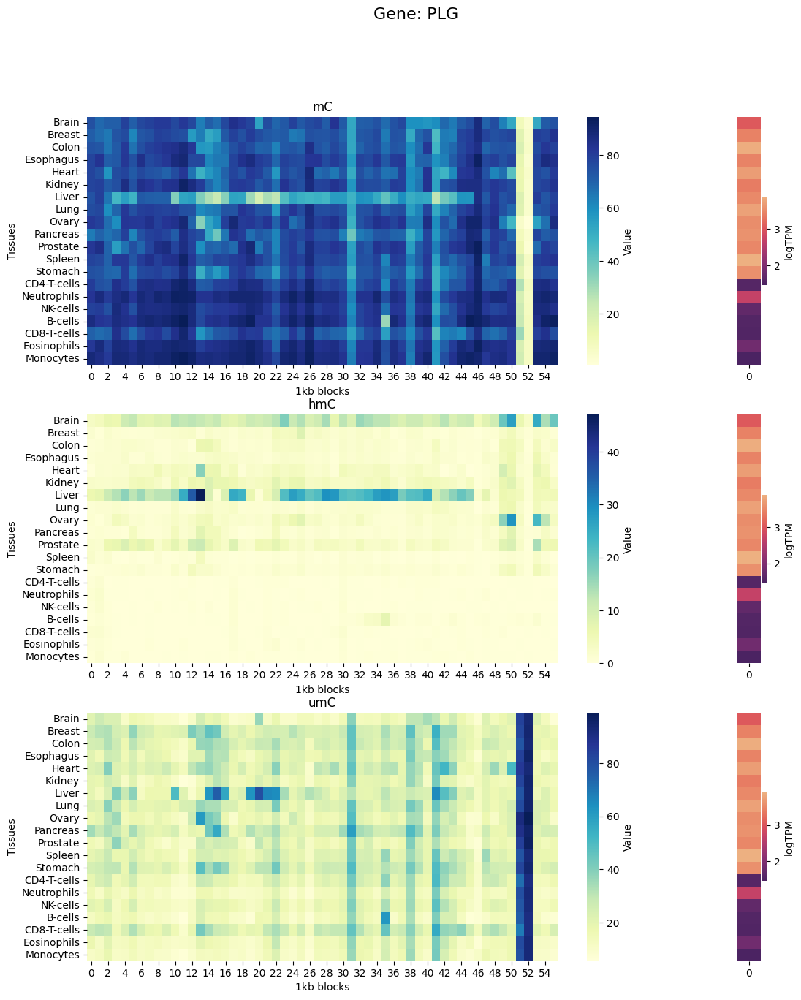

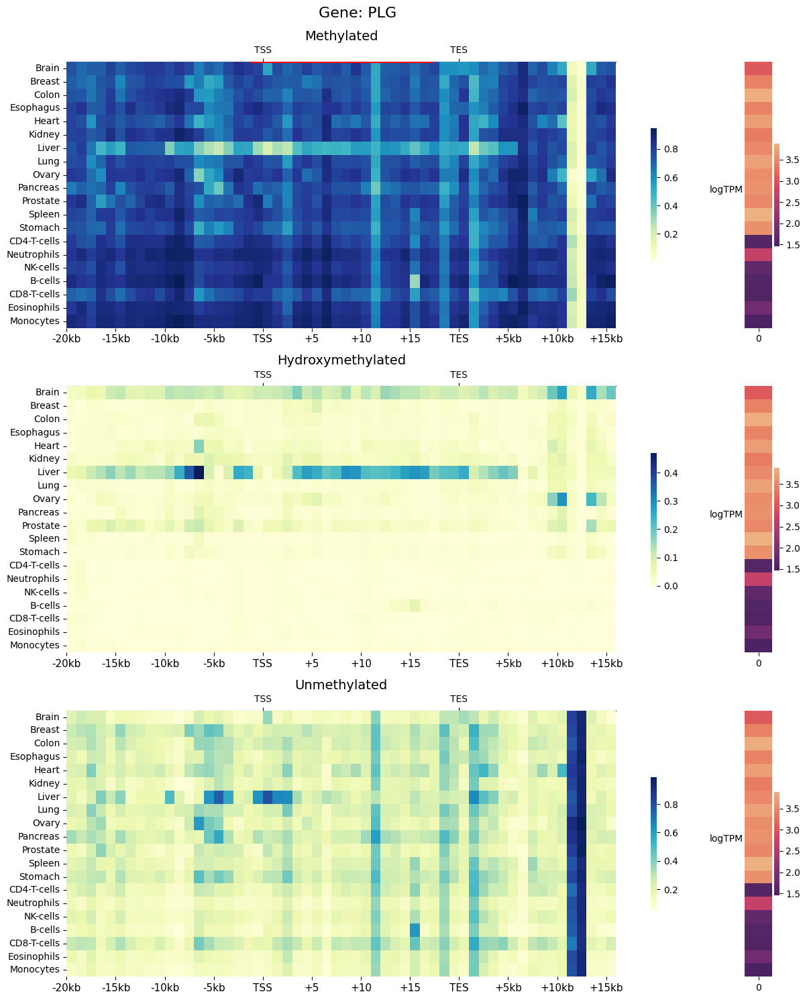

In [20]:













# Plotting the heatmaps
fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [20, 1]})

# fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [5, 1]})

sns.heatmap(mC_data.T, ax=axes[0, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
axes[0, 0].set_title('mC')
axes[0, 0].set_ylabel('Tissues')
axes[0, 0].set_xlabel('1kb blocks')

sns.heatmap(hmC_data.T, ax=axes[1, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
axes[1, 0].set_title('hmC')
axes[1, 0].set_ylabel('Tissues')
axes[1, 0].set_xlabel('1kb blocks')

sns.heatmap(umC_data.T, ax=axes[2, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
axes[2, 0].set_title('umC')
axes[2, 0].set_ylabel('Tissues')
axes[2, 0].set_xlabel('1kb blocks')


# fig.suptitle(f"Gene: {selected_gene}, Strand: {strand}",fontsize=16)
fig.suptitle(f"Gene: {selected_gene}",fontsize=16)

# Secondary heatmap (logTPM values)
for i in range(3):
    sns.heatmap(logTPM, ax=axes[i, 1], cmap='flare_r', cbar_kws={'label': 'logTPM'}, yticklabels=tissues)
    axes[i, 1].set_yticks([])  # Hide y-ticks for logTPM plots
    axes[i, 1].set_ylabel('')  # Hide y-labels for logTPM plots
    
    
    
    
    

# positions = 60
# custom_labels = ['' for _ in range(positions)]
# for i in range(0, positions, 5):
#     if i < 20:
#         custom_labels[i] = 'TSS-{}kb'.format(20 - i)
#     elif i == 20:
#         custom_labels[i] = 'TSS'
#     elif i <= 39:
#         custom_labels[i] = 'TSS+{}'.format(i - 20)

#     elif i==40:
#         custom_labels[i] = 'TES'.format(i - 20)
#     else:
#         custom_labels[i] = 'TES+{}kb'.format(i - 40)  # Labels for positions after TES




positions = 60
custom_labels = ['' for _ in range(positions)]
for i in range(0, positions, 5):
    if i < 20:
        custom_labels[i] = '-{}kb'.format(20 - i)
    elif i == 20:
        custom_labels[i] = 'TSS'
    elif i <= 39:
        custom_labels[i] = '+{}'.format(i - 20)

    elif i==40:
        custom_labels[i] = 'TES'.format(i - 20)
    else:
        custom_labels[i] = '+{}kb'.format(i - 40)  # Labels for positions after TES

# Plotting the heatmaps
fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [20, 1]})

# fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [5, 1]})

sns.heatmap(mC_data.T/100, ax=axes[0, 0], cmap='YlGnBu', cbar_kws={'shrink': 0.5}, yticklabels=tissues)
axes[0, 0].set_title('Methylated',fontsize=14)
axes[0, 0].set_ylabel('Tissues')
# axes[0, 0].set_xlabel('1kb blocks')

ax0 = axes[0, 0]
ax0.axhline(y=-0.01, xmin=(0.335), xmax=(0.665), color='red', linestyle='-', linewidth=2)


sns.heatmap(hmC_data.T/100, ax=axes[1, 0], cmap='YlGnBu', cbar_kws={'shrink': 0.5}, yticklabels=tissues)
axes[1, 0].set_title('Hydroxymethylated',fontsize=14)
axes[1, 0].set_ylabel('Tissues')
# axes[1, 0].set_xlabel('1kb blocks')

sns.heatmap(umC_data.T/100, ax=axes[2, 0], cmap='YlGnBu', cbar_kws={'shrink': 0.5}, yticklabels=tissues)
axes[2, 0].set_title('Unmethylated',fontsize=14)
axes[2, 0].set_ylabel('Tissues')
# axes[2, 0].set_xlabel('1kb blocks')


# fig.suptitle(f"Gene: {selected_gene}, Strand: {strand}",fontsize=16)
fig.suptitle(f"Gene: {selected_gene}",
             fontsize=16,
            ha='left', va='top',
             x=0.4,y=0.99)

# Secondary heatmap (logTPM values)
for i in range(3):
    sns.heatmap(logTPM, ax=axes[i, 1], cmap='flare_r', cbar_kws={'shrink': 0.5}, yticklabels=tissues)
    axes[i, 1].set_yticks([])  # Hide y-ticks for logTPM plots
    axes[i, 1].set_ylabel('logTPM',rotation=0,labelpad=20)  # Hide y-labels for logTPM plots
    
    
    ax = axes[i,0]
#     ax.set_xticks(np.arange(0,positions))
    ax.set_xticks(np.arange(0,positions,5))
    ax.set_xticklabels([u for u in custom_labels if u],fontsize=11)
    
    ax2 = ax.secondary_xaxis('top')
    ax2.set_xticks([20, 40])
    ax2.set_xticklabels(['TSS', 'TES'])
    
    ax.set_xlabel('')
    ax.set_ylabel('')

    
    
plt.tight_layout()

# fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/ge_predict/"
# plt.savefig(fig_savedir + f"20kb_gene_normalised_windows.mC_hmC_umC_heatmap.{gene_name}.logTPM.thesis_clean.png",
#            dpi=300)


### Data distributions directly before model training

In [21]:
model_name = "1kb_bins.new_data.leave_one_out.no_brain.exp43." # after switching order for - strand genes
data_load_name = "20kb_upstream_downstream_gene_equal_bins."

## Save a section of the data to examine
examine_data_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/predict_ge/1kb_model/examine_data/"

# n = 10000
# data_tensor_filtered_subset = data_tensor_filtered[:n]
# rna_seq_values_subset = rna_seq_values[:n]
# rna_seq_values_df_subset = rna_seq_values_df.iloc[:n]

data_tensor_filtered_subset = np.load(examine_data_dir + data_load_name + "data_tensor_filtered.npy")
rna_seq_values_subset = np.load(examine_data_dir + data_load_name + "rna_seq_values_subset.npy")
rna_seq_values_df_subset = pd.read_csv(examine_data_dir + data_load_name + "gene_tissue_combinations_rnaseq_subset.csv", sep='\t')


In [22]:
rna_seq_values_subset.shape

(10000,)

In [23]:
data_tensor_filtered_subset.shape

(10000, 3, 60)

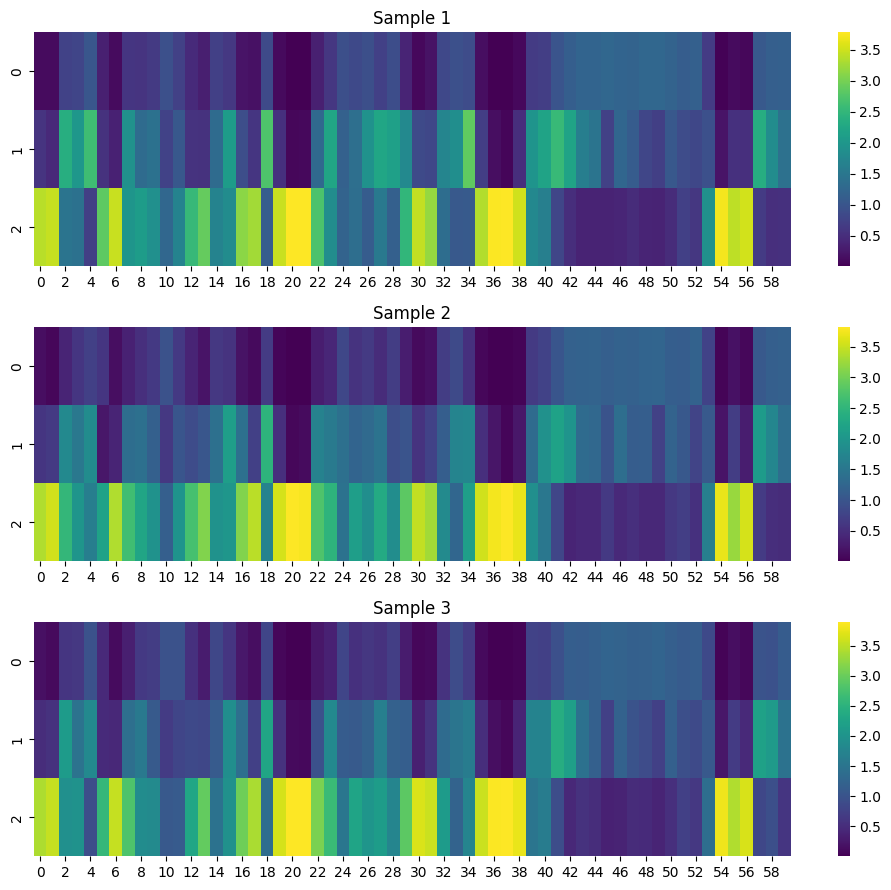

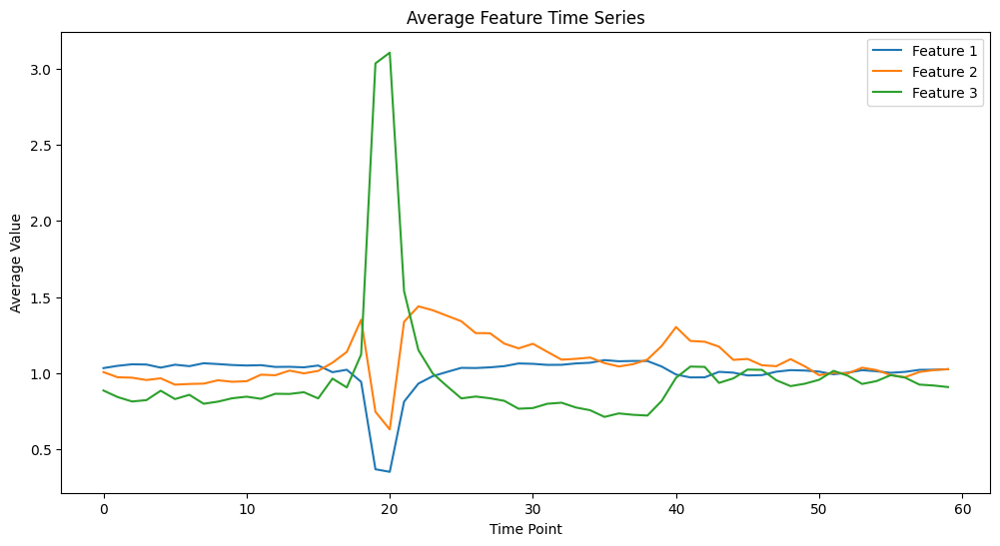

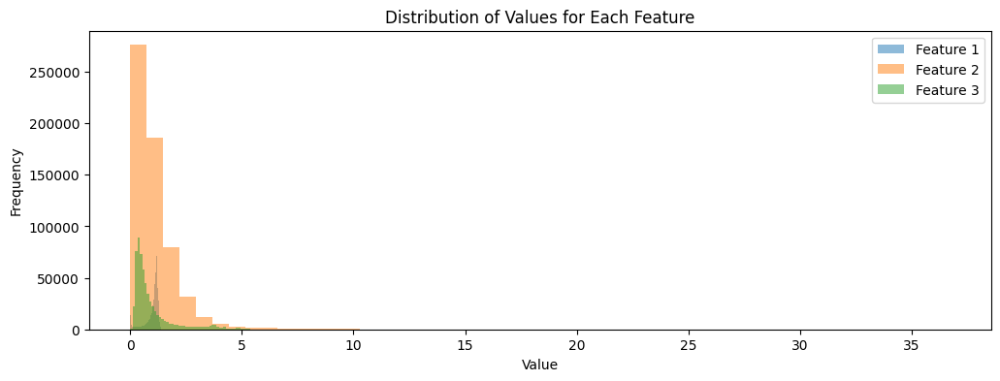

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.decomposition import PCA


# 1. Heatmaps for a subset of samples
fig, axs = plt.subplots(3, 1, figsize=(10, 9))
for i in range(3):
    sns.heatmap(data_tensor_filtered_subset[i, :, :], ax=axs[i], cmap='viridis')
    axs[i].set_title(f'Sample {i+1}')
plt.tight_layout()
plt.show()

# 2. Average Feature Time Series
average_feature_series = data_tensor_filtered_subset.mean(axis=0)
plt.figure(figsize=(12, 6))
for i in range(3):
    plt.plot(average_feature_series[i, :], label=f'Feature {i+1}')
plt.title('Average Feature Time Series')
plt.xlabel('Time Point')
plt.ylabel('Average Value')
plt.legend()
plt.show()

# 3. Distribution of Values for Each Feature
plt.figure(figsize=(12, 4))
for i in range(3):
    plt.hist(data_tensor_filtered_subset[:, i, :].flatten(), bins=50, alpha=0.5, label=f'Feature {i+1}')
plt.title('Distribution of Values for Each Feature')
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.legend()
plt.show()


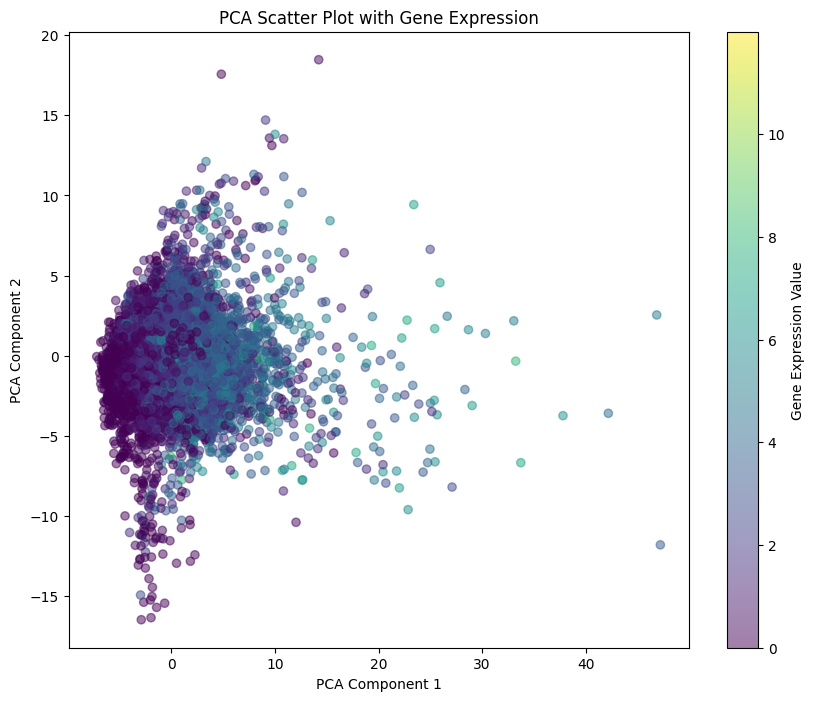

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.decomposition import PCA


data_flattened = data_tensor_filtered_subset.reshape(data_tensor_filtered_subset.shape[0], -1)
pca = PCA(n_components=2)
data_pca = pca.fit_transform(data_flattened)

# Plot
plt.figure(figsize=(10, 8))
scatter = plt.scatter(data_pca[:, 0], data_pca[:, 1], c=rna_seq_values_subset, alpha=0.5, cmap='viridis')
plt.title('PCA Scatter Plot with Gene Expression')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.colorbar(scatter, label='Gene Expression Value')
plt.show()


## Data availability

### Select genomic features to include

In [8]:
feature_subset = [f'MANE_genes.nearest_promoter{suffix}',
                 f'MANE_genes.nearest_enhancer{suffix}',
                 'MANE.GRCh38.v1.0.genes']

epigenetic_features = [item + "." + suffix for item in feature_subset for suffix in ['TAPSbeta','CAPS']  ]


### Make mapping from genomic region to gene_name

In [9]:
feature_pos_gene_map = {}

default_cols = ['chr', 'start', 'end', 'gene']
for feature in feature_subset:
    if feature=="MANE.GRCh38.v1.0.genes":
        colnames = default_cols + ['gene_name']
    elif feature=="MANE.GRCh38.v1.0.genes.stranded.2kb_upstream":
        colnames = default_cols + ['gene_name','strand']
    elif feature=="gencode.v42.annotation.protein_coding_only":
        colnames = default_cols + ['gene_name','level','strand']
    elif feature=="gencode.v42.annotation.Ensembl.canonical.autosomal.Exon1":
        colnames = default_cols + ['strand']
    elif 'MANE_genes.nearest' in feature:
        colnames = default_cols +  ['distance','tss_chr', 'tss_start', 'tss_end', 'gene_name']
        
    if '.bed' in feature:
        feature = feature.replace('.bed','')
    
    
# feature = select_features[0]
    feature_bed = pd.read_csv(genomic_regions_dir + feature + '.bed',
                          sep='\t',
                         names=colnames)

    feature_bed['chr_start_end'] = feature_bed['chr'] + '_' + feature_bed['start'].astype(str) + '_' + feature_bed['end'].astype(str)
    if feature in ["GeneHancer.double_elite_enhancer.sorted",
                   'gencode.v42.annotation.protein_coding_only',
                  'MANE.GRCh38.v1.0.genes',
                  'MANE.GRCh38.v1.0.genes.stranded.2kb_upstream']:
        feature_bed[['gene','version']] = feature_bed['gene'].str.split('.',expand=True)
#     feature_bed[['gene','version']] = feature_bed['gene'].str.split('.',expand=True)

    feature_pos_gene_map[feature] = feature_bed.set_index('chr_start_end')['gene'].to_dict()

    
    
gene_id_to_name_dict = feature_bed.set_index('gene')['gene_name'].to_dict()
gene_name_to_id_dict = feature_bed.set_index('gene_name')['gene'].to_dict()



# colnames = ['distance','tss_chr', 'tss_start', 'tss_end', 'gene_name']
colnames = ['feature_chr',
 'feature_start',
 'feature_end',
 'feature_name',
 'distance',
 'tss_chr',
 'tss_start',
 'tss_end',
 'gene_name']


    
for feature in [f'MANE_genes.nearest_promoter{suffix}',f'MANE_genes.nearest_enhancer{suffix}']:


    
# feature = select_features[0]
    feature_bed = pd.read_csv(genomic_regions_dir + feature + '.bed',
                          sep='\t',
                         names=colnames)

    feature_bed['chr_start_end'] = feature_bed['feature_chr'] + '_' + feature_bed['feature_start'].astype(str) + '_' + feature_bed['feature_end'].astype(str)
#     if feature in ["GeneHancer.double_elite_enhancer.sorted",
#                    'gencode.v42.annotation.protein_coding_only',
#                   'MANE.GRCh38.v1.0.genes',
#                   'MANE.GRCh38.v1.0.genes.stranded.2kb_upstream']:
#         feature_bed[['gene','version']] = feature_bed['gene'].str.split('.',expand=True)
#     feature_bed[['gene','version']] = feature_bed['gene'].str.split('.',expand=True)

    feature_bed['gene_id'] = feature_bed['gene_name'].map(gene_name_to_id_dict)
    feature_pos_gene_map[feature] = feature_bed.set_index('chr_start_end')['gene_id'].to_dict()
    

In [10]:
feature_pos_gene_map.keys()

dict_keys(['MANE_genes.nearest_promoter.200bp_padding.CpG_only', 'MANE_genes.nearest_enhancer.200bp_padding.CpG_only', 'MANE.GRCh38.v1.0.genes'])

Using existing atlas DF across MANE_genes.nearest_promoter.200bp_padding.CpG_only with min CpG coverage > 0

Looking in /well/ludwig/users/dyp502/tissue_atlas_v3/intersections/ for files with this suffix:
 _TAPSbeta_CG.merged.filtered.MANE_genes.nearest_promoter.200bp_padding.CpG_only.bed.gz



122 samples selected: removing []


Checking if this file exists: /well/ludwig/users/dyp502/tissue_atlas_v3/atlas/tissue_samples_ratio_TAPSbeta.CpG_context.cpgs_merged.MANE_genes.nearest_promoter.200bp_padding.CpG_only.minCpG_0.six_sample_outliers_removed.weighted_mr.csv
Just loading existing files from /well/ludwig/users/dyp502/tissue_atlas_v3/atlas/tissue_samples_ratio_TAPSbeta.CpG_context.cpgs_merged.MANE_genes.nearest_promoter.200bp_padding.CpG_only.minCpG_0.six_sample_outliers_removed.weighted_mr.csv

Merged atlas for TAPSbeta MANE_genes.nearest_promoter.200bp_padding.CpG_only has shape (16765, 34)
Using existing atlas DF across MANE_genes.nearest_enhancer.200bp_padding.CpG_only with min Cp

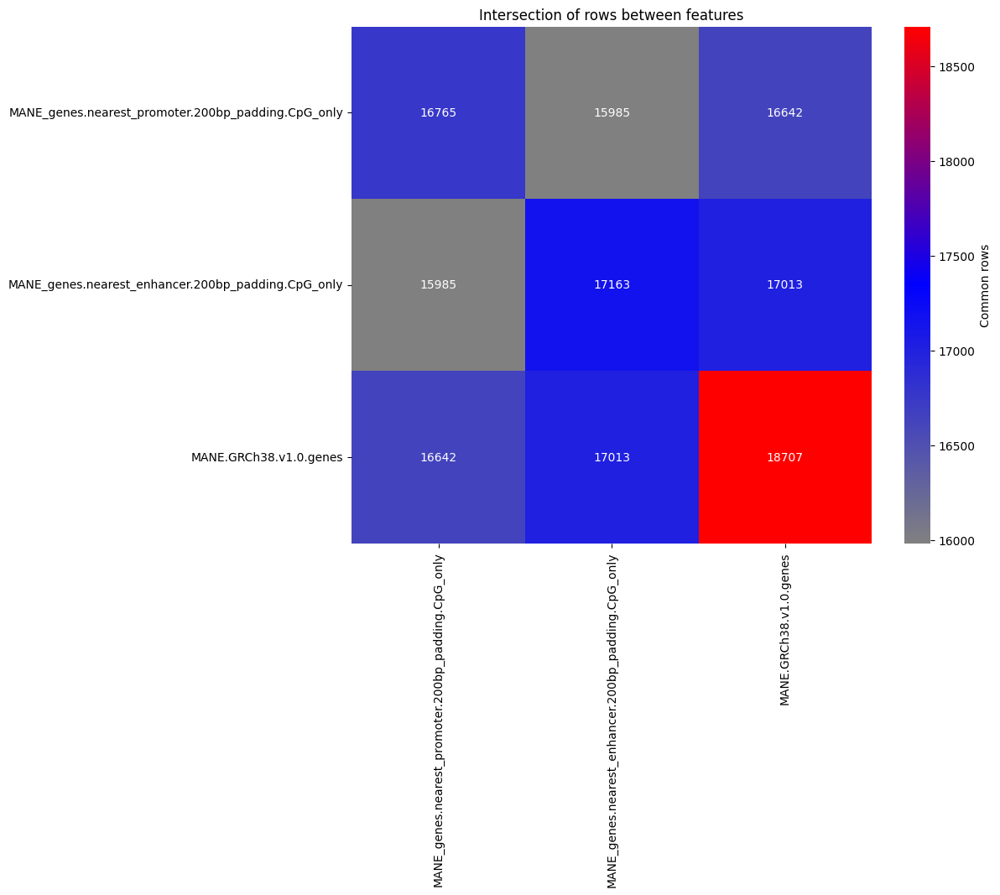

In [11]:
# Initialize an empty dictionary to hold dataframes
feature_dfs = {}
# Initialize an empty DataFrame to hold intersections
intersections_df = pd.DataFrame(index=feature_subset, columns=feature_subset)

min_cpg_read_count = 0
use_weighted_mr = True
exp = "TAPSbeta"

intersections_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/intersections/"
atlas_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/atlas/"
distinct_name = '.six_sample_outliers_removed'
# Process all features
for feature in feature_subset:#[0:1]:
    tissue_samples_mr, _ = merge_filter_new_tissue_samples(feature,
                                                            min_cpg_read_count,
#                                                             remove_samples = remove_samples,
                                                            exp=exp,
                                                            merge_cpgs=True,
                                                            overwrite=False,
                                                            save=False,
                                                            savedir=atlas_dir,
                                                           use_weighted_mr=use_weighted_mr,
                                                            intersections_dir=intersections_dir,
                                                            distinct_name=distinct_name, 
                                                            )
    tissue_samples_mr = tissue_samples_mr.rename(columns={u:u.replace('_CG','') for u in tissue_samples_mr.columns}).dropna()  
    if 'MANE_genes.nearest' in feature:
        mr_df = tissue_samples_mr.rename(index=feature_pos_gene_map[feature])
    mr_df = tissue_samples_mr.rename(index=feature_pos_gene_map[feature])
    mr_atlas = make_tissue_average_df(mr_df,tissue_id_map)
    print(f"\nMerged atlas for {exp} {feature} has shape {mr_atlas.shape}")
    mr_atlas = mr_atlas.rename(columns={u:f"{u}.{feature}" for u in mr_atlas.columns})
    mr_atlas = mr_atlas.drop_duplicates()
    feature_dfs[f"{exp}_{feature}"] = mr_atlas

    
    
    
# Calculate intersections
for feature_i in feature_subset:
    for feature_j in feature_subset:
        if feature_i != feature_j:
            intersections_df.loc[feature_i, feature_j] = len(set(feature_dfs[f"{exp}_{feature_i}"].index) & set(feature_dfs[f"{exp}_{feature_j}"].index))

# Fill diagonal with original dataframe sizes
np.fill_diagonal(intersections_df.values, [feature_dfs[f"{exp}_{feature}"].shape[0] for feature in feature_subset])

cmap = colors.LinearSegmentedColormap.from_list("", ["grey","blue","red"])

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(intersections_df, dtype=bool))

intersections_df = intersections_df.fillna(-1)  # Fill NaNs with -1
    
plt.figure(figsize=(10, 8))
sns.heatmap(intersections_df, 
            annot=True, 
            fmt='.0f',
            cmap=cmap,
#             mask=mask,
            cbar_kws={'label': 'Common rows'})
plt.title('Intersection of rows between features')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()



### Repeat for CAPS

Using existing atlas DF across MANE_genes.nearest_promoter.200bp_padding.CpG_only with min CpG coverage > 0

Looking in /well/ludwig/users/dyp502/tissue_atlas_v3/intersections/ for files with this suffix:
 _CAPS_CG.merged.filtered.MANE_genes.nearest_promoter.200bp_padding.CpG_only.bed.gz



122 samples selected: removing []


Checking if this file exists: /well/ludwig/users/dyp502/tissue_atlas_v3/atlas/tissue_samples_ratio_CAPS.CpG_context.cpgs_merged.MANE_genes.nearest_promoter.200bp_padding.CpG_only.minCpG_0.six_sample_outliers_removed.weighted_mr.csv
Just loading existing files from /well/ludwig/users/dyp502/tissue_atlas_v3/atlas/tissue_samples_ratio_CAPS.CpG_context.cpgs_merged.MANE_genes.nearest_promoter.200bp_padding.CpG_only.minCpG_0.six_sample_outliers_removed.weighted_mr.csv

Merged atlas for CAPS MANE_genes.nearest_promoter.200bp_padding.CpG_only has shape (16760, 34)
Using existing atlas DF across MANE_genes.nearest_enhancer.200bp_padding.CpG_only with min CpG coverage > 0



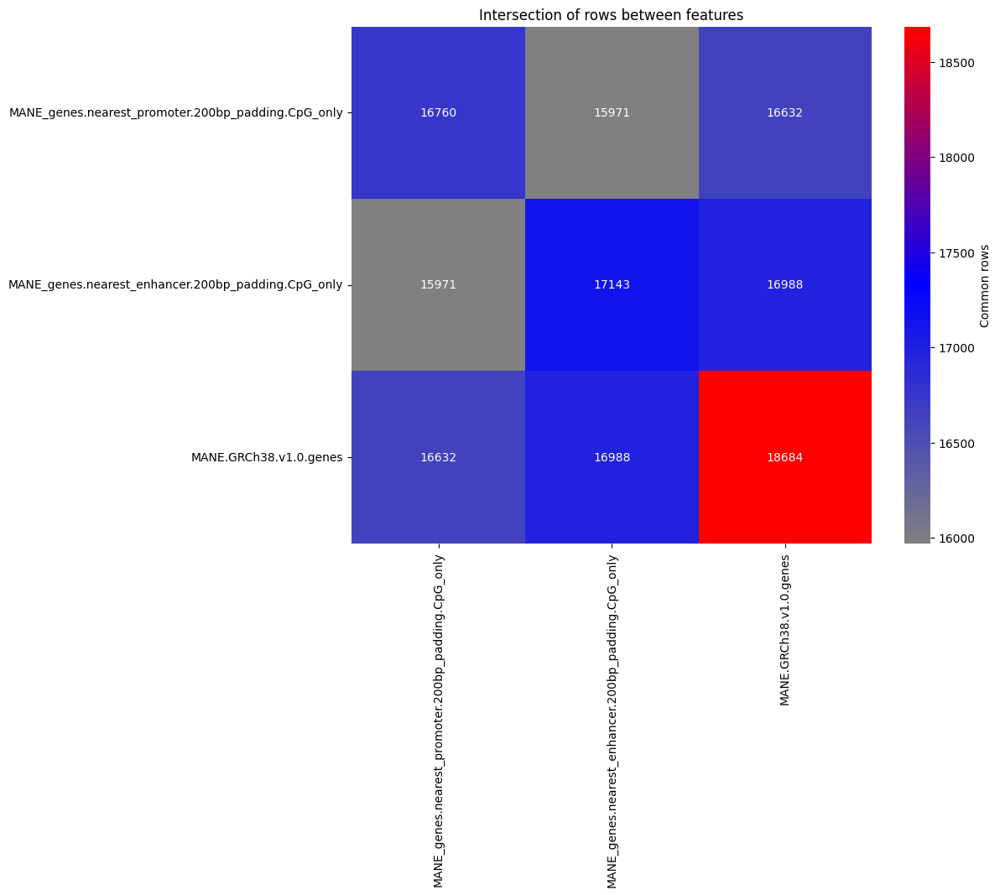

In [12]:
# Initialize an empty dictionary to hold dataframes
# feature_dfs = {}
# Initialize an empty DataFrame to hold intersections
intersections_df = pd.DataFrame(index=feature_subset, columns=feature_subset)

min_cpg_read_count = 0
use_weighted_mr = True
exp = "CAPS"

intersections_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/intersections/"
atlas_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/atlas/"
distinct_name = '.six_sample_outliers_removed'
# Process all features
for feature in feature_subset:#[0:1]:
    tissue_samples_mr, _ = merge_filter_new_tissue_samples(feature,
                                                            min_cpg_read_count,
#                                                             remove_samples = remove_samples,
                                                            exp=exp,
                                                            merge_cpgs=True,
                                                            overwrite=False,
                                                            save=False,
                                                            savedir=atlas_dir,
                                                           use_weighted_mr=use_weighted_mr,
                                                            intersections_dir=intersections_dir,
                                                            distinct_name=distinct_name, 
                                                            )
    tissue_samples_mr = tissue_samples_mr.rename(columns={u:u.replace('_CG','') for u in tissue_samples_mr.columns}).dropna()  
    if 'MANE_genes.nearest' in feature:
        mr_df = tissue_samples_mr.rename(index=feature_pos_gene_map[feature])
    mr_df = tissue_samples_mr.rename(index=feature_pos_gene_map[feature])
    mr_atlas = make_tissue_average_df(mr_df,tissue_id_map)
    print(f"\nMerged atlas for {exp} {feature} has shape {mr_atlas.shape}")
    mr_atlas = mr_atlas.rename(columns={u:f"{u}.{feature}" for u in mr_atlas.columns})
    mr_atlas = mr_atlas.drop_duplicates()
    feature_dfs[f"{exp}_{feature}"] = mr_atlas

    
    
    
# Calculate intersections
for feature_i in feature_subset:
    for feature_j in feature_subset:
        if feature_i != feature_j:
            intersections_df.loc[feature_i, feature_j] = len(set(feature_dfs[f"{exp}_{feature_i}"].index) & set(feature_dfs[f"{exp}_{feature_j}"].index))

# Fill diagonal with original dataframe sizes
np.fill_diagonal(intersections_df.values, [feature_dfs[f"{exp}_{feature}"].shape[0] for feature in feature_subset])

# Create a colormap
cmap = colors.LinearSegmentedColormap.from_list("", ["grey","blue","red"])

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(intersections_df, dtype=bool))

intersections_df = intersections_df.fillna(-1)  # Fill NaNs with -1

plt.figure(figsize=(10, 8))
sns.heatmap(intersections_df, 
            annot=True, 
            fmt='.0f',
            cmap=cmap,
#             mask=mask,
            cbar_kws={'label': 'Common rows'})
plt.title('Intersection of rows between features')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

In [13]:
feature_dfs.keys()

dict_keys(['TAPSbeta_MANE_genes.nearest_promoter.200bp_padding.CpG_only', 'TAPSbeta_MANE_genes.nearest_enhancer.200bp_padding.CpG_only', 'TAPSbeta_MANE.GRCh38.v1.0.genes', 'CAPS_MANE_genes.nearest_promoter.200bp_padding.CpG_only', 'CAPS_MANE_genes.nearest_enhancer.200bp_padding.CpG_only', 'CAPS_MANE.GRCh38.v1.0.genes'])

In [14]:
# feature_dfs['TAPSbeta_MANE_genes.nearest_enhancer.200bp_padding']

In [15]:
# feature_dfs['CAPS_MANE_genes.nearest_promoter.200bp_padding']

In [16]:
feature_dfs.keys()

dict_keys(['TAPSbeta_MANE_genes.nearest_promoter.200bp_padding.CpG_only', 'TAPSbeta_MANE_genes.nearest_enhancer.200bp_padding.CpG_only', 'TAPSbeta_MANE.GRCh38.v1.0.genes', 'CAPS_MANE_genes.nearest_promoter.200bp_padding.CpG_only', 'CAPS_MANE_genes.nearest_enhancer.200bp_padding.CpG_only', 'CAPS_MANE.GRCh38.v1.0.genes'])

In [17]:
tissue_samples_mr

,CD564876_Kidney-Tumour,UKVAC-003-6_Eosinophils,UKVAC-003-6_Neutrophils,CD564076_Breast-Tumour,CD564797_Liver,UKVAC-003-6_Monocytes,CD565341_Pancreas,CD563778_Kidney,CD564971_Colon-Tumour,UKVAC-001-5_B-cells,...,CD563854_Lung,CD563430_Stomach,UKVAC-003-6_NK-cells,CD564572_Lung-Tumour,CD564242_Prostate,CD563278_Liver-Cirrhosis,CD565136_Esophagus,D70_CD34-erythroblasts,D30_CD34-megakaryocytes,UKVAC-140_B-cells
chr_start_end,,,,,,,,,,,,,,,,,,,,,
chr10_100042193_100081869,0.008210,0.008622,0.010879,0.014725,0.117918,0.008590,0.017973,0.046440,0.004148,0.007014,...,0.013959,0.015867,0.002773,0.007656,0.025496,0.015416,0.032493,0.005367,0.008557,0.005709
chr10_100150094_100186033,0.014210,0.014801,0.021238,0.018433,0.120501,0.018504,0.039714,0.061817,0.009464,0.006601,...,0.029678,0.037912,0.011128,0.013195,0.038142,0.022659,0.053511,0.005536,0.010586,0.007221
chr10_100188300_100229596,0.012205,0.008680,0.007211,0.014068,0.074976,0.007302,0.033308,0.070627,0.007771,0.005508,...,0.021196,0.022049,0.006481,0.008660,0.033338,0.015663,0.042753,0.007681,0.008970,0.005956
chr10_100232298_100267680,0.014211,0.011199,0.013841,0.015118,0.059760,0.019803,0.029322,0.045378,0.006873,0.016868,...,0.018850,0.019594,0.010459,0.011781,0.029097,0.015456,0.041591,0.006911,0.008993,0.016736
chr10_100273280_100286680,0.016620,0.011845,0.008934,0.016620,0.070130,0.016304,0.031023,0.051131,0.011657,0.037433,...,0.025604,0.021939,0.009765,0.017149,0.030115,0.024070,0.048433,0.007507,0.006867,0.040660
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
chrX_96883908_96885467,0.010599,0.005642,0.007812,0.006547,0.085221,0.015674,0.019868,0.074483,0.004559,0.001005,...,0.021472,0.033159,0.006944,0.007003,0.021053,0.013536,0.080139,0.000000,0.007557,0.000903
chrX_9725346_9786297,0.011672,0.004523,0.003889,0.015044,0.059187,0.004260,0.029947,0.083888,0.005677,0.003200,...,0.017573,0.019668,0.004656,0.013121,0.040642,0.014683,0.041106,0.005131,0.004171,0.003002
chrX_9786429_9949443,0.014068,0.005666,0.004808,0.023842,0.142388,0.006198,0.064791,0.127794,0.007999,0.004419,...,0.029995,0.038312,0.005623,0.016440,0.075760,0.026744,0.050853,0.004737,0.006418,0.003783


### Make tissue atlas long

In [18]:
intersections_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/intersections/"
atlas_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/atlas/"

tissue_samples_distinct_name_map = {
    ".six_sample_outliers_removed":['CD563569_Liver','CD563504_Spleen','CD563320_Spleen','C707005_Heart','C707007_Thymus','C603405_Bone-Marrow'],
    "": []
}

use_weighted_mr = True
min_cpg_read_count = 0
# min_cpg_read_count = 3
all_features  = []
feature_names = []
k=0
for exp in ["TAPSbeta","CAPS"]:
#     for feature in select_features[0:3] + [select_features[4]]:
    for feature in feature_subset:


        distinct_name = '.six_sample_outliers_removed'
        remove_samples = tissue_samples_distinct_name_map[distinct_name]
        print(f"{distinct_name} so removing samples: {remove_samples}")
        print(f"Merging {exp} over {feature} with min_cpg_read_count: {min_cpg_read_count}")
        tissue_samples_mr, tissue_samples_meth_total = merge_filter_new_tissue_samples(feature,
                                                                                        min_cpg_read_count,
                                                                                        remove_samples = remove_samples,
                                                                                        exp=exp,
                                                                                        merge_cpgs=True,
                                                                                        overwrite=False,
                                                                                        save=False,
                                                                                        savedir=atlas_dir,
                                                                                        use_weighted_mr=use_weighted_mr,
                                                                                        intersections_dir=intersections_dir,
                                                                                        distinct_name=distinct_name, 
                                                                                        )

        tissue_samples_mr = tissue_samples_mr.dropna()
        mr_df = tissue_samples_mr.rename(index=feature_pos_gene_map[feature])
        mr_atlas = make_tissue_average_df(mr_df,tissue_id_map)
        mr_atlas = mr_atlas.reset_index().melt(id_vars='chr_start_end', var_name='tissue', value_name='beta')
        print(f"\nMerged atlas for {exp} {feature} has shape {mr_atlas.shape}")

        
        
        mr_atlas = mr_atlas.rename(columns={'beta':f"{feature}.{exp}",'chr_start_end':'gene'})
        feature_names.append(f"{feature}.{exp}")
        mr_atlas = mr_atlas.drop_duplicates()
        if k==0:
            all_epigenetic_features = mr_atlas
        else:
            all_epigenetic_features = all_epigenetic_features.merge(mr_atlas,on=['gene','tissue'])
#         all_features.append(mr_atlas)


#         all_features_merged = all_features_merged.merge(mr_atlas,left_index=True,right_index=True)
        k+=1
        print(f"\n{exp} - {feature}")
        print(f"Now have {all_epigenetic_features.shape[0]} rows remaining\n\n")
        
        
        
        
        

    
    
    


.six_sample_outliers_removed so removing samples: ['CD563569_Liver', 'CD563504_Spleen', 'CD563320_Spleen', 'C707005_Heart', 'C707007_Thymus', 'C603405_Bone-Marrow']
Merging TAPSbeta over MANE_genes.nearest_promoter.200bp_padding.CpG_only with min_cpg_read_count: 0
Using existing atlas DF across MANE_genes.nearest_promoter.200bp_padding.CpG_only with min CpG coverage > 0

Looking in /well/ludwig/users/dyp502/tissue_atlas_v3/intersections/ for files with this suffix:
 _TAPSbeta_CG.merged.filtered.MANE_genes.nearest_promoter.200bp_padding.CpG_only.bed.gz



116 samples selected: removing ['CD563569_Liver', 'CD563504_Spleen', 'CD563320_Spleen', 'C707005_Heart', 'C707007_Thymus', 'C603405_Bone-Marrow']


Checking if this file exists: /well/ludwig/users/dyp502/tissue_atlas_v3/atlas/tissue_samples_ratio_TAPSbeta.CpG_context.cpgs_merged.MANE_genes.nearest_promoter.200bp_padding.CpG_only.minCpG_0.six_sample_outliers_removed.weighted_mr.csv
Just loading existing files from /well/ludwig/users/dyp

#### Make mapping from tissue_atlas tissue names to RNA-seq tissue names

In [19]:
# tissue_names = [u.lower() for u in tissue_id_map.keys()]
tissue_names = list(tissue_id_map.keys())
rna_seq_tissues = list(rna_seq.columns[2:-1])


def clean_string(s):
    return s.split('-')[0]  # Split on hyphens and take the first part

# Create a lowercased version of match_tissue_list for comparison
match_tissue_list_lower = [clean_string(tissue.lower()) for tissue in rna_seq_tissues]

mapping = {}

for tissue in tissue_names:
    tissue_clean = clean_string(tissue.lower())
    for match in match_tissue_list_lower:
        if tissue_clean in match:
            mapping[tissue] = match
            break  # Found a match, go to the next tissue
        else:
            mapping[tissue] = ""  # Default case if no match is found
            
            
            
mapping['Neutrophils'] = 'neutrophil'
mapping['B-cells'] =  'naive B-cell' # 'memory B-cell'
mapping['Eosinophils'] = 'eosinophil'
mapping['Monocytes'] = 'classical monocyte'
mapping['NK-cells'] = 'NK-cell'
mapping['CD4-T-cells'] = 'memory CD4 T-cell'
mapping['CD8-T-cells'] = 'memory CD8 T-cell'

In [20]:
rna_seq

,Name,Description,adipose tissue,adrenal gland,amygdala,appendix,basal ganglia,bone marrow,breast,cerebellum,...,naive B-cell,naive CD4 T-cell,naive CD8 T-cell,neutrophil,NK-cell,non-classical monocyte,plasmacytoid DC,T-reg,total PBMC,version
core_gene,,,,,,,,,,,,,,,,,,,,,
ENSG00000000003,ENSG00000000003,TSPAN6,29.6,18.2,7.2,4.9,7.5,0.6,34.2,7.2,...,0.1,2.1,1.2,0.3,0.1,0.1,0.1,0.0,0.3,0
ENSG00000000005,ENSG00000000005,TNMD,21.1,0.2,0.2,0.6,0.1,0.0,12.9,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
ENSG00000000419,ENSG00000000419,DPM1,40.9,53.4,23.0,34.3,23.9,59.3,42.7,24.4,...,16.1,20.0,22.4,20.0,19.1,18.6,21.7,19.5,16.1,0
ENSG00000000457,ENSG00000000457,SCYL3,5.6,5.8,2.7,7.4,3.0,4.0,10.9,4.0,...,6.2,7.0,5.8,6.7,10.7,3.8,11.5,8.1,4.8,0
ENSG00000000460,ENSG00000000460,C1orf112,1.8,1.2,0.6,3.3,0.9,9.0,2.9,1.7,...,1.4,0.3,0.5,0.1,2.1,2.3,0.4,0.7,0.6,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000288677,ENSG00000288677,AC105206.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
ENSG00000288678,ENSG00000288678,AL136115.4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.2,0.3,0.0,0.4,0.0,3.9,0
ENSG00000288681,ENSG00000288681,AC136475.9,0.0,0.0,0.1,0.2,0.0,0.0,0.0,0.3,...,13.3,10.6,29.8,473.0,87.7,53.0,2.8,6.4,170.9,0


In [21]:
all_epigenetic_features['rna_seq_tissue_name'] = all_epigenetic_features['tissue'].map(mapping)

df = rna_seq
df_reset = df.reset_index()

rna_seq_melted = df_reset.melt(id_vars='core_gene', var_name='tissue', value_name='tpm')

# Rename the 'index' column to 'gene'
rna_seq_melted = rna_seq_melted.rename(columns={'core_gene': 'gene'})

epigenetic_rna_seq_merged = all_epigenetic_features.merge(rna_seq_melted,left_on=['gene','rna_seq_tissue_name'],right_on=['gene','tissue'])



In [22]:
epigenetic_rna_seq_merged

,gene,tissue_x,MANE_genes.nearest_promoter.200bp_padding.CpG_only.TAPSbeta,MANE_genes.nearest_enhancer.200bp_padding.CpG_only.TAPSbeta,MANE.GRCh38.v1.0.genes.TAPSbeta,MANE_genes.nearest_promoter.200bp_padding.CpG_only.CAPS,MANE_genes.nearest_enhancer.200bp_padding.CpG_only.CAPS,MANE.GRCh38.v1.0.genes.CAPS,rna_seq_tissue_name,tissue_y,tpm
0,ENSG00000107554,Colon,0.006164,0.738144,0.667046,0.001712,0.104701,0.072363,colon,colon,17.7
1,ENSG00000107554,Colon-Tumour,0.006557,0.730122,0.707110,0.002572,0.011475,0.015040,colon,colon,17.7
2,ENSG00000120054,Colon,0.470411,0.367002,0.762850,0.017246,0.014455,0.021946,colon,colon,0.0
3,ENSG00000120054,Colon-Tumour,0.310439,0.305680,0.712548,0.002147,0.005301,0.006012,colon,colon,0.0
4,ENSG00000107566,Colon,0.003473,0.798443,0.558408,0.002309,0.072854,0.037902,colon,colon,37.0
...,...,...,...,...,...,...,...,...,...,...,...
508603,ENSG00000179083,Monocytes,0.009639,0.242223,0.806699,0.002765,0.002000,0.002280,classical monocyte,classical monocyte,0.0
508604,ENSG00000101849,Monocytes,0.022767,0.864006,0.790760,0.008515,0.011302,0.012749,classical monocyte,classical monocyte,4.7
508605,ENSG00000147202,Monocytes,0.124313,0.666704,0.889126,0.007080,0.022167,0.009061,classical monocyte,classical monocyte,3.1
508606,ENSG00000204086,Monocytes,0.185529,0.938874,0.928112,0.005768,0.005705,0.007075,classical monocyte,classical monocyte,0.5


### 

In [23]:
n_common_genes = len(epigenetic_rna_seq_merged['gene'].unique())
print(f"After merging have {n_common_genes} common to RNA-seq and epigenetic data")


After merging have 15894 common to RNA-seq and epigenetic data


### Normalize

In [24]:

epigenetic_rna_seq_merged.dropna(inplace=True)
epigenetic_rna_seq_merged['log_tpm'] = epigenetic_rna_seq_merged['tpm'].apply(lambda x: np.log1p(x))
df = epigenetic_rna_seq_merged[~epigenetic_rna_seq_merged['tissue_x'].str.contains('Tumour|cirrhosis|pancreatitis', case=False)]


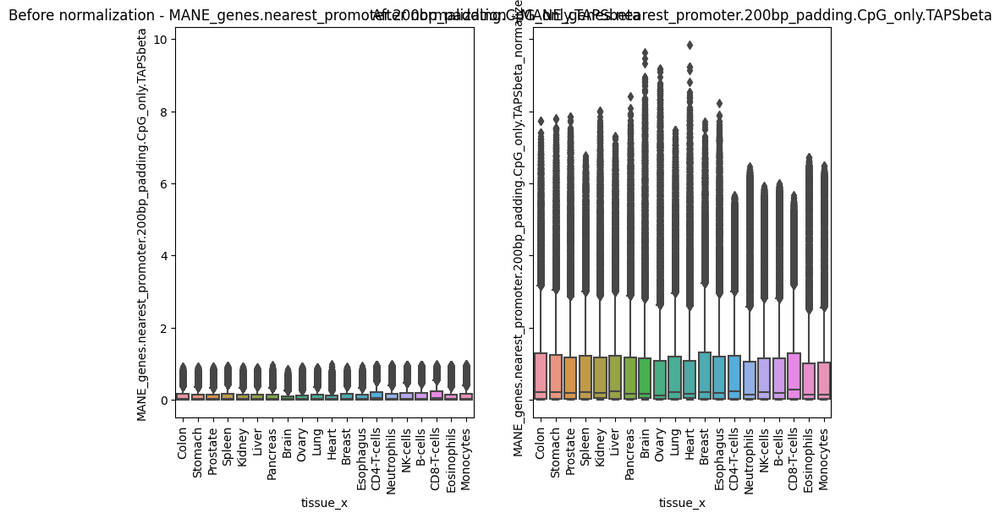

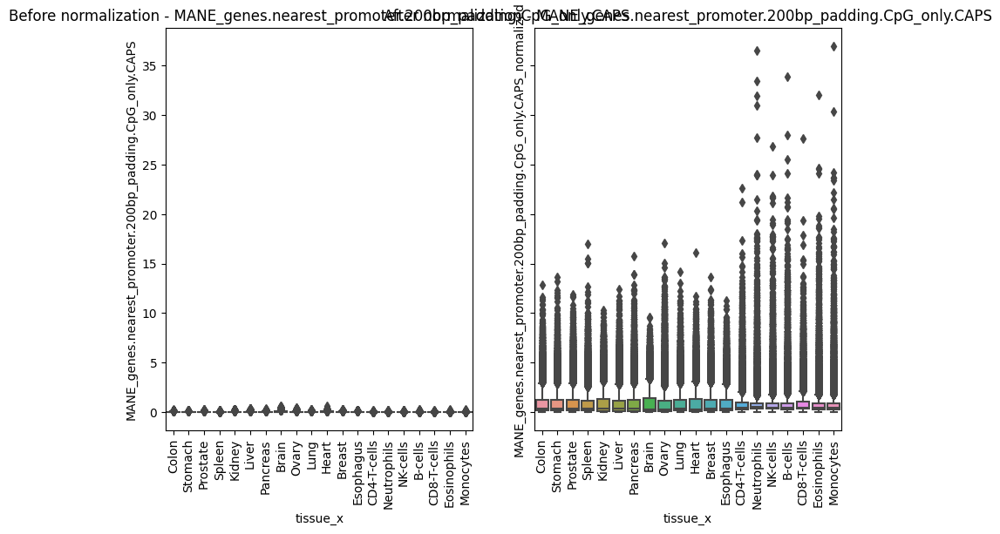

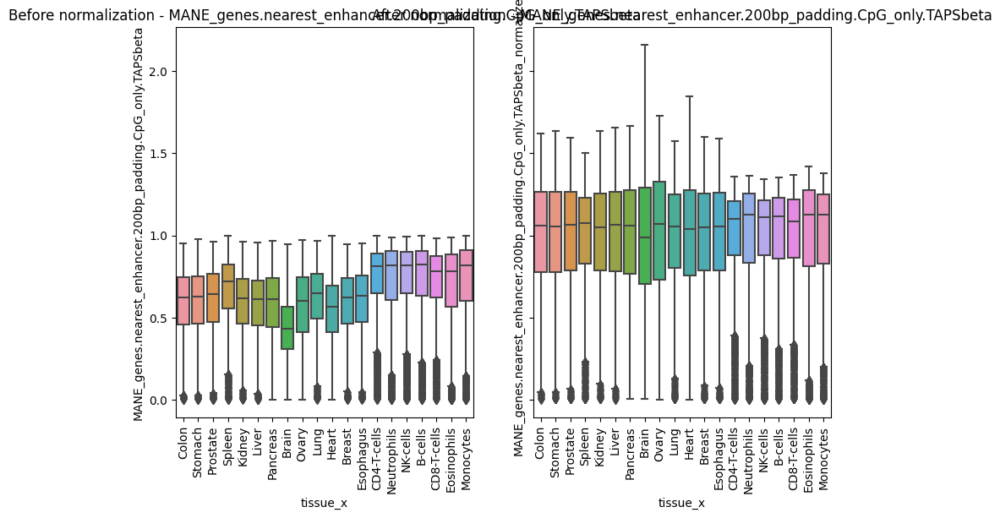

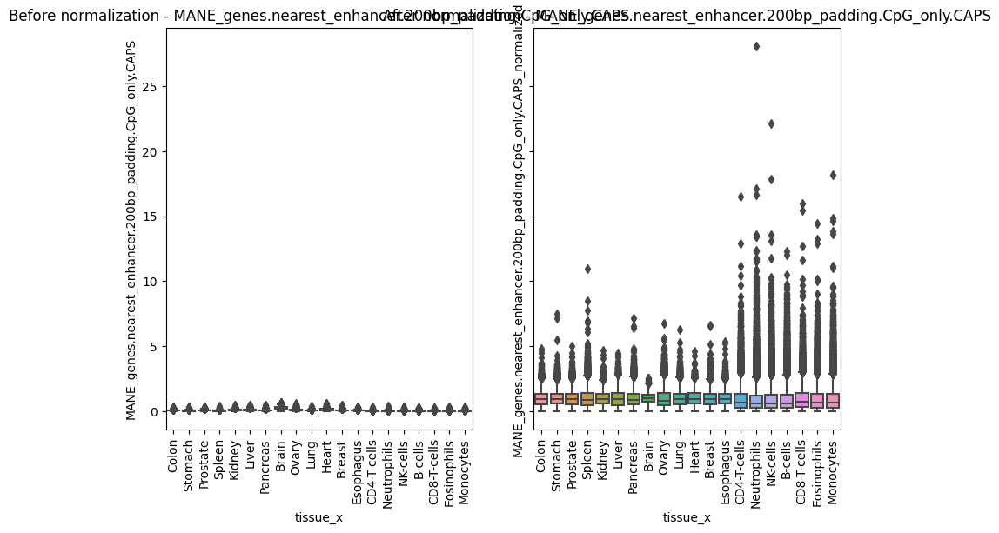

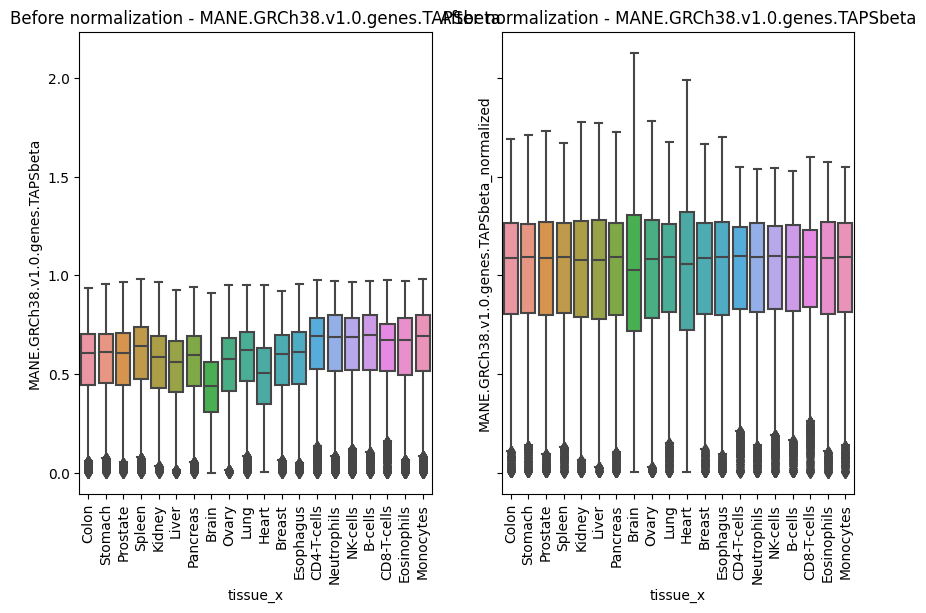

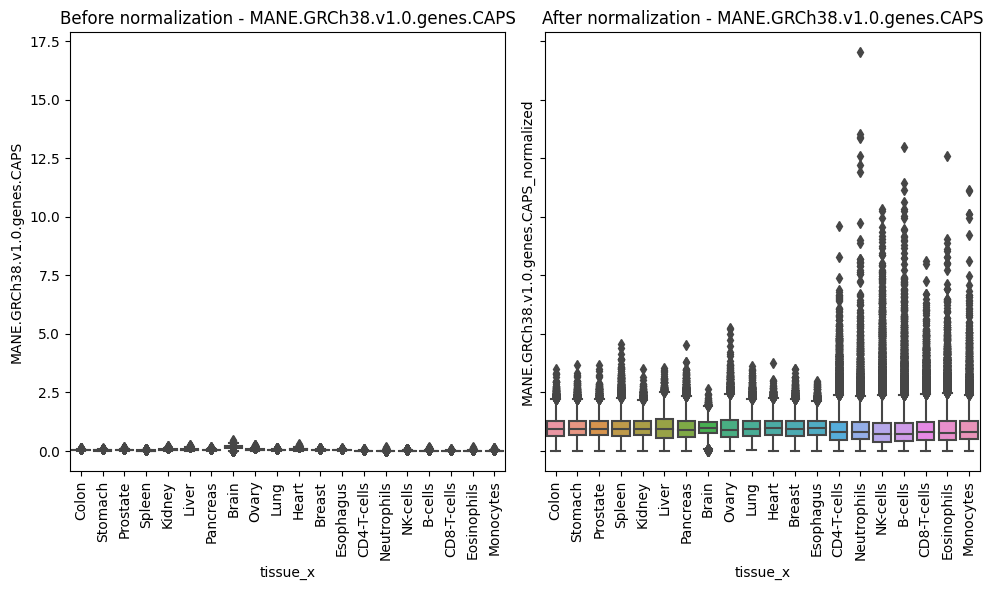

In [25]:
### Before/After normalisation

# For each feature
for i, feature in enumerate(epigenetic_features):
    
    fig, axes = plt.subplots(1, ncols=2, figsize=(10, 6),sharey=True)

    # BEFORE normalization
    # Create a boxplot for each tissue
    sns.boxplot(data=df, x='tissue_x', y=feature, ax=axes[0])
    axes[0].set_title(f'Before normalization - {feature}')
    axes[0].tick_params(axis='x', rotation=90)
    
    # Normalize the feature
    df[feature + '_normalized'] = df.groupby('tissue_x')[feature].transform(lambda x: x / x.mean())

    # AFTER normalization
    # Create a boxplot for each tissue
    sns.boxplot(data=df, x='tissue_x', y=feature + '_normalized', ax=axes[1])
    axes[1].set_title(f'After normalization - {feature}')
    axes[1].tick_params(axis='x', rotation=90)

# Adjust the layout
plt.tight_layout()
plt.show()


### Visualise distributions

In [26]:
epigenetic_features

['MANE_genes.nearest_promoter.200bp_padding.CpG_only.TAPSbeta',
 'MANE_genes.nearest_promoter.200bp_padding.CpG_only.CAPS',
 'MANE_genes.nearest_enhancer.200bp_padding.CpG_only.TAPSbeta',
 'MANE_genes.nearest_enhancer.200bp_padding.CpG_only.CAPS',
 'MANE.GRCh38.v1.0.genes.TAPSbeta',
 'MANE.GRCh38.v1.0.genes.CAPS']

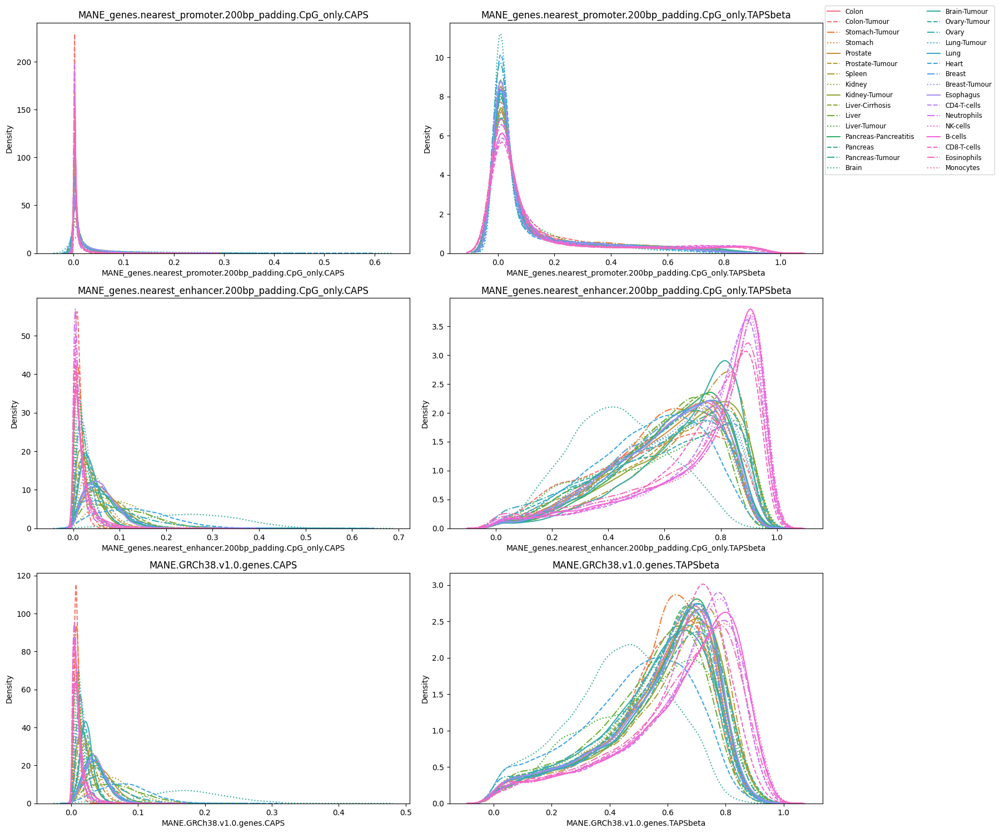

In [27]:
caps_features = [f for f in epigenetic_features if 'CAPS' in f]
tapsbeta_features = [f for f in epigenetic_features if 'TAPSbeta' in f]

tissues = epigenetic_rna_seq_merged['tissue_x'].unique()
palette = sns.color_palette("husl", len(tissues))

line_styles = ['-', '--', '-.', ':'] * (len(tissues) // 4 + 1)

fig, axes = plt.subplots(len(caps_features), 2, figsize=(15, 5*len(caps_features)))


for row, feature in enumerate(caps_features):
    for tissue, color, style in zip(tissues, palette, line_styles):
        tissue_df = epigenetic_rna_seq_merged[epigenetic_rna_seq_merged['tissue_x'] == tissue]
        sns.kdeplot(data=tissue_df, x=feature, ax=axes[row, 0], label=tissue, color=color, linestyle=style)
    axes[row, 0].set_title(feature)


for row, feature in enumerate(tapsbeta_features):
    for tissue, color, style in zip(tissues, palette, line_styles):
        tissue_df = epigenetic_rna_seq_merged[epigenetic_rna_seq_merged['tissue_x'] == tissue]
        sns.kdeplot(data=tissue_df, x=feature, ax=axes[row, 1], label=tissue, color=color, linestyle=style)
    axes[row, 1].set_title(feature)


for ax in axes.ravel():
    if ax.get_legend():
        ax.get_legend().remove()


handles, labels = axes[0, 0].get_legend_handles_labels()  
fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.2, 1), fontsize='small', ncol=2)

plt.tight_layout()
plt.show()


In [28]:

TISSUE_COLOR_MAP3 = {
    'Colon': '#00008B',  # Dark blue for better visibility and distinction
    'Stomach-Tumour': '#007575',  # Dark cyan
    'Prostate': '#008000',  # Dark green
    'Spleen': '#8B008B',  
    'Kidney': '#4B0082',  
    'Kidney-Tumour': '#4B0082',  
    'Liver-Cirrhosis': '#006400',
    'Stomach': '#007575',  # Dark cyan
    'Pancreas-Pancreatitis': '#8B0000',  
    'Liver': '#006400',
    'Brain': '#007575',  # Dark cyan
    'Ovary-Tumour': '#4B0082',  
    'Lung-Tumour': '#005B8D',  # Darker blue
    'Colon-Tumour': '#00008B',  # Dark blue
    'Pancreas': '#8B0000',  
    'Pancreas-Tumour': '#8B0000',  
    'Lung': '#005B8D',  # Darker blue
    'Thymus': '#228B22',  
    'Liver-Tumour': '#006400',
    'Prostate-Tumour': '#008000',  # Dark green
    'Ovary': '#4B0082',  
    'Heart': '#B22222',  # Darker red
    'Breast': '#8B0000',  
    'Breast-Tumour': '#8B0000',  
    'Brain-Tumour': '#007575',  # Dark cyan
    'Esophagus': '#228B22',  
    'Bone-Marrow': '#B8860B',  # Darker goldenrod
    'CD4-T-cells': '#8B0000',
    'Neutrophils': '#800080',  # Darker purple
    'NK-cells': '#800000',  
    'B-cells': '#1f78b4',
    'CD8-T-cells': '#B8860B',  # Darker goldenrod
    'Eosinophils': '#6a3d9a',
    'Monocytes': '#B22222',  # Darker red
    'Erythroblasts': '#483D8B',  
    'Erythroid Precursors': '#483D8B',
    'Megakaryocytes': '#2F4F4F'  
}


In [29]:
tissues_with_tumour

['Brain',
 'Breast',
 'Colon',
 'Kidney',
 'Liver',
 'Lung',
 'Ovary',
 'Pancreas',
 'Prostate',
 'Stomach']

In [30]:
# df = df.loc[df['tissue_x'].isin(somatic_tissue_types[3:9])]
# display_tissue_types = ['Colon','Lung','Liver','']
display_tissue_types = tissues_with_tumour

In [31]:
display_tissue_types

['Brain',
 'Breast',
 'Colon',
 'Kidney',
 'Liver',
 'Lung',
 'Ovary',
 'Pancreas',
 'Prostate',
 'Stomach']

In [32]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# # Assuming epigenetic_features and epigenetic_rna_seq_merged are defined elsewhere in your code
# caps_features = [f for f in epigenetic_features if 'CAPS' in f]
# tapsbeta_features = [f for f in epigenetic_features if 'TAPSbeta' in f]

# # tissues = epigenetic_rna_seq_merged['tissue_x'].unique()
# # tissues = display_tissue_types
# tissues = ['Liver','Lung','Pancreas','Stomach','Brain']



# # Define specific colors for each tissue in a dictionary
# # tissue_color_map = {
# #     # ... fill in your tissues and their corresponding colors
# # }
# tissue_color_map = TISSUE_COLOR_MAP3

# # Assign solid line style for normal tissues and dotted lines for tumour tissues
# line_style_map = {tissue: '-' if "Tumour" not in tissue else ':' for tissue in tissues}

# fig, axes = plt.subplots(len(caps_features), 2, figsize=(15, 5*len(caps_features)))

# # Plotting for CAPS features
# for row, feature in enumerate(caps_features):
#     for tissue in tissues:
#         tissue_df = epigenetic_rna_seq_merged[epigenetic_rna_seq_merged['tissue_x'] == tissue]
#         sns.kdeplot(data=tissue_df, x=feature, ax=axes[row, 0], label=tissue,
#                     color=tissue_color_map.get(tissue, 'default_color'),
#                     linestyle=line_style_map[tissue])
#     axes[row, 0].set_title(feature)

# # Plotting for TAPSbeta features
# for row, feature in enumerate(tapsbeta_features):
#     for tissue in tissues:
#         tissue_df = epigenetic_rna_seq_merged[epigenetic_rna_seq_merged['tissue_x'] == tissue]
#         sns.kdeplot(data=tissue_df, x=feature, ax=axes[row, 1], label=tissue,
#                     color=tissue_color_map.get(tissue, 'default_color'),
#                     linestyle=line_style_map[tissue])
#     axes[row, 1].set_title(feature)

# # Remove existing legends from all subplots
# for ax in axes.ravel():
#     if ax.get_legend():
#         ax.get_legend().remove()

# # Create a global legend for the figure
# handles, labels = axes[0, 0].get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(1.2, 1), fontsize='small', ncol=2)

# plt.tight_layout()
# plt.show()


In [33]:
display_feature_dict = {}
# display_feature_dict['MANE_genes.nearest_promoter.200bp_padding.CpG_only.CAPS'] = "Promoter hmC"
# display_feature_dict['MANE_genes.nearest_enhancer.200bp_padding.CpG_only.CAPS'] = "Enhancer hmC"
# display_feature_dict['MANE.GRCh38.v1.0.genes.CAPS'] = "Gene body hmC"

# display_feature_dict['MANE_genes.nearest_promoter.200bp_padding.CpG_only.TAPSbeta'] = "Promoter mC"
# display_feature_dict['MANE_genes.nearest_enhancer.200bp_padding.CpG_only.TAPSbeta'] = "Enhancer mC"
# display_feature_dict['MANE.GRCh38.v1.0.genes.TAPSbeta'] = "Gene body mC"

display_feature_dict['MANE_genes.nearest_promoter.200bp_padding.CpG_only.CAPS'] = "Promoter Hydroxymethylation"
display_feature_dict['MANE_genes.nearest_enhancer.200bp_padding.CpG_only.CAPS'] = "Enhancer Hydroxymethylation"
display_feature_dict['MANE.GRCh38.v1.0.genes.CAPS'] = "Gene body Hydroxymethylation"

display_feature_dict['MANE_genes.nearest_promoter.200bp_padding.CpG_only.TAPSbeta'] = "Promoter Methylation"
display_feature_dict['MANE_genes.nearest_enhancer.200bp_padding.CpG_only.TAPSbeta'] = "Enhancer Methylation"
display_feature_dict['MANE.GRCh38.v1.0.genes.TAPSbeta'] = "Gene body Methylation"

# display_feature_dict['MANE_genes.nearest_promoter.200bp_padding.CpG_only.CAPS'] = "Promoter hmC"
# all_features 

In [34]:

feature_order = ["MANE_genes.nearest_promoter.200bp_padding.CpG_only.TAPSbeta",
                "MANE_genes.nearest_promoter.200bp_padding.CpG_only.CAPS",
                 "MANE_genes.nearest_enhancer.200bp_padding.CpG_only.TAPSbeta",
                 "MANE_genes.nearest_enhancer.200bp_padding.CpG_only.CAPS",
                 "MANE.GRCh38.v1.0.genes.TAPSbeta",
                 "MANE.GRCh38.v1.0.genes.CAPS"]
                 
                 

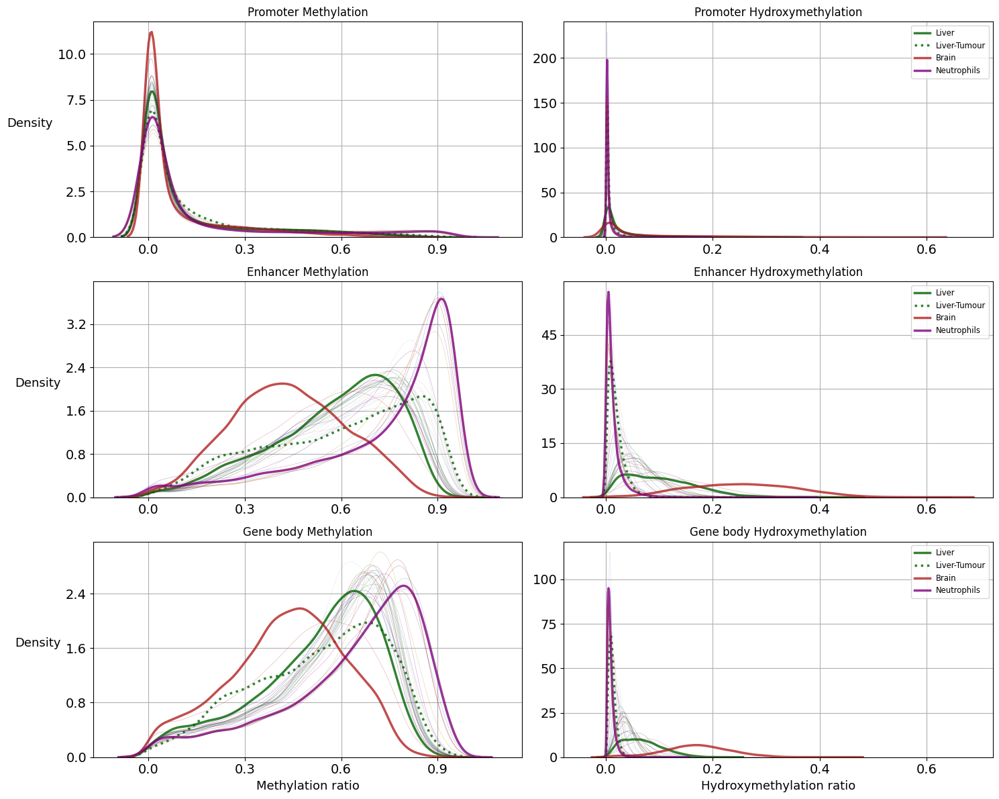

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# Assuming epigenetic_features and epigenetic_rna_seq_merged are defined elsewhere in your code
caps_features = [f for f in epigenetic_features if 'CAPS' in f]
tapsbeta_features = [f for f in epigenetic_features if 'TAPSbeta' in f]

# Combine all features for plotting
all_features = caps_features + tapsbeta_features

tissues = epigenetic_rna_seq_merged['tissue_x'].unique()

# Assuming TISSUE_COLOR_MAP3 is defined elsewhere in your code
tissue_color_map = TISSUE_COLOR_MAP3
tissue_color_map['Brain'] = '#B22222'

# Assign solid line style for normal tissues and dotted lines for tumour tissues
line_style_map = {tissue: '-' if "Tumour" not in tissue else ':' for tissue in tissues}

# Adjust the size of the figure to accommodate all subplots clearly
fig, axes = plt.subplots(3, 2, figsize=(15, 2 * len(all_features)), sharex='col')

# Flatten the axes array for easy 1D indexing
axes = axes.ravel()

# Highlight settings
highlight = ['Liver', 'Brain', 'Liver-Tumour', 'Neutrophils']
highlight_width = 2.5
normal_width = 0.5
highlight_alpha = 0.8
normal_alpha = 0.3

# Set a common number of gridlines for all plots
number_of_x_ticks = 5  # Choose the number of x-ticks you want
number_of_y_ticks = 5  # Choose the number of y-ticks you want

# Iterate over all features and plot them
for idx, feature in enumerate(feature_order):
    for tissue in tissues:
        tissue_df = epigenetic_rna_seq_merged[epigenetic_rna_seq_merged['tissue_x'] == tissue]
        is_highlighted = tissue in highlight
        sns.kdeplot(
            data=tissue_df,
            x=feature,
            ax=axes[idx],  # Use the flattened axes index
            label=tissue if is_highlighted else None,
            color=tissue_color_map.get(tissue, 'default_color'),
            linestyle=line_style_map[tissue],
            linewidth=highlight_width if is_highlighted else normal_width,
            alpha=highlight_alpha if is_highlighted else normal_alpha
        )
    axes[idx].set_title(display_feature_dict[feature])
    axes[idx].grid(visible=True)
    axes[idx].set_xlabel('')
    
    # Set the number of ticks for both x and y axes
    axes[idx].xaxis.set_major_locator(MaxNLocator(number_of_x_ticks))
    axes[idx].yaxis.set_major_locator(MaxNLocator(number_of_y_ticks))
    
    # Set tick parameters for both axes
    axes[idx].tick_params(axis='x', which='both', bottom=True, top=False, labelbottom=True, labelsize=14)
    axes[idx].tick_params(axis='both', which='major', labelsize=14)
    
    if idx % 2 == 1:  # Only add legends to the second column
        handles, labels = axes[idx].get_legend_handles_labels()
        axes[idx].legend(handles, labels, loc='upper right', fontsize='small')
        axes[idx].set_ylabel('')

    else:
        axes[idx].set_ylabel('Density', rotation=0, labelpad=30, fontsize=13)
        
    if idx == 4:
        axes[idx].set_xlabel('Methylation ratio',fontsize=13)
        
    if idx==5:
        axes[idx].set_xlabel('Hydroxymethylation ratio',fontsize=13)

# Adjust the layout
plt.tight_layout()

fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/ge_predict/"

# plt.savefig(fig_savedir + "Feature_distributions.mC_hmC.thesis_clean.png",
#            dpi=300)

plt.show()


### Normalise TPM?

In [37]:
df

,gene,tissue_x,MANE_genes.nearest_promoter.200bp_padding.CpG_only.TAPSbeta,MANE_genes.nearest_enhancer.200bp_padding.CpG_only.TAPSbeta,MANE.GRCh38.v1.0.genes.TAPSbeta,MANE_genes.nearest_promoter.200bp_padding.CpG_only.CAPS,MANE_genes.nearest_enhancer.200bp_padding.CpG_only.CAPS,MANE.GRCh38.v1.0.genes.CAPS,rna_seq_tissue_name,tissue_y,tpm,log_tpm,MANE_genes.nearest_promoter.200bp_padding.CpG_only.TAPSbeta_normalized,MANE_genes.nearest_promoter.200bp_padding.CpG_only.CAPS_normalized,MANE_genes.nearest_enhancer.200bp_padding.CpG_only.TAPSbeta_normalized,MANE_genes.nearest_enhancer.200bp_padding.CpG_only.CAPS_normalized,MANE.GRCh38.v1.0.genes.TAPSbeta_normalized,MANE.GRCh38.v1.0.genes.CAPS_normalized
0,ENSG00000107554,Colon,0.006164,0.738144,0.667046,0.001712,0.104701,0.072363,colon,colon,17.7,2.928524,0.051982,0.096656,1.254781,1.661517,1.200285,1.856473
2,ENSG00000120054,Colon,0.470411,0.367002,0.762850,0.017246,0.014455,0.021946,colon,colon,0.0,0.000000,3.967167,0.973500,0.623873,0.229382,1.372676,0.563026
4,ENSG00000107566,Colon,0.003473,0.798443,0.558408,0.002309,0.072854,0.037902,colon,colon,37.0,3.637586,0.029293,0.130341,1.357284,1.156128,1.004801,0.972370
6,ENSG00000213341,Colon,0.052462,0.870306,0.705130,0.013885,0.051486,0.032556,colon,colon,11.9,2.557227,0.442431,0.783767,1.479445,0.817042,1.268813,0.835223
8,ENSG00000095485,Colon,0.004749,0.792391,0.743161,0.002740,0.044472,0.029981,colon,colon,7.2,2.104134,0.040054,0.154653,1.346997,0.705733,1.337246,0.769156
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
508603,ENSG00000179083,Monocytes,0.009639,0.242223,0.806699,0.002765,0.002000,0.002280,classical monocyte,classical monocyte,0.0,0.000000,0.063848,0.413337,0.333483,0.107600,1.273547,0.202482
508604,ENSG00000101849,Monocytes,0.022767,0.864006,0.790760,0.008515,0.011302,0.012749,classical monocyte,classical monocyte,4.7,1.740466,0.150811,1.272922,1.189532,0.608061,1.248385,1.132022
508605,ENSG00000147202,Monocytes,0.124313,0.666704,0.889126,0.007080,0.022167,0.009061,classical monocyte,classical monocyte,3.1,1.410987,0.823466,1.058479,0.917894,1.192576,1.403676,0.804612
508606,ENSG00000204086,Monocytes,0.185529,0.938874,0.928112,0.005768,0.005705,0.007075,classical monocyte,classical monocyte,0.5,0.405465,1.228968,0.862237,1.292608,0.306940,1.465224,0.628188


In [38]:
df['tpm'] = pd.to_numeric(df['tpm'], errors='coerce')
df['log_tpm'] = pd.to_numeric(df['log_tpm'], errors='coerce')

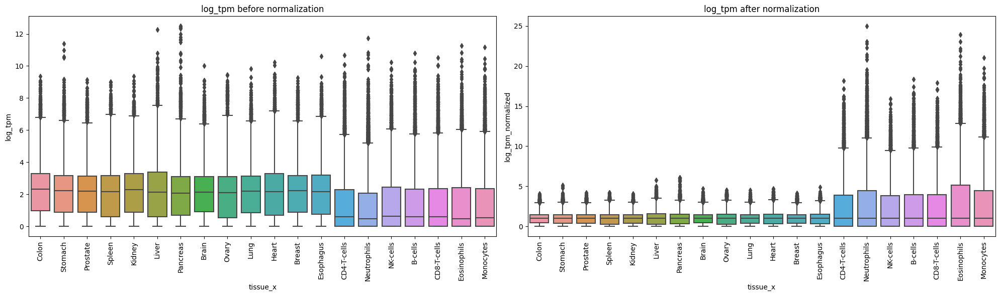

In [39]:
# calculate tissue median for 'tpm' and 'log_tpm'
tpm_median = df.groupby('tissue_x')['tpm'].transform('median')
log_tpm_median = df.groupby('tissue_x')['log_tpm'].transform('median')

# create new normalized columns
df['tpm_normalized'] = df['tpm'] / tpm_median
df['log_tpm_normalized'] = df['log_tpm'] / log_tpm_median


fig, axes = plt.subplots(1, 2, figsize=(20, 6))  # 1 row, 2 columns

# Before normalization
sns.boxplot(x='tissue_x', y='log_tpm', data=df, ax=axes[0])
# sns.boxplot(x='tissue_x', y='tpm', data=df, ax=axes[0])
axes[0].set_title("log_tpm before normalization")
axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=90)

# After normalization
sns.boxplot(x='tissue_x', y='log_tpm_normalized', data=df, ax=axes[1])
# sns.boxplot(x='tissue_x', y='tpm_normalized', data=df, ax=axes[1])
axes[1].set_title("log_tpm after normalization")
axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=90)

plt.tight_layout()  # adjust subplot parameters to give specified padding
plt.show()

### Save for cluster model training

In [40]:
# gene_exp_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/predict_ge/data/"

# if use_weighted_mr:
#     filename = f"epigenetic_features.enhancer_promoter_gene{suffix}.rna_seq.merged.normalised.weighted_mr.csv"

#     df.to_csv(gene_exp_dir + filename,sep='\t',index=False)
# else:
#     filename = f"epigenetic_features.enhancer_promoter_gene.rna_seq.merged.normalised.csv"
#     df.to_csv(gene_exp_dir + filename,sep='\t',index=False)

# # print(f"Saving {filename} to {gene_exp_dir}")
# # df.to_csv(gene_exp_dir + f"epigenetic_features.rna_seq.merged.normalised.csv",sep='\t',index=False)

### Visualise training data

In [41]:
somatic_tissue_types[3:9]

['Colon', 'Esophagus', 'Heart', 'Kidney', 'Liver', 'Lung']

In [42]:
df['tissue_x'].unique()

array(['Colon', 'Stomach', 'Prostate', 'Spleen', 'Kidney', 'Liver',
       'Pancreas', 'Brain', 'Ovary', 'Lung', 'Heart', 'Breast',
       'Esophagus', 'CD4-T-cells', 'Neutrophils', 'NK-cells', 'B-cells',
       'CD8-T-cells', 'Eosinophils', 'Monocytes'], dtype=object)

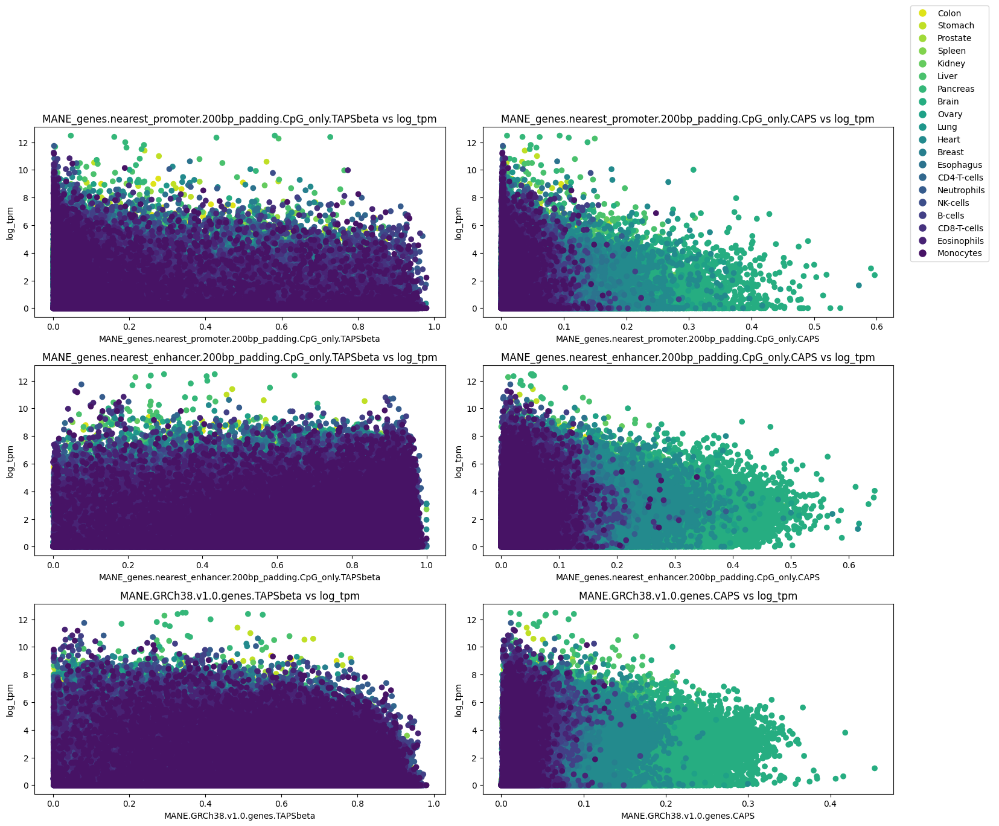

In [43]:
# epigenetic_features = ['MANE.GRCh38.v1.0.genes.TAPSbeta', 
#                        'MANE.GRCh38.v1.0.genes.stranded.2kb_upstream.TAPSbeta', 
#                        'CGIshore_annotated.sorted.TAPSbeta',
#                        'double_elite_enhancer_deduplication.sorted.TAPSbeta',
#                        'MANE.GRCh38.v1.0.genes.CAPS',
#                        'MANE.GRCh38.v1.0.genes.stranded.2kb_upstream.CAPS',
#                        'CGIshore_annotated.sorted.CAPS',
#                        'double_elite_enhancer_deduplication.sorted.CAPS']

n = len(epigenetic_features)

# Create a color palette with the number of colors equal to the number of unique values in the 'tissue_x' column
palette = sns.color_palette('viridis_r', n_colors = len(df['tissue_x'].unique()))

# Create a dictionary that maps each unique tissue to a unique color
color_dict = dict(zip(df['tissue_x'].unique(), palette))

# Create figure with n/2 rows and 2 columns, adjust size as needed
fig, axs = plt.subplots(n//2, 2, figsize=(15, n*2))


# df = df.loc[df['tissue_x'].isin(somatic_tissue_types[3:9])]
# Flatten axs for easy iterating
axs = axs.flatten()

# Plot each feature
for i, feature in enumerate(epigenetic_features):
    axs[i].scatter(df[feature], df['log_tpm'], c=df['tissue_x'].map(color_dict))

    axs[i].set_xlabel(feature)
    axs[i].set_ylabel('log_tpm')
    axs[i].set_title(f'{feature} vs log_tpm')

# # If number of plots is odd, remove the last one
# if len(axs) > len(epigenetic_features):
#     fig.delaxes(axs[-1])

# Add an axis for the legend at the top of the figure
legend_ax = fig.add_axes([0.1, 0.92, 1.0, 0.08])
legend_ax.axis('off')

# Create a legend
legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label=label, 
                               markerfacecolor=color, markersize=10) 
                   for label, color in color_dict.items()]
legend_ax.legend(handles=legend_elements, loc='right',)# nrows=len(color_dict))

plt.tight_layout()
plt.show()


In [44]:
epigenetic_features

['MANE_genes.nearest_promoter.200bp_padding.CpG_only.TAPSbeta',
 'MANE_genes.nearest_promoter.200bp_padding.CpG_only.CAPS',
 'MANE_genes.nearest_enhancer.200bp_padding.CpG_only.TAPSbeta',
 'MANE_genes.nearest_enhancer.200bp_padding.CpG_only.CAPS',
 'MANE.GRCh38.v1.0.genes.TAPSbeta',
 'MANE.GRCh38.v1.0.genes.CAPS']

In [45]:
somatic_tissue_types

['Bone-Marrow',
 'Brain',
 'Breast',
 'Colon',
 'Esophagus',
 'Heart',
 'Kidney',
 'Liver',
 'Lung',
 'Ovary',
 'Pancreas',
 'Prostate',
 'Spleen',
 'Stomach',
 'Thymus']

In [46]:
# somatic_tissue_types[1:-1].pop('Spleen')

In [47]:
df_solid_tissues = somatic_tissue_types[1:]

df = df.loc[df['tissue_x'].isin(somatic_tissue_types[3:9])]


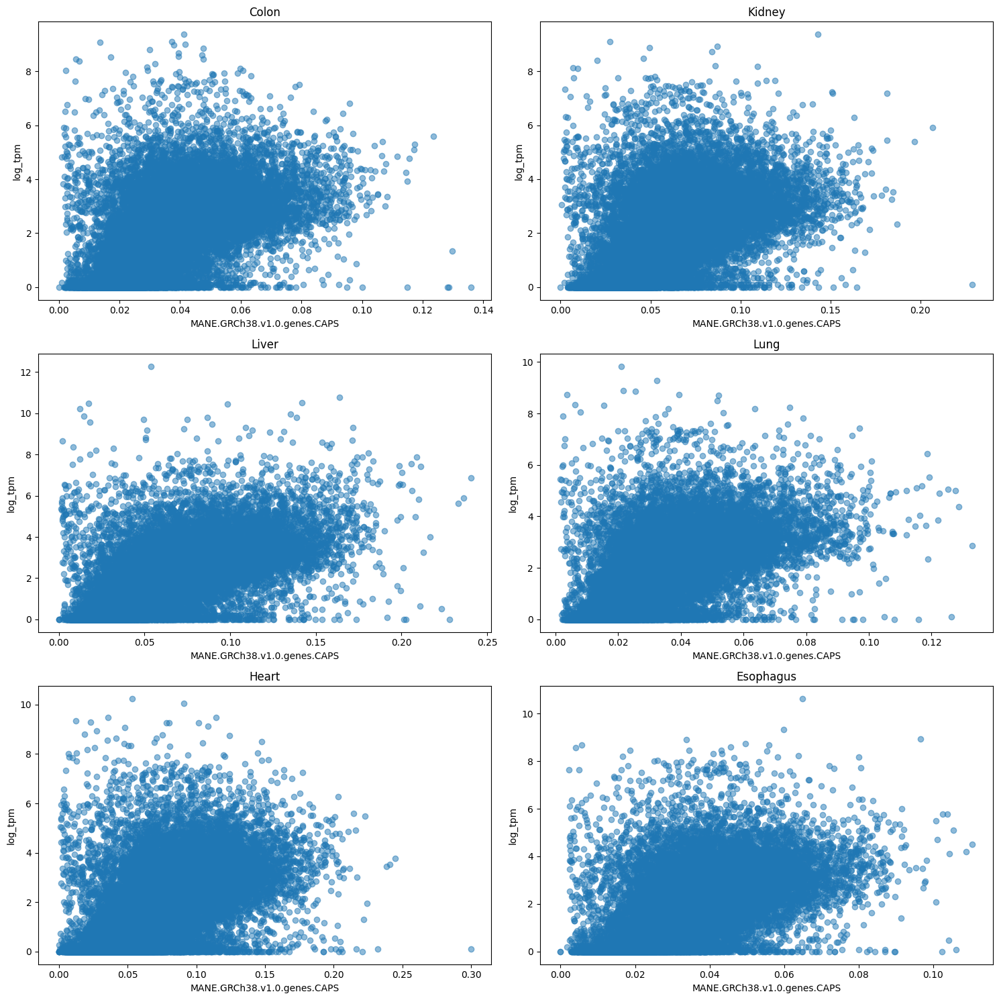

In [48]:
# List of unique tissues
unique_tissues = df['tissue_x'].unique()

# Determine the number of subplots needed
n_tissues = len(unique_tissues)

# Calculate the number of rows and columns for the subplots
n_cols = 2
n_rows = n_tissues // n_cols + (n_tissues % n_cols > 0)

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15))
axes = axes.flatten()  # Flatten the axes array to make it easier to loop through

# Loop through each tissue and its corresponding subplot
for i, tissue in enumerate(unique_tissues):
    tissue_df = df[df['tissue_x'] == tissue]
    
    # Remove NaN and infinite values before plotting
    tissue_df = tissue_df.dropna(subset=['MANE.GRCh38.v1.0.genes.CAPS', 'log_tpm'])

    axes[i].scatter(tissue_df['MANE.GRCh38.v1.0.genes.CAPS'], tissue_df['log_tpm'], alpha=0.5)
    axes[i].set_title(f'{tissue}')
    axes[i].set_xlabel('MANE.GRCh38.v1.0.genes.CAPS')
    axes[i].set_ylabel('log_tpm')

# Remove any unused subplots
for i in range(n_tissues, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()


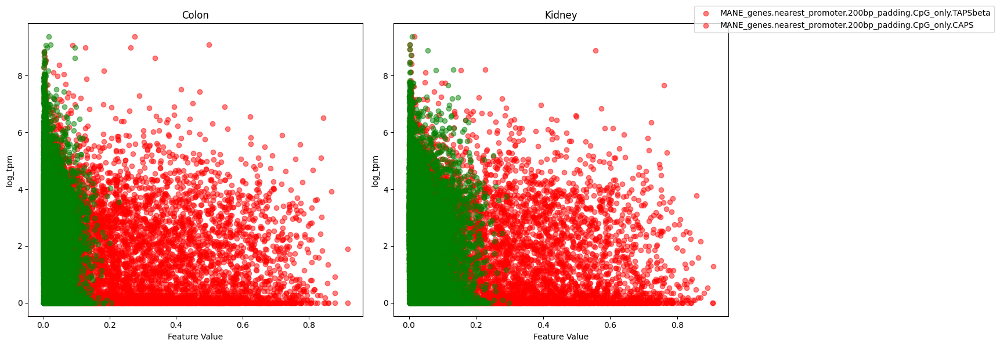

In [49]:
# Define colors for each feature
colors = ['red', 'green', 'blue', 'purple', 'orange', 'brown']


plot_features = epigenetic_features[0:2]
plot_tissues = unique_tissues[0:2]
n_tissues = len(plot_tissues)

# Calculate the number of rows and columns for the subplots
n_cols = 2
n_rows = n_tissues // n_cols + (n_tissues % n_cols > 0)

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3*n_tissues))
axes = axes.flatten()  # Flatten the axes array to make it easier to loop through

# Create a list to hold legend handles (for unique legend)
legend_handles = []

# Loop through each tissue and its corresponding subplot
for i, tissue in enumerate(plot_tissues):
    tissue_df = df[df['tissue_x'] == tissue]
    
    for feature, color in zip(plot_features, colors):
        # Remove NaN and infinite values before plotting
        tissue_df_clean = tissue_df.dropna(subset=[feature, 'log_tpm'])
        
        sc = axes[i].scatter(tissue_df_clean[feature], tissue_df_clean['log_tpm'], alpha=0.5, color=color)
        legend_handles.append(sc)
    
    axes[i].set_title(f'{tissue}')
    axes[i].set_xlabel('Feature Value')
    axes[i].set_ylabel('log_tpm')

# Remove any unused subplots
for i in range(n_tissues, len(axes)):
    fig.delaxes(axes[i])

# Add unique legend outside of subplots
fig.legend(handles=[legend_handles[i] for i in range(0, len(legend_handles), n_tissues)], 
           labels=plot_features, 
           loc='upper right', 
           bbox_to_anchor=(1.15, 1), 
           ncol=1)

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to make room for legend
plt.show()


In [50]:
tissue_df

,gene,tissue_x,MANE_genes.nearest_promoter.200bp_padding.CpG_only.TAPSbeta,MANE_genes.nearest_enhancer.200bp_padding.CpG_only.TAPSbeta,MANE.GRCh38.v1.0.genes.TAPSbeta,MANE_genes.nearest_promoter.200bp_padding.CpG_only.CAPS,MANE_genes.nearest_enhancer.200bp_padding.CpG_only.CAPS,MANE.GRCh38.v1.0.genes.CAPS,rna_seq_tissue_name,tissue_y,tpm,log_tpm,MANE_genes.nearest_promoter.200bp_padding.CpG_only.TAPSbeta_normalized,MANE_genes.nearest_promoter.200bp_padding.CpG_only.CAPS_normalized,MANE_genes.nearest_enhancer.200bp_padding.CpG_only.TAPSbeta_normalized,MANE_genes.nearest_enhancer.200bp_padding.CpG_only.CAPS_normalized,MANE.GRCh38.v1.0.genes.TAPSbeta_normalized,MANE.GRCh38.v1.0.genes.CAPS_normalized,tpm_normalized,log_tpm_normalized
111258,ENSG00000107554,Kidney,0.005127,0.609270,0.627293,0.003521,0.168879,0.121217,kidney,kidney,20.6,3.072693,0.045316,0.121168,1.036861,1.619918,1.149819,1.866577,2.340909,1.346266
111260,ENSG00000120054,Kidney,0.445928,0.481505,0.763508,0.034140,0.062254,0.048951,kidney,kidney,0.1,0.095310,3.941110,1.174722,0.819430,0.597152,1.399499,0.753778,0.011364,0.041759
111262,ENSG00000107566,Kidney,0.003106,0.733443,0.559402,0.002828,0.119480,0.060898,kidney,kidney,27.2,3.339322,0.027453,0.097317,1.248179,1.146077,1.025375,0.937747,3.090909,1.463086
111264,ENSG00000213341,Kidney,0.037986,0.820374,0.625413,0.020229,0.113466,0.066310,kidney,kidney,21.0,3.091042,0.335722,0.696076,1.396119,1.088385,1.146372,1.021087,2.386364,1.354305
111266,ENSG00000095485,Kidney,0.004606,0.801459,0.727404,0.002081,0.060633,0.046536,kidney,kidney,7.8,2.174752,0.040711,0.071618,1.363930,0.581600,1.333321,0.716583,0.886364,0.952843
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143036,ENSG00000179083,Kidney,0.016406,0.382690,0.788905,0.004922,0.049879,0.021682,kidney,kidney,0.0,0.000000,0.144992,0.169365,0.651265,0.478446,1.446051,0.333865,0.000000,0.000000
143038,ENSG00000101849,Kidney,0.029037,0.589826,0.583069,0.014602,0.130171,0.120370,kidney,kidney,16.6,2.867899,0.256628,0.502438,1.003770,1.248628,1.068757,1.853524,1.886364,1.256537
143040,ENSG00000147202,Kidney,0.063797,0.481807,0.790029,0.036954,0.184799,0.063393,kidney,kidney,3.1,1.410987,0.563837,1.271544,0.819944,1.772634,1.448112,0.976167,0.352273,0.618208
143042,ENSG00000204086,Kidney,0.339843,0.891157,0.870584,0.147089,0.030144,0.040461,kidney,kidney,0.1,0.095310,3.003533,5.061186,1.516579,0.289147,1.595767,0.623036,0.011364,0.041759


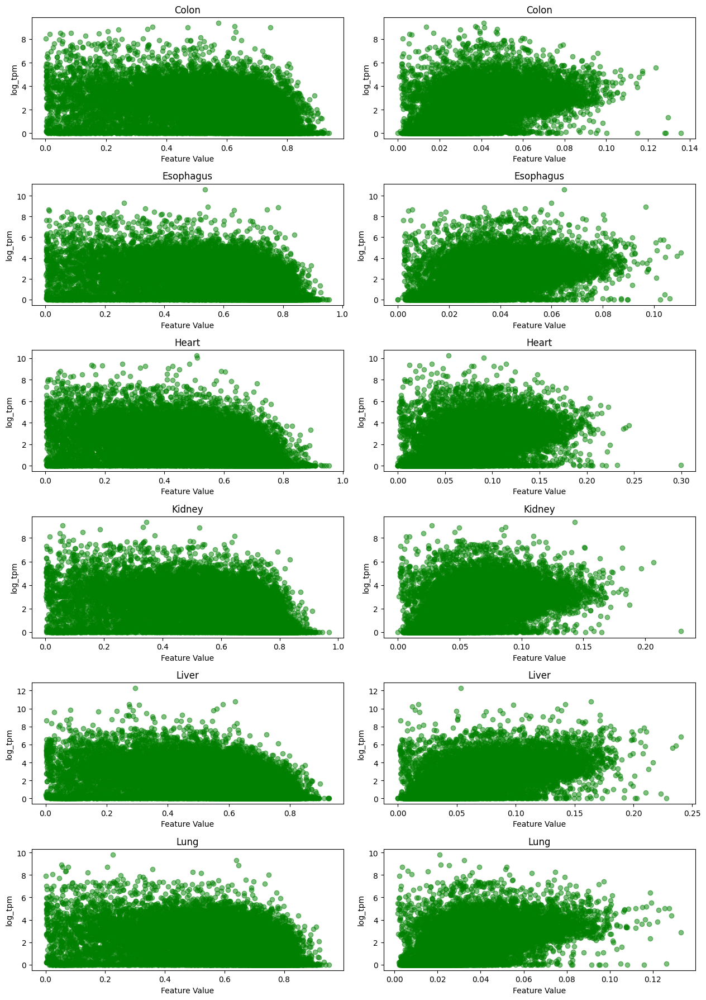

In [51]:
# Define colors for each feature
colors = ['red', 'green', 'blue', 'purple', 'orange', 'brown']


# plot_features = epigenetic_features[0:2]
plot_features = ['MANE.GRCh38.v1.0.genes.TAPSbeta','MANE.GRCh38.v1.0.genes.CAPS']
# plot_tissues = unique_tissues[0:2]
plot_tissues = somatic_tissue_types[3:9]
n_tissues = len(plot_tissues)

# Calculate the number of rows and columns for the subplots
n_cols = 2
n_rows = len(plot_tissues)
# n_rows = n_tissues // n_cols + (n_tissues % n_cols > 0)


# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 3*n_tissues))
# axes = axes.flatten()  # Flatten the axes array to make it easier to loop through

# Create a list to hold legend handles (for unique legend)
legend_handles = []

# Loop through each tissue and its corresponding subplot
# tissue_df = df[df['tissue_x'] == "Colon"]

# tissue_df = tissue_df.loc[tissue_df['log_tpm']>1]
tissue_df_clean = df.dropna(subset=[feature, 'log_tpm'])
for k,tissue in enumerate(plot_tissues):
    plot_df = tissue_df_clean.copy(deep=True)
    plot_df = tissue_df_clean.loc[tissue_df_clean['tissue_x']==tissue]
    for i, feature in enumerate(plot_features):        
        ax = axes[k,i]
        sc = ax.scatter(plot_df[feature], plot_df['log_tpm'], alpha=0.5, color=color)
        legend_handles.append(sc)

        ax.set_title(f'{tissue}')
        ax.set_xlabel('Feature Value')
        ax.set_ylabel('log_tpm')

# Remove any unused subplots
for i in range(n_tissues, len(axes)):
    fig.delaxes(axes[i])

# # Add unique legend outside of subplots
# fig.legend(handles=[legend_handles[i] for i in range(0, len(legend_handles), n_tissues)], 
#            labels=plot_features, 
#            loc='upper right', 
#            bbox_to_anchor=(1.15, 1), 
#            ncol=1)

plt.tight_layout(rect=[0, 0, 0.85, 1])  # Adjust layout to make room for legend
plt.show()


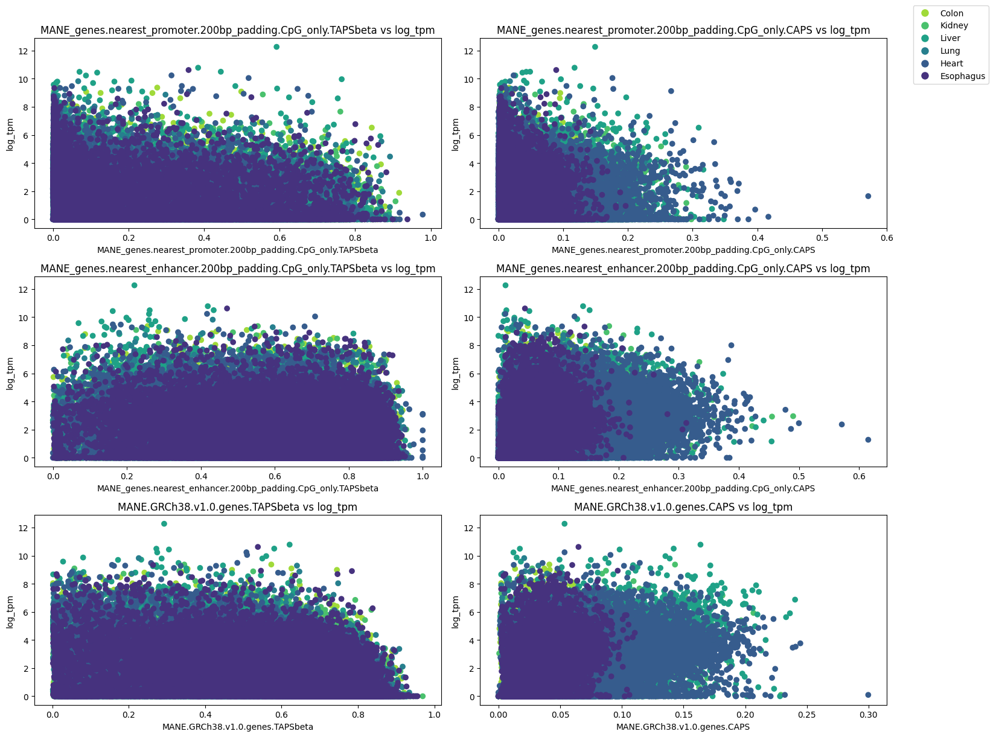

In [52]:
n = len(epigenetic_features)

df = df.loc[df['tissue_x'].isin(somatic_tissue_types[3:9])]

# Create a color palette with the number of colors equal to the number of unique values in the 'tissue_x' column
palette = sns.color_palette('viridis_r', n_colors = len(df['tissue_x'].unique()))

# Create a dictionary that maps each unique tissue to a unique color
color_dict = dict(zip(df['tissue_x'].unique(), palette))

# Create figure with n/2 rows and 2 columns, adjust size as needed
fig, axs = plt.subplots(n//2, 2, figsize=(15, n*2))


# Flatten axs for easy iterating
axs = axs.flatten()

# Plot each feature
for i, feature in enumerate(epigenetic_features):
    axs[i].scatter(df[feature], df['log_tpm'], c=df['tissue_x'].map(color_dict))

    axs[i].set_xlabel(feature)
    axs[i].set_ylabel('log_tpm')
    axs[i].set_title(f'{feature} vs log_tpm')

# # If number of plots is odd, remove the last one
# if len(axs) > len(epigenetic_features):
#     fig.delaxes(axs[-1])

# Add an axis for the legend at the top of the figure
legend_ax = fig.add_axes([0.1, 0.92, 1.0, 0.08])
legend_ax.axis('off')

# Create a legend
legend_elements = [plt.Line2D([0], [0], marker='o', color='w', label=label, 
                               markerfacecolor=color, markersize=10) 
                   for label, color in color_dict.items()]
legend_ax.legend(handles=legend_elements, loc='right',)# nrows=len(color_dict))

plt.tight_layout()
plt.show()

In [53]:
tissue_df['log_tpm']

111258    3.072693
111260    0.095310
111262    3.339322
111264    3.091042
111266    2.174752
            ...   
143036    0.000000
143038    2.867899
143040    1.410987
143042    0.095310
143044    1.547563
Name: log_tpm, Length: 15894, dtype: float64

In [54]:
tissue_df

,gene,tissue_x,MANE_genes.nearest_promoter.200bp_padding.CpG_only.TAPSbeta,MANE_genes.nearest_enhancer.200bp_padding.CpG_only.TAPSbeta,MANE.GRCh38.v1.0.genes.TAPSbeta,MANE_genes.nearest_promoter.200bp_padding.CpG_only.CAPS,MANE_genes.nearest_enhancer.200bp_padding.CpG_only.CAPS,MANE.GRCh38.v1.0.genes.CAPS,rna_seq_tissue_name,tissue_y,tpm,log_tpm,MANE_genes.nearest_promoter.200bp_padding.CpG_only.TAPSbeta_normalized,MANE_genes.nearest_promoter.200bp_padding.CpG_only.CAPS_normalized,MANE_genes.nearest_enhancer.200bp_padding.CpG_only.TAPSbeta_normalized,MANE_genes.nearest_enhancer.200bp_padding.CpG_only.CAPS_normalized,MANE.GRCh38.v1.0.genes.TAPSbeta_normalized,MANE.GRCh38.v1.0.genes.CAPS_normalized,tpm_normalized,log_tpm_normalized
111258,ENSG00000107554,Kidney,0.005127,0.609270,0.627293,0.003521,0.168879,0.121217,kidney,kidney,20.6,3.072693,0.045316,0.121168,1.036861,1.619918,1.149819,1.866577,2.340909,1.346266
111260,ENSG00000120054,Kidney,0.445928,0.481505,0.763508,0.034140,0.062254,0.048951,kidney,kidney,0.1,0.095310,3.941110,1.174722,0.819430,0.597152,1.399499,0.753778,0.011364,0.041759
111262,ENSG00000107566,Kidney,0.003106,0.733443,0.559402,0.002828,0.119480,0.060898,kidney,kidney,27.2,3.339322,0.027453,0.097317,1.248179,1.146077,1.025375,0.937747,3.090909,1.463086
111264,ENSG00000213341,Kidney,0.037986,0.820374,0.625413,0.020229,0.113466,0.066310,kidney,kidney,21.0,3.091042,0.335722,0.696076,1.396119,1.088385,1.146372,1.021087,2.386364,1.354305
111266,ENSG00000095485,Kidney,0.004606,0.801459,0.727404,0.002081,0.060633,0.046536,kidney,kidney,7.8,2.174752,0.040711,0.071618,1.363930,0.581600,1.333321,0.716583,0.886364,0.952843
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
143036,ENSG00000179083,Kidney,0.016406,0.382690,0.788905,0.004922,0.049879,0.021682,kidney,kidney,0.0,0.000000,0.144992,0.169365,0.651265,0.478446,1.446051,0.333865,0.000000,0.000000
143038,ENSG00000101849,Kidney,0.029037,0.589826,0.583069,0.014602,0.130171,0.120370,kidney,kidney,16.6,2.867899,0.256628,0.502438,1.003770,1.248628,1.068757,1.853524,1.886364,1.256537
143040,ENSG00000147202,Kidney,0.063797,0.481807,0.790029,0.036954,0.184799,0.063393,kidney,kidney,3.1,1.410987,0.563837,1.271544,0.819944,1.772634,1.448112,0.976167,0.352273,0.618208
143042,ENSG00000204086,Kidney,0.339843,0.891157,0.870584,0.147089,0.030144,0.040461,kidney,kidney,0.1,0.095310,3.003533,5.061186,1.516579,0.289147,1.595767,0.623036,0.011364,0.041759


In [55]:

epigenetic_rna_seq_merged.dropna(inplace=True)
epigenetic_rna_seq_merged['log_tpm'] = epigenetic_rna_seq_merged['tpm'].apply(lambda x: np.log1p(x))
df = epigenetic_rna_seq_merged[~epigenetic_rna_seq_merged['tissue_x'].str.contains('Tumour|cirrhosis|pancreatitis', case=False)]


In [56]:
df['tissue_x'].unique()

array(['Colon', 'Stomach', 'Prostate', 'Spleen', 'Kidney', 'Liver',
       'Pancreas', 'Brain', 'Ovary', 'Lung', 'Heart', 'Breast',
       'Esophagus', 'CD4-T-cells', 'Neutrophils', 'NK-cells', 'B-cells',
       'CD8-T-cells', 'Eosinophils', 'Monocytes'], dtype=object)

In [57]:
df

,gene,tissue_x,MANE_genes.nearest_promoter.200bp_padding.CpG_only.TAPSbeta,MANE_genes.nearest_enhancer.200bp_padding.CpG_only.TAPSbeta,MANE.GRCh38.v1.0.genes.TAPSbeta,MANE_genes.nearest_promoter.200bp_padding.CpG_only.CAPS,MANE_genes.nearest_enhancer.200bp_padding.CpG_only.CAPS,MANE.GRCh38.v1.0.genes.CAPS,rna_seq_tissue_name,tissue_y,tpm,log_tpm
0,ENSG00000107554,Colon,0.006164,0.738144,0.667046,0.001712,0.104701,0.072363,colon,colon,17.7,2.928524
2,ENSG00000120054,Colon,0.470411,0.367002,0.762850,0.017246,0.014455,0.021946,colon,colon,0.0,0.000000
4,ENSG00000107566,Colon,0.003473,0.798443,0.558408,0.002309,0.072854,0.037902,colon,colon,37.0,3.637586
6,ENSG00000213341,Colon,0.052462,0.870306,0.705130,0.013885,0.051486,0.032556,colon,colon,11.9,2.557227
8,ENSG00000095485,Colon,0.004749,0.792391,0.743161,0.002740,0.044472,0.029981,colon,colon,7.2,2.104134
...,...,...,...,...,...,...,...,...,...,...,...,...
508603,ENSG00000179083,Monocytes,0.009639,0.242223,0.806699,0.002765,0.002000,0.002280,classical monocyte,classical monocyte,0.0,0.000000
508604,ENSG00000101849,Monocytes,0.022767,0.864006,0.790760,0.008515,0.011302,0.012749,classical monocyte,classical monocyte,4.7,1.740466
508605,ENSG00000147202,Monocytes,0.124313,0.666704,0.889126,0.007080,0.022167,0.009061,classical monocyte,classical monocyte,3.1,1.410987
508606,ENSG00000204086,Monocytes,0.185529,0.938874,0.928112,0.005768,0.005705,0.007075,classical monocyte,classical monocyte,0.5,0.405465


In [58]:
selected_tissues = ['Lung','Brain']
df = df.loc[df['tissue_x'].isin(selected_tissues)]


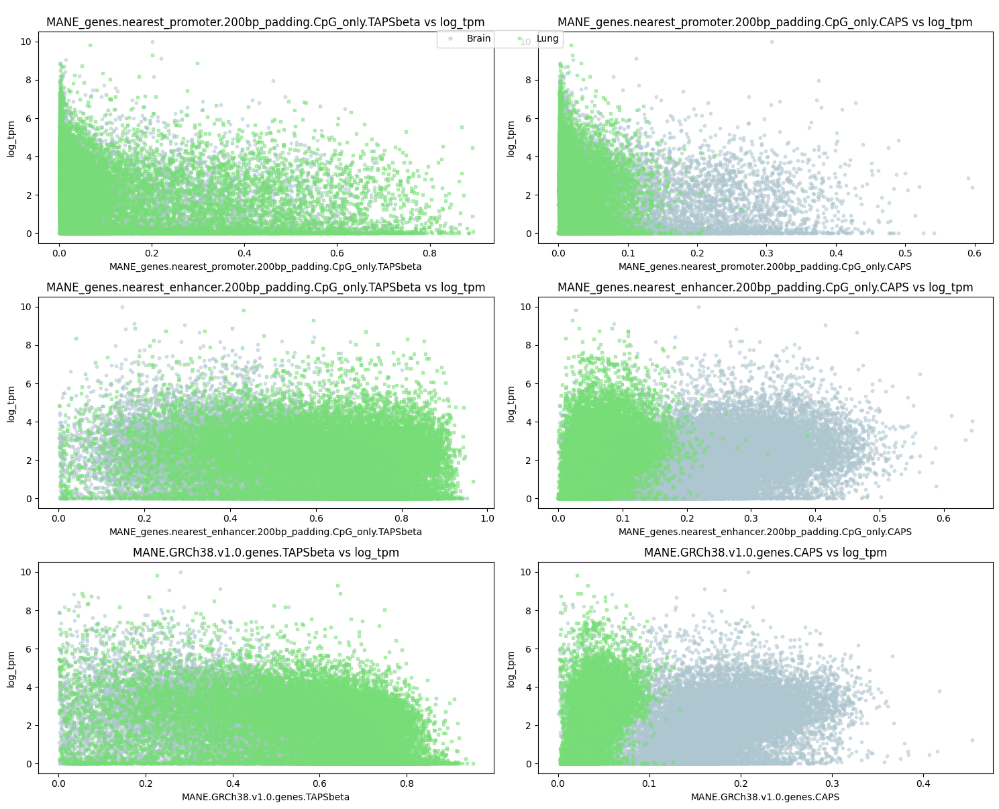

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming epigenetic_features, df, and somatic_tissue_types are defined
n = len(epigenetic_features)

# df = df.loc[df['tissue_x'].isin(somatic_tissue_types[3:9])]
# selected_tissues = somatic_tissue_types[4:6]
selected_tissues = ['Lung','Brain']
df = df.loc[df['tissue_x'].isin(selected_tissues)]


# Define specific pastel colors
pastel_colors = [
    '#aec6cf',  # Pastel blue
    '#77dd77',  # Pastel green
    '#ff6961',  # Pastel red
    '#cdb4db',  # Pastel purple
    '#ffb6c1'   # Pastel pink
]

# Ensure there are enough colors for the tissues, repeat the list if necessary
unique_tissues = df['tissue_x'].unique()
while len(pastel_colors) < len(unique_tissues):
    pastel_colors.extend(pastel_colors)

# Map each unique tissue to a color
color_dict = dict(zip(unique_tissues, pastel_colors[:len(unique_tissues)]))

# Define a list of markers, one for each tissue
markers = ['o', 's', '^', 'D', 'p', '*', 'X', '>', '<']  # Adjust as needed

# Create a dictionary mapping each unique tissue to a marker
marker_dict = dict(zip(df['tissue_x'].unique(), markers))

# Create figure with n/2 rows and 2 columns, adjust size as needed
fig, axs = plt.subplots(n//2 if n % 2 == 0 else n//2 + 1, 2, figsize=(15, n*2))
axs = axs.flatten()  # Flatten axs for easy iterating

# Plot each feature
for i, feature in enumerate(epigenetic_features):
    # Scatter plot with color and marker based on tissue
    for tissue in unique_tissues:
        tissue_df = df[df['tissue_x'] == tissue]
        tissue_df.loc[tissue_df['log_tpm']>0]
        axs[i].scatter(tissue_df[feature], tissue_df['log_tpm'], 
                       c=color_dict[tissue], marker=marker_dict[tissue], 
                       alpha=0.5, s=10, label=tissue)

    axs[i].set_xlabel(feature)
    axs[i].set_ylabel('log_tpm')
    axs[i].set_title(f'{feature} vs log_tpm')

# Remove unused subplots
for i in range(len(epigenetic_features), len(axs)):
    fig.delaxes(axs[i])

# Add an axis for the legend at the top of the figure
legend_ax = fig.add_axes([0.1, 0.92, 0.8, 0.08])
legend_ax.axis('off')

# Create a legend
legend_elements = [plt.Line2D([0], [0], marker=marker_dict[label], color='w', label=label, 
                              markerfacecolor=color, markersize=5, alpha=0.6) 
                   for label, color in color_dict.items()]
legend_ax.legend(handles=legend_elements, loc='center', ncol=len(color_dict))

plt.tight_layout()
plt.show()


In [60]:
display_feature_dict['MANE_genes.nearest_promoter.200bp_padding.CpG_only.CAPS'] = "Promoter Hydroxymethylation"
display_feature_dict['MANE_genes.nearest_enhancer.200bp_padding.CpG_only.CAPS'] = "Enhancer Hydroxymethylation"
display_feature_dict['MANE.GRCh38.v1.0.genes.CAPS'] = "Gene body Hydroxymethylation"

display_feature_dict['MANE_genes.nearest_promoter.200bp_padding.CpG_only.TAPSbeta'] = "Promoter Methylation"
display_feature_dict['MANE_genes.nearest_enhancer.200bp_padding.CpG_only.TAPSbeta'] = "Enhancer Methylation"
display_feature_dict['MANE.GRCh38.v1.0.genes.TAPSbeta'] = "Gene body Methylation"

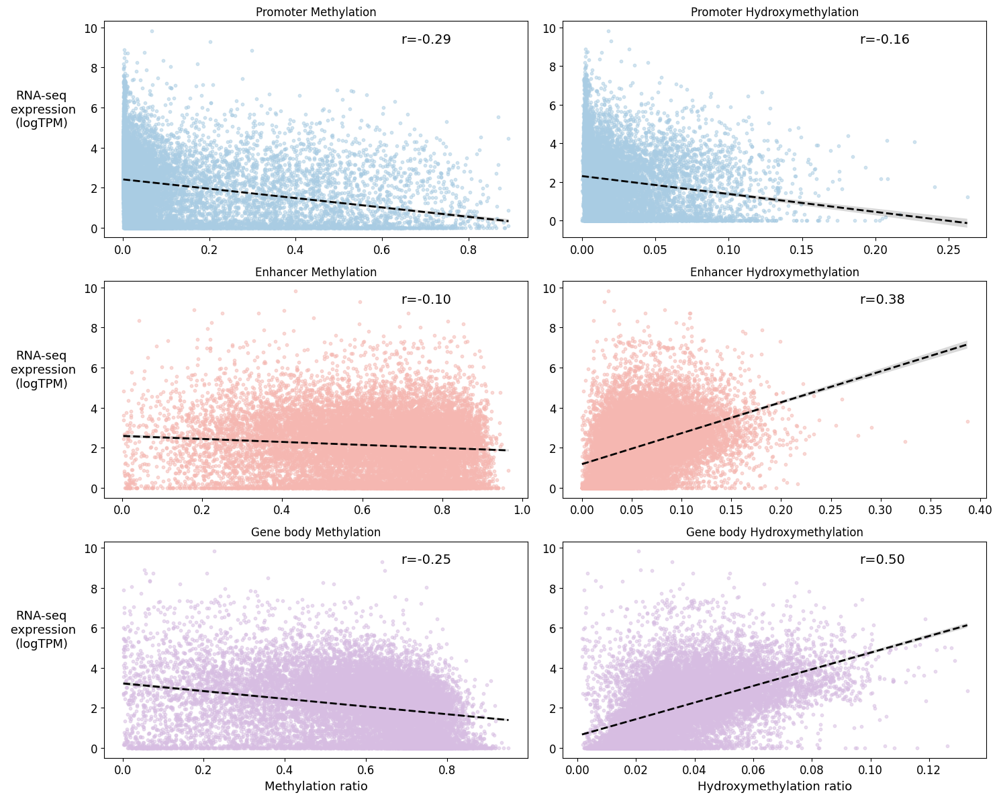

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# Assuming epigenetic_features, df, somatic_tissue_types, and display_feature_dict are defined
n = len(epigenetic_features)
selected_tissues = ['Lung']
df = df.loc[df['tissue_x'].isin(selected_tissues)]

# Define specific pastel colors, one for each row
# row_colors = ['#A9CCE3', '#F5B7B1', '#D7BDE2']  # Adjusted color list


row_colors = ['#A9CCE3','#A9CCE3',
              '#F5B7B1','#F5B7B1' , # Pastel red
              '#D7BDE2','#D7BDE2']  # Pastel purple


# Define a marker for the tissue
marker_dict = {'Lung': 'o'}  # Circle marker for Lung

# Define subsample size
subsample_size = 20000  # Adjust this as needed

# Create figure with n/2 rows and 2 columns, adjust size as needed
fig, axs = plt.subplots(n // 2 if n % 2 == 0 else n // 2 + 1, 2, figsize=(15, n*2))
axs = axs.flatten()  # Flatten axs for easy iterating

# Plot each feature
for i, feature in enumerate(epigenetic_features):
#     row_color = row_colors[i % len(row_colors)]  # Select the color for the current row
    row_color = row_colors[i]
    tissue = 'Lung'
    tissue_df = df[df['tissue_x'] == tissue]
    
    # Apply subsampling if necessary
    if len(tissue_df) > subsample_size:
        tissue_df = tissue_df.sample(n=subsample_size, random_state=42)
    
    # Scatter plot with color and marker based on tissue
    axs[i].scatter(tissue_df[feature], tissue_df['log_tpm'],
                   c=row_color, marker=marker_dict[tissue],
                   alpha=0.5, s=10)
    
    # Add trend line with regression
    sns.regplot(x=feature, y='log_tpm', data=tissue_df, ax=axs[i],
                scatter=False, color='k', line_kws={"lw": 2, "linestyle": "--"})

    # Calculate the correlation coefficient and annotate the plot
    corr, _ = pearsonr(tissue_df[feature], tissue_df['log_tpm'])
    axs[i].annotate(f'r={corr:.2f}', xy=(0.7, 0.9), xycoords='axes fraction', 
                    fontsize=14, color='black')  # Increase annotation text size

    # Increase tick label size
    axs[i].tick_params(axis='both', which='major', labelsize=12)

    # Remove the x-axis label
    axs[i].set_xlabel('')  
    # Include the y-axis label only on left-hand plots
    if i % 2 == 0:
        axs[i].set_ylabel('RNA-seq\n expression\n(logTPM)',labelpad=45,rotation=0,fontsize=13)
    else:
        axs[i].set_ylabel('')
        
    if i == 4:
        axs[i].set_xlabel('Methylation ratio',fontsize=13)
        
    if i ==5:
        axs[i].set_xlabel('Hydroxymethylation ratio',fontsize=13)

    axs[i].set_title(f'{display_feature_dict[feature]}', fontsize=12)

# Remove unused subplots
for i in range(len(epigenetic_features), len(axs)):
    fig.delaxes(axs[i])

# Adjust the layout
plt.tight_layout()

fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/ge_predict/"

# plt.savefig(fig_savedir + "Feature_mC_hmC_correlation_with_logTPM.thesis_clean.png",
#            dpi=300)

# Display the plot
plt.show()


In [62]:

# epigenetic_rna_seq_merged.dropna(inplace=True)
# epigenetic_rna_seq_merged['log_tpm'] = epigenetic_rna_seq_merged['tpm'].apply(lambda x: np.log1p(x))
df = epigenetic_rna_seq_merged[~epigenetic_rna_seq_merged['tissue_x'].str.contains('Tumour|cirrhosis|pancreatitis', case=False)]

### Correlation analysis

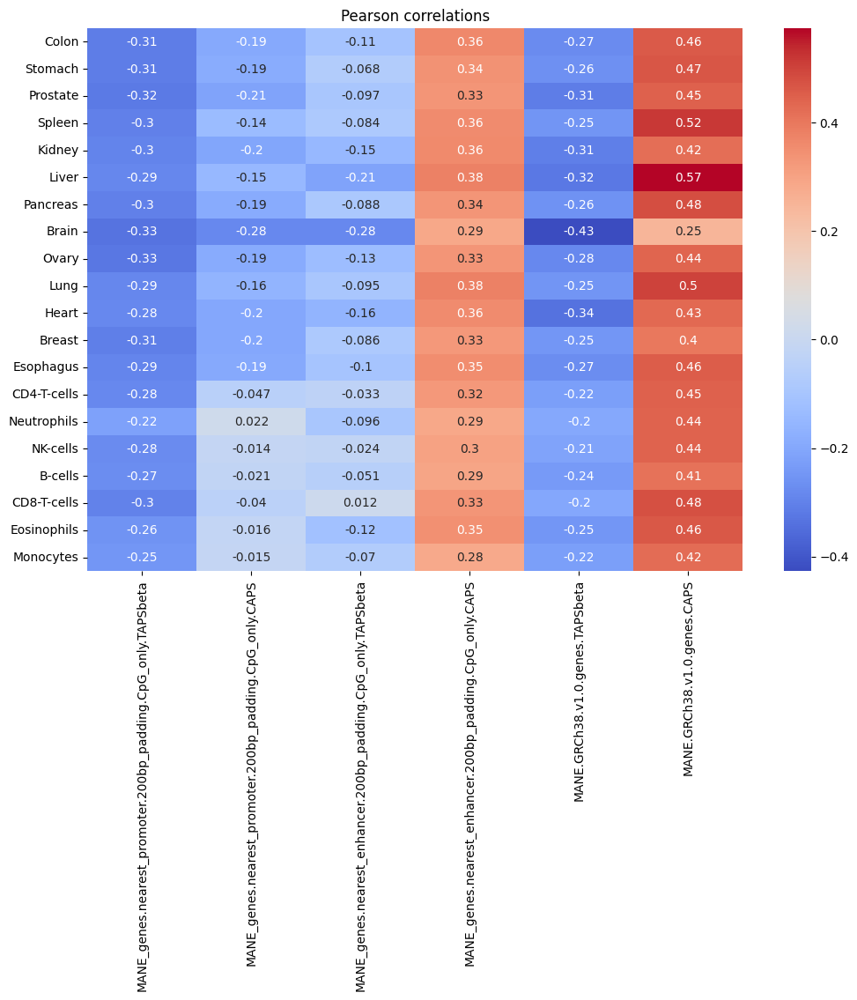

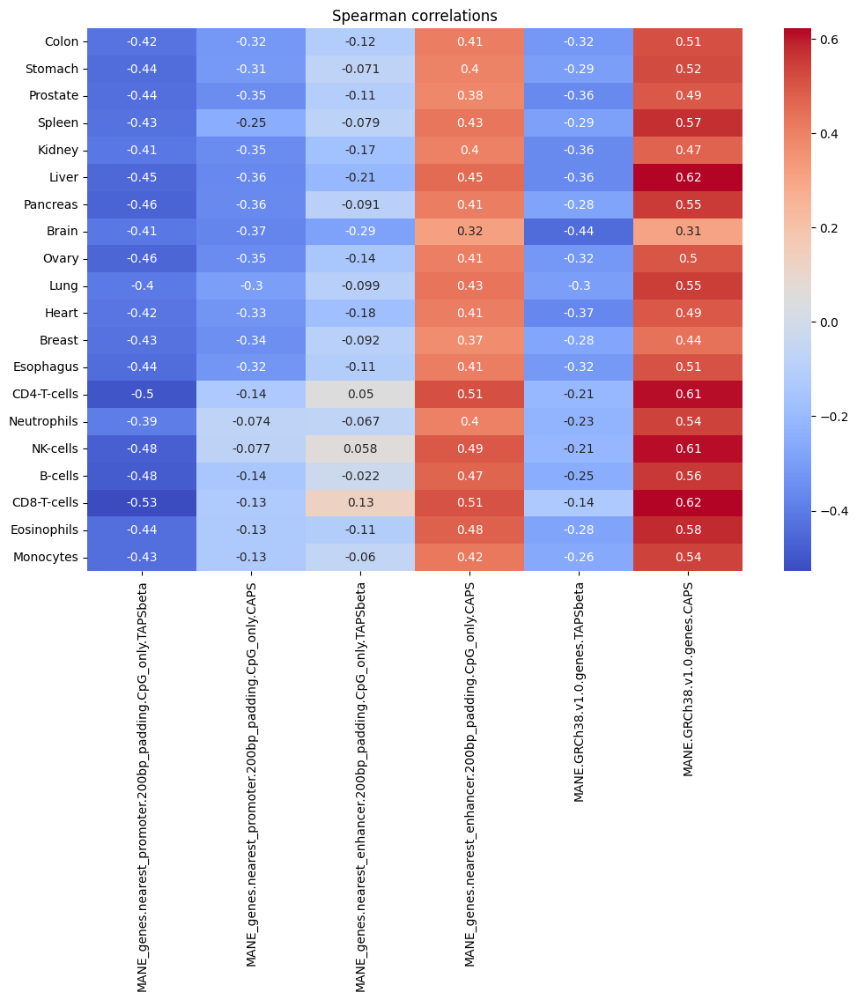

In [63]:
from scipy.stats import spearmanr, pearsonr

value_only = False


tissues = df['tissue_x'].unique()

# Initialize correlation matrices
pearson_corrs = np.zeros((len(tissues), len(epigenetic_features)))
spearman_corrs = np.zeros((len(tissues), len(epigenetic_features)))

for i, tissue in enumerate(tissues):
    tissue_df = df[df['tissue_x'] == tissue]
    
    for j, feature in enumerate(epigenetic_features):
        # Compute correlations
        pearson_corrs[i, j] = pearsonr(tissue_df[feature], tissue_df['log_tpm'])[0]
        spearman_corrs[i, j] = spearmanr(tissue_df[feature], tissue_df['log_tpm'])[0]

fig, ax = plt.subplots(1, 1, figsize=(12,8))

cmap="coolwarm"
# Plot heatmaps
if value_only:
    sns.heatmap(np.abs(pearson_corrs), annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features,cmap=cmap)
    ax.set_title("Pearson correlations (value only)")
else:
    sns.heatmap(pearson_corrs, annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features,cmap=cmap)
    ax.set_title("Pearson correlations")



fig, ax = plt.subplots(1, 1, figsize=(12,8))

# Plot heatmaps
if value_only:
    sns.heatmap(np.abs(spearman_corrs), annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features,cmap=cmap)
    ax.set_title("Spearman correlations (value only)")
else:
    sns.heatmap(spearman_corrs, annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features,cmap=cmap)
    ax.set_title("Spearman correlations")

# plt.tight_layout()
# plt.show()


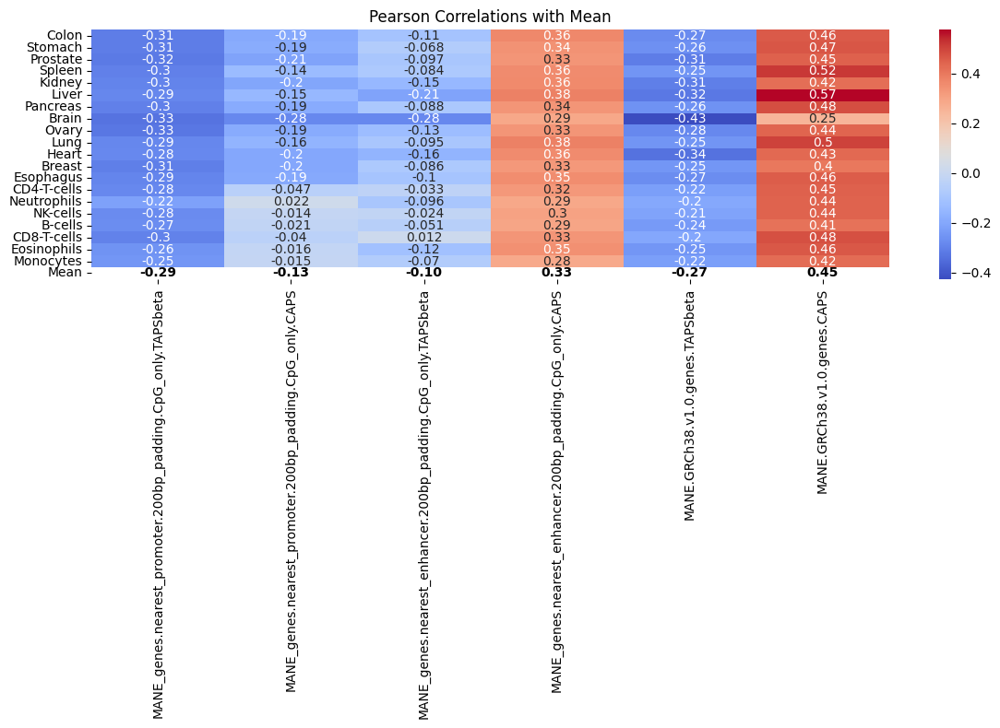

In [64]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# Assuming df, tissues, and epigenetic_features are defined
tissues = df['tissue_x'].unique()

# Initialize the Pearson correlation matrix
pearson_corrs = np.zeros((len(tissues), len(epigenetic_features)))

for i, tissue in enumerate(tissues):
    tissue_df = df[df['tissue_x'] == tissue]
    for j, feature in enumerate(epigenetic_features):
        # Compute Pearson correlation
        pearson_corrs[i, j] = pearsonr(tissue_df[feature], tissue_df['log_tpm'])[0]

# Calculate the mean Pearson correlation for each feature
mean_corrs = np.mean(pearson_corrs, axis=0)

# Append the mean correlations as a new row at the bottom of the existing matrix
pearson_corrs_with_mean = np.vstack((pearson_corrs, mean_corrs))

# Create a mask for the last row
mask = np.zeros_like(pearson_corrs_with_mean, dtype=bool)
mask[-1, :] = True

# Create the heatmap
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(pearson_corrs_with_mean, annot=True, cmap="coolwarm",
            yticklabels=list(tissues) + ["Mean"], xticklabels=epigenetic_features, ax=ax,
            mask=mask, 
#             cbar_kws={'aspect': 50}, square=True,
           )

# Annotate the last row with bold text
for j, val in enumerate(mean_corrs):
    ax.text(j + 0.5, len(tissues) + 0.5, f"{val:.2f}",
            ha="center", va="center", fontsize=10,
            color="black", fontweight="bold")

ax.set_title("Pearson Correlations with Mean")

plt.tight_layout()
plt.show()


### Stratify correlation by tissue specificity

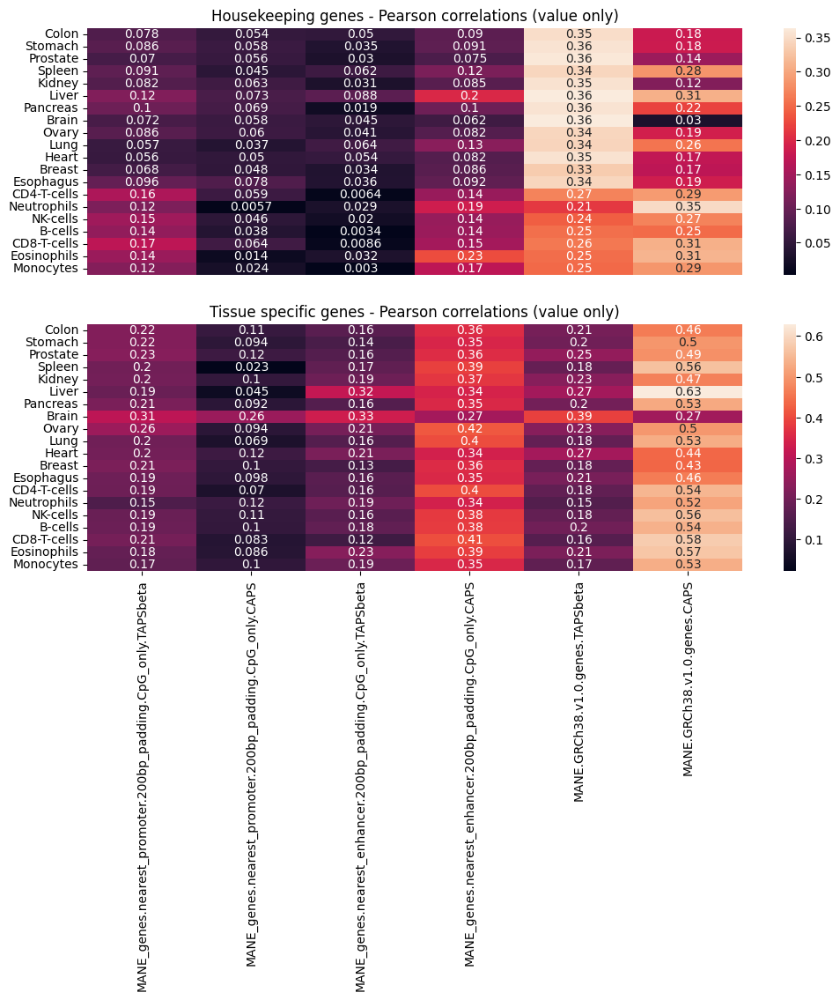

In [66]:
from scipy.stats import spearmanr, pearsonr

value_only = True


tissues = df['tissue_x'].unique()

# Initialize correlation matrices
pearson_corrs = np.zeros((len(tissues), len(epigenetic_features)))
spearman_corrs = np.zeros((len(tissues), len(epigenetic_features)))


### Housekeeping genes
fig, axes = plt.subplots(2, 1, figsize=(12,8))
for i, tissue in enumerate(tissues):
    tissue_df = df[df['tissue_x'] == tissue]
    tissue_df = tissue_df.loc[tissue_df['gene'].isin(housekeeping_genes)]
    for j, feature in enumerate(epigenetic_features):
        # Compute correlations
        pearson_corrs[i, j] = pearsonr(tissue_df[feature], tissue_df['log_tpm'])[0]
        spearman_corrs[i, j] = spearmanr(tissue_df[feature], tissue_df['log_tpm'])[0]


ax = axes[0]
# Plot heatmaps
if value_only:
    sns.heatmap(np.abs(pearson_corrs), annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features)
    ax.set_title("Housekeeping genes - Pearson correlations (value only)")
else:
    sns.heatmap(pearson_corrs, annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features)
    ax.set_title("Housekeeping genes - Pearson correlations")


ax.set_xticks([])

    
    
### Tissue specific genes
for i, tissue in enumerate(tissues):
    tissue_df = df[df['tissue_x'] == tissue]
    tissue_df = tissue_df.loc[tissue_df['gene'].isin(tissue_specific_genes)]
    for j, feature in enumerate(epigenetic_features):
        # Compute correlations
        pearson_corrs[i, j] = pearsonr(tissue_df[feature], tissue_df['log_tpm'])[0]
        spearman_corrs[i, j] = spearmanr(tissue_df[feature], tissue_df['log_tpm'])[0]


ax = axes[1]
# Plot heatmaps
if value_only:
    sns.heatmap(np.abs(pearson_corrs), annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features)
    ax.set_title("Tissue specific genes - Pearson correlations (value only)")
else:
    sns.heatmap(pearson_corrs, annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features)
    ax.set_title("Tissue specific genes - Pearson correlations")
    
    
    

# fig, ax = plt.subplots(1, 1, figsize=(12,8))

# # Plot heatmaps
# if value_only:
#     sns.heatmap(np.abs(spearman_corrs), annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features)
#     ax.set_title("Spearman correlations (value only)")
# else:
#     sns.heatmap(spearman_corrs, annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features)
#     ax.set_title("Spearman correlations")

# # plt.tight_layout()
# # plt.show()


In [67]:
def calculate_feature_correlation(feature,df_subset=df):
    """
    Calculate correlation between a given epigenetic feature and logTPM for each tissue.
    
    Args:
    - feature (str): Epigenetic feature column name
    
    Returns:
    - numpy array: Matrix of correlations
    """
    # Get unique tissues from the subset
    tissue_x_values = df_subset['tissue_x'].unique()
    rna_seq_tissue_values = df_subset['rna_seq_tissue_name'].unique()
    
    # Initialize matrix to store correlations
    correlation_matrix = np.zeros((len(tissue_x_values), len(rna_seq_tissue_values)))
    
    # Calculate correlations
    for i, tissue_x in enumerate(tissue_x_values):
        for j, rna_tissue in enumerate(rna_seq_tissue_values):
            feature_values = df_subset[df_subset['tissue_x'] == tissue_x][feature].values
            log_tpm_values = df_subset[df_subset['rna_seq_tissue_name'] == rna_tissue]['log_tpm'].values
            if len(feature_values) > 1 and len(log_tpm_values) > 1:  # Ensure we have more than one data point
                correlation_matrix[i, j] = np.corrcoef(feature_values, log_tpm_values)[0, 1]
    
    return correlation_matrix

In [68]:
df = epigenetic_rna_seq_merged[~epigenetic_rna_seq_merged['tissue_x'].str.contains('Tumour|cirrhosis|pancreatitis', case=False)]

In [69]:
from scipy.stats import spearmanr, pearsonr
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df, tissues, epigenetic_features, housekeeping_genes, and tissue_specific_genes are defined
tissues = df['tissue_x'].unique()

# Initialize correlation matrices
all_gene_pearson_corrs = np.zeros((len(tissues), len(epigenetic_features)))
housekeeping_pearson_corrs = np.zeros((len(tissues), len(epigenetic_features)))
tissue_specific_pearson_corrs = np.zeros((len(tissues), len(epigenetic_features)))

# Calculate correlations for all genes
for i, tissue in enumerate(tissues):
    tissue_df = df[df['tissue_x'] == tissue]
    for j, feature in enumerate(epigenetic_features):
        all_gene_pearson_corrs[i, j] = pearsonr(tissue_df[feature], tissue_df['log_tpm'])[0]

# Calculate correlations for housekeeping genes
for i, tissue in enumerate(tissues):
    tissue_df = df[(df['tissue_x'] == tissue) & df['gene'].isin(housekeeping_genes)]
    for j, feature in enumerate(epigenetic_features):
        housekeeping_pearson_corrs[i, j] = pearsonr(tissue_df[feature], tissue_df['log_tpm'])[0]

# Calculate correlations for tissue-specific genes
for i, tissue in enumerate(tissues):
    tissue_df = df[(df['tissue_x'] == tissue) & df['gene'].isin(tissue_specific_genes)]
    for j, feature in enumerate(epigenetic_features):
        tissue_specific_pearson_corrs[i, j] = pearsonr(tissue_df[feature], tissue_df['log_tpm'])[0]
        

        
df_subset = df.loc[df['gene'].isin(tissue_specific_genes)]
feature = epigenetic_features[-1]
correlation_matrix = calculate_feature_correlation(feature,df_subset=df_subset)

# # Create figure with 3 subplots, one for each gene category
# fig, axes = plt.subplots(3, 1, figsize=(12, 24), sharex=True)

# # Set the same color scheme for all heatmaps
# cmap = "coolwarm"

# # Plot heatmap for all genes
# sns.heatmap(all_gene_pearson_corrs, annot=True, ax=axes[0], yticklabels=tissues, xticklabels=epigenetic_features, cmap=cmap)
# axes[0].set_title("All genes - Pearson correlations")
# axes[0].set_xticklabels(axes[0].get_xticklabels(), rotation=45, ha="right")

# # Plot heatmap for housekeeping genes
# sns.heatmap(housekeeping_pearson_corrs, annot=True, ax=axes[1], yticklabels=tissues, xticklabels=epigenetic_features, cmap=cmap)
# axes[1].set_title("Housekeeping genes - Pearson correlations")
# axes[1].set_xticklabels([])  # Hide x-tick labels for the middle plot

# # Plot heatmap for tissue-specific genes
# sns.heatmap(tissue_specific_pearson_corrs, annot=True, ax=axes[2], yticklabels=tissues, xticklabels=epigenetic_features, cmap=cmap)
# axes[2].set_title("Tissue specific genes - Pearson correlations")
# axes[2].set_xticklabels(axes[2].get_xticklabels(), rotation=45, ha="right")

# # Hide x-tick labels for the middle plot
# axes[1].set_xticklabels([])

# # Adjust the layout
# plt.tight_layout()

# # Show the figure
# plt.show()


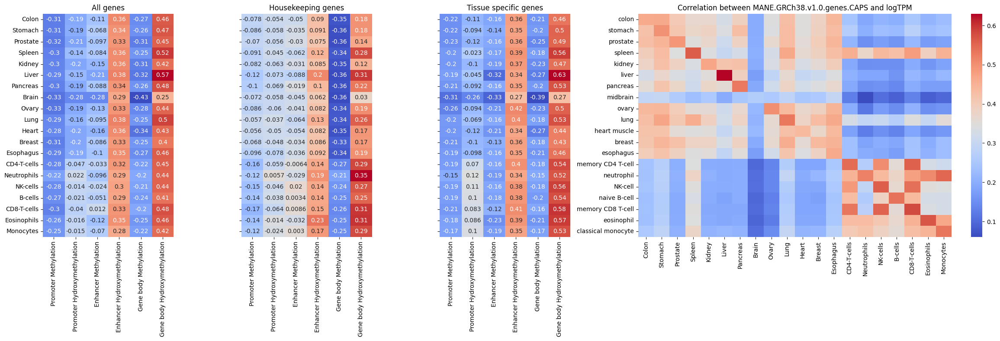

In [70]:
import matplotlib.gridspec as gridspec


# Create figure with GridSpec layout
fig = plt.figure(figsize=(24, 8))  # You may need to adjust the size to fit your display
gs = gridspec.GridSpec(1, 4, width_ratios=[1, 1, 1, 3])

xlabel_features = [display_feature_dict[feature] for feature in epigenetic_features]

# Function to plot a heatmap without annotations
def plot_heatmap(ax, data, title,include_ticklabels=False):
    sns.heatmap(data, annot=True, cmap="coolwarm", cbar=False, ax=ax)
    ax.set_title(title)
    
    if include_ticklabels:
        ax.set_yticklabels(tissues,rotation=0)
    else:
        ax.set_yticklabels([])
    
    ax.set_xticklabels(xlabel_features,rotation=90)


# Plot each heatmap
plot_heatmap(plt.subplot(gs[0, 0]), all_gene_pearson_corrs,"All genes",include_ticklabels=True)
plot_heatmap(plt.subplot(gs[0, 1]), housekeeping_pearson_corrs, "Housekeeping genes")
plot_heatmap(plt.subplot(gs[0, 2]), tissue_specific_pearson_corrs, "Tissue specific genes")

# Plot the fourth heatmap
ax4 = plt.subplot(gs[0, 3])
# df_subset = df.loc[df['gene'].isin(tissue_specific_genes)]
# feature = epigenetic_features[-1]
# correlation_matrix = calculate_feature_correlation(feature,df_subset=df_subset)  # Define this function or replace with correct calculations
sns.heatmap(correlation_matrix.T, 
            annot=False,  # Assuming you want annotations for this one
            cmap="coolwarm", 
            yticklabels=df_subset['rna_seq_tissue_name'].unique(), 
            xticklabels=df_subset['tissue_x'].unique(), ax=ax4)
ax4.set_title(f'Correlation between {feature} and logTPM')
# ax4.set_ylabel('RNA-Seq Tissue Name')
ax4.set_ylabel('')
ax4.set_xlabel('')

# Adjust the layout
plt.tight_layout()

# Show the figure
plt.show()

In [71]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# import numpy as np
# import matplotlib.gridspec as gridspec
# from scipy.stats import pearsonr

# # Assuming df, tissues, epigenetic_features, housekeeping_genes, and tissue_specific_genes are defined

# # ... Your code for computing the correlation matrices goes here ...

# # Create figure with GridSpec layout
# fig = plt.figure(figsize=(24, 10))  # Adjust the size to fit your display
# gs = gridspec.GridSpec(2, 4, height_ratios=[4, 1], width_ratios=[1, 1, 1, 3])

# xlabel_features = [display_feature_dict[feature] for feature in epigenetic_features]

# # Function to plot a heatmap without annotations
# def plot_heatmap(ax, data, title, include_ticklabels=False):
#     sns.heatmap(data, annot=False, cmap="coolwarm", cbar=False, ax=ax)
#     ax.set_title(title)
#     if include_ticklabels:
#         ax.set_yticklabels(tissues, rotation=0)
#     else:
#         ax.set_yticklabels([])
#     ax.set_xticklabels(xlabel_features, rotation=90)

# # Function to plot a bar chart for mean values
# def plot_mean_values(ax, data):
#     mean_values = np.mean(data, axis=0)
#     ax.bar(x=np.arange(len(mean_values)), height=mean_values)
#     ax.set_xticks(np.arange(len(mean_values)))
#     ax.set_xticklabels(xlabel_features, rotation=90)

# # Plot each heatmap and the corresponding mean value panel
# for i in range(3):
#     plot_heatmap(plt.subplot(gs[0, i]), all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs, "All genes" if i == 0 else "Housekeeping genes" if i == 1 else "Tissue specific genes", include_ticklabels=True if i == 0 else False)
#     plot_mean_values(plt.subplot(gs[1, i]), all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs)

# # Plot the fourth heatmap
# ax4 = plt.subplot(gs[:, 3])
# df_subset = df.loc[df['gene'].isin(tissue_specific_genes)]
# feature = epigenetic_features[-1]
# correlation_matrix = calculate_feature_correlation(feature)  # Define this function or replace with correct calculations
# sns.heatmap(correlation_matrix.T, 
#             annot=True, 
#             cmap="coolwarm", 
#             yticklabels=df_subset['rna_seq_tissue_name'].unique(), 
#             xticklabels=df_subset['tissue_x'].unique(), ax=ax4)
# ax4.set_title(f'Correlation between {feature} and logTPM')
# ax4.set_ylabel('')
# ax4.set_xlabel('')

# # Adjust the layout
# plt.tight_layout()

# # Show the figure
# plt.show()


In [72]:

# # Create figure with GridSpec layout
# fig = plt.figure(figsize=(24, 10))  # Adjust the size to fit your display
# gs = gridspec.GridSpec(2, 4, height_ratios=[4, 1], width_ratios=[1, 1, 1, 3])

# xlabel_features = [display_feature_dict[feature] for feature in epigenetic_features]

# # Function to plot a heatmap without annotations
# def plot_heatmap(ax, data, title, include_ticklabels=False):
#     sns.heatmap(data, annot=False, cmap="coolwarm", cbar=False, ax=ax)
#     ax.set_title(title)
#     if include_ticklabels:
#         ax.set_yticklabels(tissues, rotation=0)
#     else:
#         ax.set_yticklabels([])
#     ax.set_xticklabels(xlabel_features, rotation=90)

# # Function to plot a line for mean values with annotations
# def plot_mean_values(ax, data):
#     mean_values = np.mean(data, axis=0)
#     # Plotting thin lines for each feature
#     for i, mean in enumerate(mean_values):
#         ax.hlines(mean, i - 0.4, i + 0.4, color='blue')  # Drawing a horizontal line
#         # Annotating the mean value
#         ax.text(i, mean, f'{mean:.2f}', ha='center', va='bottom' if mean >= 0 else 'top', color='black')

#     ax.set_xticks(np.arange(len(mean_values)))
#     ax.set_xticklabels(xlabel_features, rotation=90)
#     ax.set_ylim(min(mean_values) - 0.1, max(mean_values) + 0.1)  # Adjust the y-axis limit for visibility

# # Plot each heatmap and the corresponding mean value panel
# for i in range(3):
#     plot_heatmap(plt.subplot(gs[0, i]), all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs, "All genes" if i == 0 else "Housekeeping genes" if i == 1 else "Tissue specific genes", include_ticklabels=True if i == 0 else False)
#     plot_mean_values(plt.subplot(gs[1, i]), all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs)

# # Plot the fourth heatmap
# ax4 = plt.subplot(gs[:, 3])
# df_subset = df.loc[df['gene'].isin(tissue_specific_genes)]
# feature = epigenetic_features[-1]
# correlation_matrix = calculate_feature_correlation(feature)  # Define this function or replace with correct calculations
# sns.heatmap(correlation_matrix.T, 
#             annot=True, 
#             cmap="coolwarm", 
# #             yticklabels=df_subset['rna_seq_tissue_name'].unique(), 
#             yticklabels=df_subset['tissue_x'].unique(), 
#             xticklabels=df_subset['tissue_x'].unique(), ax=ax4)
# ax4.set_title(f'Correlation between {feature} and logTPM')
# ax4.set_ylabel('')
# ax4.set_xlabel('')

# # Adjust the layout
# plt.tight_layout()

# # Show the figure
# plt.show()

In [73]:

# # Create figure with GridSpec layout
# fig = plt.figure(figsize=(24, 10))  # Adjust the size to fit your display
# gs = gridspec.GridSpec(2, 4, height_ratios=[4, 1], width_ratios=[1, 1, 1, 3])

# xlabel_features = [display_feature_dict[feature] for feature in epigenetic_features]

# # Function to plot a heatmap without annotations
# def plot_heatmap(ax, data, title, include_ticklabels=False):
#     sns.heatmap(data, annot=False, cmap="coolwarm", cbar=False, ax=ax)
#     ax.set_title(title)
#     if include_ticklabels:
#         ax.set_yticklabels(tissues, rotation=0)
#     else:
#         ax.set_yticklabels([])
# #     ax.set_xticklabels(xlabel_features, rotation=90)
#     ax.set_xticklabels([])

# # Function to plot a line for mean values with annotations
# def plot_mean_values(ax, data):
#     mean_values = np.mean(data, axis=0)
#     # Plotting thin lines for each feature
#     for i, mean in enumerate(mean_values):
#         ax.hlines(mean, i - 0.4, i + 0.4, color='blue')  # Drawing a horizontal line
#         # Annotating the mean value
#         ax.text(i, mean, f'{mean:.2f}', ha='center', va='bottom' if mean >= 0 else 'top', color='black')

#     ax.set_xticks(np.arange(len(mean_values)))
#     ax.set_xticklabels(xlabel_features, rotation=90)
#     ax.set_ylim(min(mean_values) - 0.1, max(mean_values) + 0.1)  # Adjust the y-axis limit for visibility

# # Plot each heatmap and the corresponding mean value panel
# for i in range(3):
#     plot_heatmap(plt.subplot(gs[0, i]), all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs, "All genes" if i == 0 else "Housekeeping genes" if i == 1 else "Tissue specific genes", include_ticklabels=True if i == 0 else False)
#     plot_mean_values(plt.subplot(gs[1, i]), all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs)

# # Plot the fourth heatmap
# ax4 = plt.subplot(gs[:, 3])
# df_subset = df.loc[df['gene'].isin(tissue_specific_genes)]
# feature = epigenetic_features[-1]
# correlation_matrix = calculate_feature_correlation(feature)  # Define this function or replace with correct calculations
# sns.heatmap(correlation_matrix.T, 
#             annot=True, 
#             cmap="coolwarm", 
# #             yticklabels=df_subset['rna_seq_tissue_name'].unique(), 
#             yticklabels=df_subset['tissue_x'].unique(), 
#             xticklabels=df_subset['tissue_x'].unique(), ax=ax4)
# ax4.set_title(f'Correlation between {feature} and logTPM')
# ax4.set_ylabel('')
# ax4.set_xlabel('')

# # Adjust the layout
# plt.tight_layout()

# # Show the figure
# plt.show()

In [74]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# import numpy as np
# import matplotlib.gridspec as gridspec

# # Assuming df, tissues, epigenetic_features, housekeeping_genes, and tissue_specific_genes are defined
# # ... Your code for computing the correlation matrices goes here ...

# # Create figure with GridSpec layout
# fig = plt.figure(figsize=(24, 8))  # Adjust the size to fit your display
# gs = gridspec.GridSpec(1, 4, width_ratios=[1, 1, 1, 3])

# xlabel_features = [display_feature_dict[feature] for feature in epigenetic_features]

# # Function to plot a heatmap without annotations
# def plot_heatmap(ax, data, title, include_ticklabels=False):
#     sns.heatmap(data, annot=False, cmap="coolwarm", cbar=False, ax=ax)
#     ax.set_title(title)
#     if include_ticklabels:
#         ax.set_yticklabels(tissues, rotation=0)
#     else:
#         ax.set_yticklabels([])
#     ax.set_xticklabels(xlabel_features, rotation=90)

# # Function to plot thin vertical lines with horizontal ends for mean values
# def plot_mean_values(ax, data):
#     mean_values = np.mean(data, axis=0)
#     # Plotting thin vertical lines with horizontal ends
#     for i, mean in enumerate(mean_values):
#         ax.plot([i, i], [0, mean], color='blue', lw=2)  # Vertical line
#         ax.plot([i - 0.1, i + 0.1], [mean, mean], color='blue', lw=2)  # Horizontal end
#         # Annotating the mean value
#         ax.text(i, mean, f'{mean:.2f}', ha='center', va='bottom' if mean >= 0 else 'top', fontsize=8)

#     ax.set_xticks(np.arange(len(mean_values)))
#     ax.set_xticklabels(xlabel_features, rotation=90)
#     ax.set_ylim(min(mean_values) - 0.1, max(mean_values) + 0.1)  # Adjust y-axis limit for visibility

# # Plot each heatmap and corresponding mean value panel
# for i in range(3):
#     plot_heatmap(plt.subplot(gs[0, i]), all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs, "All genes" if i == 0 else "Housekeeping genes" if i == 1 else "Tissue specific genes", include_ticklabels=True if i == 0 else False)
#     ax2 = fig.add_subplot(gs[0, i], sharex=plt.subplot(gs[0, i]))
#     plot_mean_values(ax2, all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs)
#     plt.setp(ax2.get_xticklabels(), visible=False)  # Hide x-tick labels for the heatmap plots

# # Plot the fourth heatmap
# ax4 = plt.subplot(gs[0, 3])
# df_subset = df.loc[df['gene'].isin(tissue_specific_genes)]
# feature = epigenetic_features[-1]
# correlation_matrix = calculate_feature_correlation(feature)  # Define this function or replace with correct calculations
# sns.heatmap(correlation_matrix.T, 
#             annot=True, 
#             cmap="coolwarm", 
#             yticklabels=df_subset['rna_seq_tissue_name'].unique(), 
#             xticklabels=df_subset['tissue_x'].unique(), ax=ax4)
# ax4.set_title(f'Correlation between {feature} and logTPM')
# ax4.set_ylabel('')
# ax4.set_xlabel('')

# # Adjust the layout
# plt.tight_layout()

# # Show the figure
# plt.show()


In [75]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# import numpy as np
# import matplotlib.gridspec as gridspec
# from scipy.stats import pearsonr

# # Assuming df, tissues, epigenetic_features, housekeeping_genes, and tissue_specific_genes are defined
# # ... Your code for computing the correlation matrices goes here ...

# # Create figure with GridSpec layout
# fig = plt.figure(figsize=(24, 10))  # Adjust the size to fit your display
# # Define a GridSpec with 2 rows: one for heatmaps and one for mean value plots
# gs = gridspec.GridSpec(2, 4, height_ratios=[5, 1], width_ratios=[1, 1, 1, 3])

# xlabel_features = [display_feature_dict[feature] for feature in epigenetic_features]

# # Function to plot a heatmap
# def plot_heatmap(ax, data, title, yticklabels=True):
#     sns.heatmap(data, annot=True, cmap="coolwarm", cbar=False, ax=ax)
#     ax.set_title(title)
#     ax.set_xticklabels(xlabel_features, rotation=90, ha='center')
#     if yticklabels:
#         ax.set_yticklabels(tissues, rotation=0)
#     else:
#         ax.set_yticklabels([])

# # Function to plot mean value lines
# def plot_mean_values(ax, data, xlabels):
#     mean_values = np.mean(data, axis=0)
#     # Plotting thin vertical lines with horizontal ends
#     ax.vlines(range(len(mean_values)), [0]*len(mean_values), mean_values, color='blue', linewidth=2)
#     ax.plot(range(len(mean_values)), mean_values, 'D', color='blue')  # 'D' for diamond marker
#     for i, mean in enumerate(mean_values):
#         ax.text(i, mean, f'{mean:.2f}', ha='center', va='bottom' if mean >= 0 else 'top', fontsize=8)

#     ax.set_xticks(range(len(xlabels)))
#     ax.set_xticklabels(xlabels, rotation=90, ha='center')
#     ax.set_yticks([])

# # Plot each heatmap and corresponding mean value panel
# for i in range(3):
#     ax_heatmap = fig.add_subplot(gs[0, i])
#     plot_heatmap(ax_heatmap, all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs, "All genes" if i == 0 else "Housekeeping genes" if i == 1 else "Tissue specific genes", yticklabels=i==0)
#     ax_means = fig.add_subplot(gs[1, i], sharex=ax_heatmap)
#     plot_mean_values(ax_means, all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs, xlabel_features)

# # Plot the fourth heatmap
# ax4 = fig.add_subplot(gs[:, 3])
# df_subset = df.loc[df['gene'].isin(tissue_specific_genes)]
# feature = epigenetic_features[-1]
# correlation_matrix = calculate_feature_correlation(feature)  # Define this function or replace with correct calculations
# sns.heatmap(correlation_matrix.T, 
#             annot=True,  # Assuming you want annotations for this one
#             cmap="coolwarm", 
#             yticklabels=df_subset['rna_seq_tissue_name'].unique(), 
#             xticklabels=df_subset['tissue_x'].unique(), ax=ax4)
# ax4.set_title(f'Correlation between {feature} and logTPM')
# ax4.set_ylabel('RNA-Seq Tissue Name')
# ax4.set_xlabel('Tissue_x')

# # Adjust the layout
# plt.tight_layout()

# # Show the figure
# plt.show()


In [76]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# import numpy as np
# import matplotlib.gridspec as gridspec
# from scipy.stats import pearsonr

# # Assuming df, tissues, epigenetic_features, housekeeping_genes, and tissue_specific_genes are defined
# # ... Your code for computing the correlation matrices goes here ...

# # Create figure with GridSpec layout
# fig = plt.figure(figsize=(24, 10))  # Adjust the size to fit your display
# # Define a GridSpec with 2 rows: one for heatmaps and one for mean value plots
# gs = gridspec.GridSpec(2, 4, height_ratios=[5, 1], width_ratios=[1, 1, 1, 3])

# xlabel_features = [display_feature_dict[feature] for feature in epigenetic_features]

# # Function to plot a heatmap
# def plot_heatmap(ax, data, title, yticklabels=True):
#     sns.heatmap(data, annot=True, cmap="coolwarm", cbar=False, ax=ax)
#     ax.set_title(title)
#     ax.set_xticklabels([])
#     if yticklabels:
#         ax.set_yticklabels(tissues, rotation=0)
#     else:
#         ax.set_yticklabels([])
        
#     ax.set_xticklabels([])

# # Function to plot mean value lines
# def plot_mean_values(ax, data, xlabels):
#     mean_values = np.mean(data, axis=0)
#     # Plotting thin vertical lines
#     for i, mean in enumerate(mean_values):
#         color = 'red' if mean > 0 else 'blue'
#         ax.vlines(i+0.5, 0, mean, color=color, linewidth=2)
#         # Adding a horizontal line at the end of the vertical line
#         ax.hlines(mean+0.5, i - 0.1, i + 0.1, color=color, linewidth=2)
#         # Annotating the mean value
#         ax.text(i+0.5, mean, f'{mean:.2f}', ha='center', va='bottom' if mean >= 0 else 'top', fontsize=8)

#     ax.set_xticks(np.arange(len(xlabels)))
#     ax.set_xticklabels(xlabels, rotation=90, ha='center')
#     ax.set_yticks([])
#     ax.grid(visible=True)

# # Plot each heatmap and corresponding mean value panel
# for i in range(3):
#     ax_heatmap = fig.add_subplot(gs[0, i])
#     plot_heatmap(ax_heatmap, all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs, "All genes" if i == 0 else "Housekeeping genes" if i == 1 else "Tissue specific genes", yticklabels=i==0)
#     ax_heatmap.set_xticklabels(xlabel_features, rotation=90, ha='center')
#     ax_means = fig.add_subplot(gs[1, i], sharex=ax_heatmap)
#     plot_mean_values(ax_means, all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs, xlabel_features)

# # Plot the fourth heatmap
# ax4 = fig.add_subplot(gs[:, 3])
# df_subset = df.loc[df['gene'].isin(tissue_specific_genes)]
# feature = epigenetic_features[-1]
# correlation_matrix = calculate_feature_correlation(feature)  # Define this function or replace with correct calculations
# sns.heatmap(correlation_matrix.T, 
#             annot=True, 
#             cmap="coolwarm", 
#             yticklabels=df_subset['rna_seq_tissue_name'].unique(), 
#             xticklabels=df_subset['tissue_x'].unique(), ax=ax4)
# ax4.set_title(f'Correlation between {feature} and logTPM')
# ax4.set_ylabel('RNA-Seq Tissue Name')
# ax4.set_xlabel('Tissue_x')

# # Adjust the layout
# plt.tight_layout()

# # Show the figure
# plt.show()


In [77]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# import numpy as np
# import matplotlib.gridspec as gridspec

# # Assuming df, tissues, epigenetic_features, housekeeping_genes, and tissue_specific_genes are defined
# # ... Your code for computing the correlation matrices goes here ...

# # Create figure with GridSpec layout
# fig = plt.figure(figsize=(24, 10))  # Adjust the size to fit your display
# # Define a GridSpec with 2 rows: one for heatmaps and one for mean value plots
# gs = gridspec.GridSpec(2, 4, height_ratios=[5, 1], width_ratios=[1, 1, 1, 3])

# xlabel_features = [display_feature_dict[feature] for feature in epigenetic_features]

# # Function to plot a heatmap
# def plot_heatmap(ax, data, title, yticklabels=True):
#     sns.heatmap(data, annot=True, cmap="coolwarm", cbar=False, ax=ax)
#     ax.set_title(title)
#     ax.set_xticklabels(xlabel_features, rotation=90, ha='center')
#     if yticklabels:
#         ax.set_yticklabels(tissues, rotation=0)
#     else:
#         ax.set_yticklabels([])
        
#     ax.set_xticklabels([])

# # Function to plot mean value lines centered in the subplot
# def plot_mean_values(ax, data, xlabels):
#     mean_values = np.mean(data, axis=0)
#     x_positions = np.arange(len(mean_values))  # X positions for each line
    
#     # Determine consistent y-axis limits based on all mean values
#     all_means = np.concatenate((np.mean(all_gene_pearson_corrs, axis=0),
#                                 np.mean(housekeeping_pearson_corrs, axis=0),
#                                 np.mean(tissue_specific_pearson_corrs, axis=0)))
# #     y_min, y_max = min(all_means), max(all_means)
#     y_min, y_max = -0.5, 0.7
#     buffer = (y_max - y_min) * 0.1  # Add a 10% buffer to the range
#     ax.set_ylim(y_min - buffer, y_max + buffer)

#     # Drawing a horizontal grid line at 0
#     ax.axhline(0, color='black', linewidth=1, linestyle='-')

#     # Plotting vertical lines centered in the subplot
#     for x, mean in zip(x_positions, mean_values):
#         color = 'red' if mean > 0 else 'blue'
#         ax.vlines(x, 0, mean, color=color, linewidth=2)
#         ax.hlines(mean, x - 0.1, x + 0.1, color=color, lw=2)  # Small horizontal line at the end

#         # Annotating the mean value
#         ax.text(x, mean, f'{mean:.2f}', ha='center', va='bottom' if mean >= 0 else 'top', fontsize=12,weight='normal')

#     # Setting the grid
#     ax.yaxis.grid(True, linestyle='--', linewidth=0.5, color='grey')
#     ax.set_axisbelow(True)  # Ensure grid is below the plot lines

#     ax.set_xlim(-0.5, len(mean_values) - 0.5)  # Set x limits to center the lines
#     ax.set_xticks(x_positions)
#     ax.set_xticklabels(xlabels, rotation=90, ha='center')
#     ax.set_yticks([])


# # Plot each heatmap and corresponding mean value panel
# for i in range(3):
#     ax_heatmap = fig.add_subplot(gs[0, i])
#     plot_heatmap(ax_heatmap, all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs, "All genes" if i == 0 else "Housekeeping genes" if i == 1 else "Tissue specific genes", yticklabels=i==0)
#     ax_means = fig.add_subplot(gs[1, i])
#     plot_mean_values(ax_means, all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs, xlabel_features)

# # Plot the fourth heatmap
# ax4 = fig.add_subplot(gs[:, 3])
# df_subset = df.loc[df['gene'].isin(tissue_specific_genes)]
# feature = epigenetic_features[-1]
# correlation_matrix = calculate_feature_correlation(feature)  # Define this function or replace with correct calculations
# sns.heatmap(correlation_matrix.T, 
#             annot=True,  # Assuming you want annotations for this one
#             cmap="coolwarm", 
#             yticklabels=df_subset['rna_seq_tissue_name'].unique(), 
#             xticklabels=df_subset['tissue_x'].unique(), ax=ax4)
# ax4.set_title(f'Correlation between {feature} and logTPM')
# ax4.set_ylabel('RNA-Seq Tissue Name')
# ax4.set_xlabel('Tissue_x')

# # Adjust the layout
# plt.tight_layout()

# # Show the figure
# plt.show()


In [78]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# import numpy as np
# import matplotlib.gridspec as gridspec

# # Assuming df, tissues, epigenetic_features, housekeeping_genes, and tissue_specific_genes are defined
# # ... Your code for computing the correlation matrices goes here ...

# # Create figure with GridSpec layout
# fig = plt.figure(figsize=(24, 10))  # Adjust the size to fit your display
# # Define a GridSpec with 2 rows: one for heatmaps and one for mean value plots
# gs = gridspec.GridSpec(2, 4, height_ratios=[5, 1], width_ratios=[1, 1, 1, 3])

# xlabel_features = [display_feature_dict[feature] for feature in epigenetic_features]

# # Define labels for the top and bottom of the plots
# top_labels = ['mC', 'hmC'] * (len(epigenetic_features) // 2)
# bottom_labels = ['promoter', 'enhancer', 'gene body']

# # Function to plot a heatmap with x-tick labels on the top
# def plot_heatmap(ax, data, title, top_labels, yticklabels=True):
#     sns.heatmap(data, annot=True, cmap="coolwarm", cbar=False, ax=ax)
#     ax.set_title(title)
#     ax.tick_params(labeltop=True)  # Enable the top labels
#     ax.set_xticklabels(top_labels, rotation=0, ha='center')
#     if yticklabels:
#         ax.set_yticklabels(tissues, rotation=0)
#     else:
#         ax.set_yticklabels([])
#     ax.set_xticklabels([], rotation=0)  # Remove bottom labels

# # Function to plot mean value lines centered in the subplot
# def plot_mean_values(ax, data, bottom_labels):
#     mean_values = np.mean(data, axis=0)
#     x_positions = np.arange(len(mean_values))  # X positions for each line

#     # Drawing a horizontal grid line at 0
#     ax.axhline(0, color='black', linewidth=1, linestyle='-')

#     # Plotting vertical lines centered in the subplot
#     for x, mean in zip(x_positions, mean_values):
#         color = 'red' if mean > 0 else 'blue'
#         ax.vlines(x, 0, mean, color=color, linewidth=2)
#         ax.hlines(mean, x - 0.1, x + 0.1, color=color, lw=2)  # Small horizontal line at the end

#         # Annotating the mean value
#         ax.text(x, mean, f'{mean:.2f}', ha='center', va='bottom' if mean >= 0 else 'top', fontsize=8)

#     # Setting the grid
#     ax.yaxis.grid(True, linestyle='--', linewidth=0.5, color='grey')
#     ax.set_axisbelow(True)  # Ensure grid is below the plot lines

#     # Setting x-tick labels for the mean value plots at the bottom
#     ax.set_xlim(-0.5, len(mean_values) - 0.5)  # Set x limits to center the lines
#     ax.set_xticks([0.5, 2.5, 4.5])  # Positions for the bottom labels
#     ax.set_xticklabels(bottom_labels, ha='center')  # Only show labels every two columns
#     ax.set_yticks([])

# # Plot each heatmap and corresponding mean value panel
# for i in range(3):
#     ax_heatmap = fig.add_subplot(gs[0, i])
#     plot_heatmap(ax_heatmap, all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs, "All genes" if i == 0 else "Housekeeping genes" if i == 1 else "Tissue specific genes", top_labels, yticklabels=i==0)
#     ax_means = fig.add_subplot(gs[1, i])
#     plot_mean_values(ax_means, all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs, bottom_labels)

# # Plot the fourth heatmap
# ax4 = fig.add_subplot(gs[:, 3])
# df_subset = df.loc[df['gene'].isin(tissue_specific_genes)]
# feature = epigenetic_features[-1]
# correlation_matrix = calculate_feature_correlation(feature)  # Define this function or replace with correct calculations
# sns.heatmap(correlation_matrix.T, 
#             annot=True,  # Assuming you want annotations for this one
#             cmap="coolwarm", 
#             yticklabels=df_subset['rna_seq_tissue_name'].unique(), 
#             xticklabels=df_subset['tissue_x'].unique(), ax=ax4)
# ax4.set_title(f'Correlation between {feature} and logTPM')
# ax4.set_ylabel('RNA-Seq Tissue Name')
# ax4.set_xlabel('Tissue_x')

# # Adjust the layout
# plt.tight_layout()

# # Show the figure
# plt.show()


In [79]:
# import matplotlib.pyplot as plt
# import seaborn as sns
# import numpy as np
# import matplotlib.gridspec as gridspec

# # Assuming df, tissues, epigenetic_features, housekeeping_genes, and tissue_specific_genes are defined
# # ... Your code for computing the correlation matrices goes here ...

# # Create figure with GridSpec layout
# fig = plt.figure(figsize=(24, 10))  # Adjust the size to fit your display
# # Define a GridSpec with 2 rows: one for heatmaps and one for mean value plots
# gs = gridspec.GridSpec(2, 4, height_ratios=[5, 1], width_ratios=[1, 1, 1, 3])

# xlabel_features = [display_feature_dict[feature] for feature in epigenetic_features]




# # Ensure consistent colorbar scale
# vmin = min(np.min(all_gene_pearson_corrs), np.min(housekeeping_pearson_corrs), np.min(tissue_specific_pearson_corrs), np.min(correlation_matrix))
# vmax = max(np.max(all_gene_pearson_corrs), np.max(housekeeping_pearson_corrs), np.max(tissue_specific_pearson_corrs), np.max(correlation_matrix))


# # Function to plot a heatmap
# def plot_heatmap(ax, data, title, yticklabels=True,cbar=False):
#     sns.heatmap(data, annot=False, cmap="coolwarm", cbar=False, ax=ax)
# #     sns.heatmap(data, annot=False, vmin=vmin, vmax=vmax,cmap="coolwarm", cbar=cbar,cbar_kws={"shrink": 0.5}, ax=ax)
    

#     ax.set_title(title)
#     ax.set_xticklabels(xlabel_features, rotation=90, ha='center')
#     if yticklabels:
#         ax.set_yticklabels(tissues, rotation=0)
#     else:
#         ax.set_yticklabels([])
        
#     bottom_labels = ['mC','hmC']*3
#     ax.set_xticklabels(bottom_labels,rotation=0)
    
# #     for i in range(1, len(xlabel_features), 2):
#     for i in [2,4,6]:
#         ax.axvline(i, color='k', linewidth=0.5,linestyle="--")
# #         ax.axvline(i - 0.5, color='gray', linewidth=0.5)

    
    
#     toplabels = ['Promoter','Enhancer','Gene body']
#     top_ax = ax.twiny()  # Create a twin axis sharing the same y-axis
#     top_ax.set_xticks([1,2,3])
#     top_ax.set_xticklabels(toplabels, rotation=0, ha='center')
#     top_ax.tick_params(bottom=False)  # Remove bottom ticks from the top axis
    
    
    



# # Function to plot mean value lines centered in the subplot
# def plot_mean_values(ax, data, xlabels):
#     mean_values = np.mean(data, axis=0)
#     x_positions = np.arange(len(mean_values))  # X positions for each line
    
#     # Determine consistent y-axis limits based on all mean values
#     all_means = np.concatenate((np.mean(all_gene_pearson_corrs, axis=0),
#                                 np.mean(housekeeping_pearson_corrs, axis=0),
#                                 np.mean(tissue_specific_pearson_corrs, axis=0)))
# #     y_min, y_max = min(all_means), max(all_means)
#     y_min, y_max = -0.5, 0.7
#     buffer = (y_max - y_min) * 0.1  # Add a 10% buffer to the range
#     ax.set_ylim(y_min - buffer, y_max + buffer)

#     # Drawing a horizontal grid line at 0
#     ax.axhline(0, color='black', linewidth=2, linestyle='-')

#     # Plotting vertical lines centered in the subplot
#     for x, mean in zip(x_positions, mean_values):
#         color = 'red' if mean > 0 else 'blue'
#         ax.vlines(x, 0, mean, color=color, linewidth=2)
#         ax.hlines(mean, x - 0.1, x + 0.1, color=color, lw=2)  # Small horizontal line at the end

#         # Annotating the mean value
#         ax.text(x, mean, f'{mean:.2f}', ha='center', va='bottom' if mean >= 0 else 'top', fontsize=12,weight='normal')

#     # Setting the grid
#     ax.yaxis.grid(True, linestyle='--', linewidth=0.5, color='grey')
#     ax.set_axisbelow(True)  # Ensure grid is below the plot lines

#     ax.set_xlim(-0.5, len(mean_values) - 0.5)  # Set x limits to center the lines
#     ax.set_xticks(x_positions)
#     ax.set_xticklabels(xlabels, rotation=90, ha='center')
#     ax.set_yticks([])
    
#     ax.spines['top'].set_visible(False)
#     ax.spines['right'].set_visible(False)
#     ax.spines['bottom'].set_visible(False)
#     ax.spines['left'].set_visible(False)


# # Plot each heatmap and corresponding mean value panel
# for i in range(3):
#     ax_heatmap = fig.add_subplot(gs[0, i])
#     plot_heatmap(ax_heatmap, all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs, "All genes" if i == 0 else "Housekeeping genes" if i == 1 else "Tissue specific genes", yticklabels=i==0,cbar=i==2)
#     ax_means = fig.add_subplot(gs[1, i])
#     plot_mean_values(ax_means, all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs, xlabel_features)

# # Plot the fourth heatmap
# ax4 = fig.add_subplot(gs[:, 3])
# df_subset = df.loc[df['gene'].isin(tissue_specific_genes)]
# feature = epigenetic_features[-1]
# correlation_matrix = calculate_feature_correlation(feature)  # Define this function or replace with correct calculations
# sns.heatmap(correlation_matrix.T, 
#             annot=False,  # Assuming you want annotations for this one
#             cmap="coolwarm", 
#             cbar_kws={"shrink": 0.5},
# #             vmin=vmin, vmax=vmax,
#             yticklabels=df_subset['tissue_x'].unique(), 
#             xticklabels=df_subset['tissue_x'].unique(), ax=ax4)
# ax4.set_title(f'Correlation between {feature} and logTPM')
# ax4.set_ylabel('RNA-Seq Tissue Name')
# ax4.set_xlabel('Tissue_x')

# # Adjust the layout
# plt.tight_layout()

# # Show the figure
# plt.show()

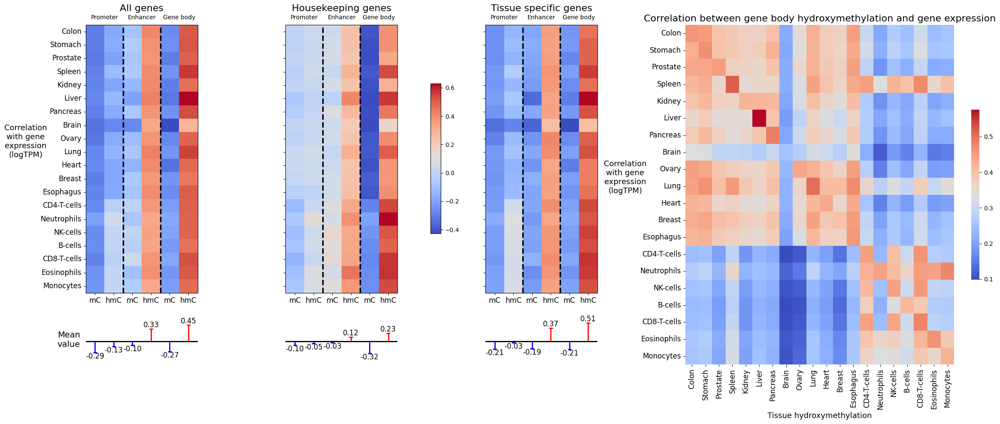

In [80]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import matplotlib.gridspec as gridspec
from matplotlib.colors import Normalize
from matplotlib.cm import ScalarMappable

# Create figure with GridSpec layout
fig = plt.figure(figsize=(24, 10))  # Adjust the size to fit your display
# Define a GridSpec with 2 rows: one for heatmaps and one for mean value plots
gs = gridspec.GridSpec(2, 4, height_ratios=[5, 1], width_ratios=[1, 1, 1, 3])

xlabel_features = [display_feature_dict[feature] for feature in epigenetic_features]




# Ensure consistent colorbar scale
vmin = min(np.min(all_gene_pearson_corrs), np.min(housekeeping_pearson_corrs), np.min(tissue_specific_pearson_corrs), np.min(correlation_matrix))
vmax = max(np.max(all_gene_pearson_corrs), np.max(housekeeping_pearson_corrs), np.max(tissue_specific_pearson_corrs), np.max(correlation_matrix))


# Function to plot a heatmap
def plot_heatmap(ax, data, title, yticklabels=True,cbar=False,ylabel=False):
    sns.heatmap(data, annot=False, cmap="coolwarm", cbar=False, ax=ax)
#     sns.heatmap(data, annot=False, vmin=vmin, vmax=vmax,cmap="coolwarm", cbar=cbar,cbar_kws={"shrink": 0.5}, ax=ax)
    

    ax.set_title(title,fontsize=16)
    ax.set_xticklabels(xlabel_features, rotation=90, ha='center')
    if yticklabels:
        ax.set_yticklabels(tissues, rotation=0)
    else:
        ax.set_yticklabels([])
        
    bottom_labels = ['mC','hmC']*3
    ax.set_xticklabels(bottom_labels,rotation=0)
    if ylabel:
#         ax.set_ylabel('Gene\nexpression\n(logTPM)',rotation=0,fontsize=13)
        ax.set_ylabel('Correlation\nwith gene\nexpression\n(logTPM)',rotation=0,fontsize=13,labelpad=25)

#     for i in range(1, len(xlabel_features), 2):
    for i in [2,4]:
        ax.axvline(i, color='k', linewidth=2.5,linestyle="--")
#         ax.axvline(i - 0.5, color='gray', linewidth=0.5)


    # Calculate the center positions for the top labels
    n_labels = 3  # Number of labels for 'Promoter', 'Enhancer', 'Gene body'
    ax_divisions = data.shape[1]  # Number of divisions on the x-axis
    step = ax_divisions / n_labels  # Step size to find center positions
    center_positions = [(0.5 * step) + (i * step) for i in range(n_labels)]

    
    
    toplabels = ['Promoter','Enhancer','Gene body']
    top_ax = ax.twiny()  # Create a twin axis sharing the same y-axis
#     top_ax.set_xticks([1,2,3])
#     top_ax.set_xticks([0.5,1.5,2.5])
#     top_ax.set_xticks([0.33,1.0,1.5])
#     top_ax.set_xticks(center_positions)

    top_ax.set_xlim(ax.get_xlim())  # Ensure the top axis has the same limits as the heatmap
    top_ax.set_xticks(center_positions)
    top_ax.set_xticklabels(['Promoter', 'Enhancer', 'Gene body'], rotation=0, ha='center',fontsize=10)
    top_ax.tick_params(bottom=False, top=False)  # Remove ticks from the top axis


#     top_ax.set_xticklabels(toplabels, rotation=0, ha='center')
#     top_ax.tick_params(bottom=False)  # Remove bottom ticks from the top axis


# def plot_heatmap(ax, data, title, yticklabels=True, cbar=False):
#     sns.heatmap(data, annot=False, cmap="coolwarm", cbar=cbar, ax=ax)

#     ax.set_title(title)
#     # Set bottom tick labels if yticklabels is True
#     if yticklabels:
#         ax.set_xticklabels(xlabel_features, rotation=90, ha='center')
#     else:
#         ax.set_xticklabels([], rotation=90, ha='center')  # Clear the bottom labels

#     # Calculate the center positions for the top labels
#     n_labels = 3  # Number of labels for 'Promoter', 'Enhancer', 'Gene body'
#     ax_divisions = data.shape[1]  # Number of divisions on the x-axis
#     step = ax_divisions / n_labels  # Step size to find center positions
#     center_positions = [(0.5 * step) + (i * step) for i in range(n_labels)]

#     # Create a twin axis sharing the same y-axis for top labels
#     top_ax = ax.twiny()
#     top_ax.set_xlim(ax.get_xlim())  # Ensure the top axis has the same limits as the heatmap
#     top_ax.set_xticks(center_positions)
#     top_ax.set_xticklabels(['Promoter', 'Enhancer', 'Gene body'], rotation=0, ha='center')
#     top_ax.tick_params(bottom=False, top=False)  # Remove ticks from the top axis

#     # Add vertical dashed lines to separate the categories
#     for i in center_positions[1:]:  # Skip the first line as it's at the edge
#         ax.axvline(i, color='k', linewidth=2.5, linestyle="--")
    
    
    



# Function to plot mean value lines centered in the subplot
def plot_mean_values(ax, data, xlabels,ylabel=False):
    mean_values = np.mean(data, axis=0)
    x_positions = np.arange(len(mean_values))  # X positions for each line
    
    # Determine consistent y-axis limits based on all mean values
    all_means = np.concatenate((np.mean(all_gene_pearson_corrs, axis=0),
                                np.mean(housekeeping_pearson_corrs, axis=0),
                                np.mean(tissue_specific_pearson_corrs, axis=0)))
#     y_min, y_max = min(all_means), max(all_means)
    y_min, y_max = -0.5, 0.7
    buffer = (y_max - y_min) * 0.1  # Add a 10% buffer to the range
    ax.set_ylim(y_min - buffer, y_max + buffer)

    # Drawing a horizontal grid line at 0
    ax.axhline(0, color='black', linewidth=2, linestyle='-')

    # Plotting vertical lines centered in the subplot
    for x, mean in zip(x_positions, mean_values):
        color = 'red' if mean > 0 else 'blue'
        ax.vlines(x, 0, mean, color=color, linewidth=2)
        ax.hlines(mean, x - 0.1, x + 0.1, color=color, lw=2)  # Small horizontal line at the end

        # Annotating the mean value
        ax.text(x, mean, f'{mean:.2f}', ha='center', va='bottom' if mean >= 0 else 'top', fontsize=12,weight='normal')

    # Setting the grid
    ax.yaxis.grid(True, linestyle='--', linewidth=0.5, color='grey')
    ax.set_axisbelow(True)  # Ensure grid is below the plot lines

    ax.set_xlim(-0.5, len(mean_values) - 0.5)  # Set x limits to center the lines
#     ax.set_xticks(x_positions)
    ax.set_xticks([])
    ax.set_xticklabels([])
#     ax.set_xticklabels(xlabels, rotation=90, ha='center')
    ax.set_yticks([])
    if ylabel:
        ax_means.set_ylabel("Mean\nvalue",rotation=0,fontsize=14)
        ax.yaxis.set_label_coords(-0.15, 0.3)  # Adjust x position as necessary
    
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)


# Plot each heatmap and corresponding mean value panel
for i in range(3):
    ax_heatmap = fig.add_subplot(gs[0, i])
    plot_heatmap(ax_heatmap, all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs, "All genes" if i == 0 else "Housekeeping genes" if i == 1 else "Tissue specific genes", yticklabels=i==0, cbar=i==2,ylabel=i==0)
    ax_means = fig.add_subplot(gs[1, i])
    plot_mean_values(ax_means, all_gene_pearson_corrs if i == 0 else housekeeping_pearson_corrs if i == 1 else tissue_specific_pearson_corrs, xlabel_features, ylabel=i==0)

    ax_heatmap.tick_params(axis='both', which='major', labelsize=12)
    if i == 2:  # Only for the third heatmap
        # Define the color normalization for the colorbar
        norm = Normalize(vmin=vmin, vmax=vmax)
        # Create a ScalarMappable with the normalization and colormap
        sm = ScalarMappable(norm=norm, cmap="coolwarm")
        # Create a new axes for the colorbar to the right of the heatmaps
        cbar_ax = fig.add_axes([0.42, 0.45, 0.01, 0.35])  # Adjust as necessary
        # Add the colorbar
        plt.colorbar(sm, cax=cbar_ax)

    

# Plot the fourth heatmap
ax4 = fig.add_subplot(gs[:, 3])
df_subset = df.loc[df['gene'].isin(tissue_specific_genes)]
feature = epigenetic_features[-1]
correlation_matrix = calculate_feature_correlation(feature)  # Define this function or replace with correct calculations
sns.heatmap(correlation_matrix.T, 
            annot=False,  # Assuming you want annotations for this one
            cmap="coolwarm", 
            cbar_kws={"shrink": 0.5},
#             vmin=vmin, vmax=vmax,
            yticklabels=df_subset['tissue_x'].unique(), 
            xticklabels=df_subset['tissue_x'].unique(), ax=ax4)
ax4.set_title(f'Correlation between gene body hydroxymethylation and gene expression',fontsize=16)
# ax4.set_ylabel('Gene\nexpression\n(logTPM)',rotation=0,fontsize=13)
ax4.set_ylabel('Correlation\nwith gene\nexpression\n(logTPM)',rotation=0,fontsize=13,labelpad=25)
ax4.set_xlabel('Tissue hydroxymethylation',fontsize=13)
# ax4.set_ylabel('')
# ax4.set_xlabel('')
ax4.tick_params(axis='both', which='major', labelsize=12)





# connector = gridspec.GridSpecFromSubplotSpec(1, 2, subplot_spec=gs[0, 2], wspace=0)
# ax_connector = fig.add_subplot(connector[1])
# ax_connector.set_xlim(0, 1)
# ax_connector.set_ylim(0, 1)
# ax_connector.axis('off')  # Turn off the axis

# # Draw lines to connect the plots
# # The coordinates here are figure fractions and may need tweaking
# connector_color = 'black'  # Change as per your color scheme
# ax_connector.annotate('', xy=(1, 0.5), xytext=(1, 0.5), xycoords='axes fraction', 
#                       textcoords='axes fraction', arrowprops=dict(arrowstyle="-", color=connector_color))
# ax_connector.annotate('', xy=(1, 0.5), xytext=(1, 0.3), xycoords='axes fraction', 
#                       textcoords='axes fraction', arrowprops=dict(arrowstyle="->", color=connector_color))
# ax_connector.annotate('', xy=(1, 0.5), xytext=(1, 0.7), xycoords='axes fraction', 
#                       textcoords='axes fraction', arrowprops=dict(arrowstyle="->", color=connector_color))

# # Optionally, you can add text to describe the connection
# ax_connector.text(0.5, 0.55, 'Expanded View', ha='center', va='center', transform=ax_connector.transAxes, color=connector_color)


# Adjust the layout
plt.tight_layout()



fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/ge_predict/"

# plt.savefig(fig_savedir + "Feature_correlation.mC_hmC_logTPM.tissue_specific_housekeeping.thesis_clean.png",
#            dpi=300)

# Show the figure
plt.show()

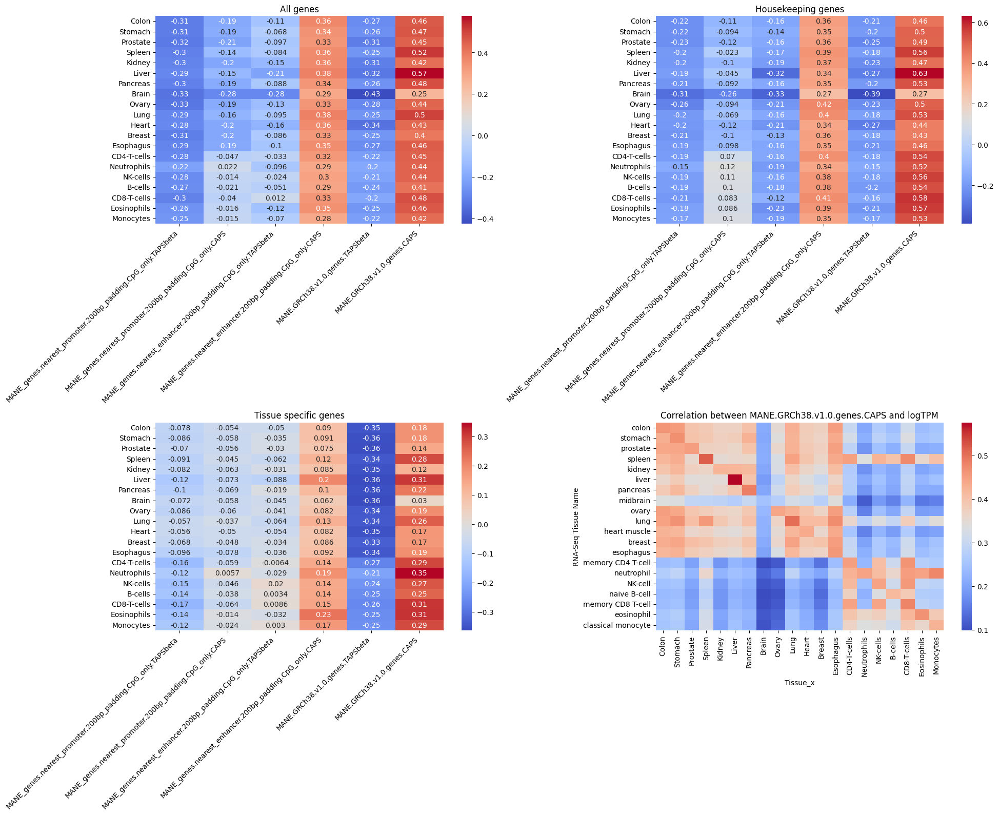

In [81]:
from scipy.stats import spearmanr, pearsonr
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming df, tissues, epigenetic_features, housekeeping_genes, and tissue_specific_genes are defined
tissues = df['tissue_x'].unique()

# Initialize correlation matrices
all_gene_pearson_corrs = np.zeros((len(tissues), len(epigenetic_features)))
housekeeping_pearson_corrs = np.zeros((len(tissues), len(epigenetic_features)))
tissue_specific_pearson_corrs = np.zeros((len(tissues), len(epigenetic_features)))

# Calculate correlations for all genes
for i, tissue in enumerate(tissues):
    tissue_df = df[df['tissue_x'] == tissue]
    for j, feature in enumerate(epigenetic_features):
        all_gene_pearson_corrs[i, j] = pearsonr(tissue_df[feature], tissue_df['log_tpm'])[0]

# Calculate correlations for housekeeping genes
for i, tissue in enumerate(tissues):
    tissue_df = df[(df['tissue_x'] == tissue) & df['gene'].isin(housekeeping_genes)]
    for j, feature in enumerate(epigenetic_features):
        housekeeping_pearson_corrs[i, j] = pearsonr(tissue_df[feature], tissue_df['log_tpm'])[0]

# Calculate correlations for tissue-specific genes
for i, tissue in enumerate(tissues):
    tissue_df = df[(df['tissue_x'] == tissue) & df['gene'].isin(tissue_specific_genes)]
    for j, feature in enumerate(epigenetic_features):
        tissue_specific_pearson_corrs[i, j] = pearsonr(tissue_df[feature], tissue_df['log_tpm'])[0]

# Create figure with 3 subplots, one for each gene category
fig, axes = plt.subplots(2, 2, figsize=(20, 16), sharex=False)

# Set the same color scheme for all heatmaps
cmap = "coolwarm"


ax = axes[0,0]
# Plot heatmap for all genes
sns.heatmap(all_gene_pearson_corrs, annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features, cmap=cmap)
ax.set_title("All genes")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

ax = axes[1,0]
# Plot heatmap for all genes
sns.heatmap(housekeeping_pearson_corrs, annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features, cmap=cmap)
ax.set_title("Tissue specific genes")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")

ax = axes[0,1]
# Plot heatmap for all genes
sns.heatmap(tissue_specific_pearson_corrs, annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features, cmap=cmap)
ax.set_title("Housekeeping genes")
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")




ax = axes[1,1]
# # Plot heatmap for all genes
# sns.heatmap(tissue_specific_pearson_corrs, annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features, cmap=cmap)
# ax.set_title("Housekeeping genes")
# ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha="right")



df_subset = df.loc[df['gene'].isin(tissue_specific_genes)]
feature = epigenetic_features[-1]
correlation_matrix = calculate_feature_correlation(feature)
sns.heatmap(correlation_matrix.T, 
            annot=False, 
            cmap="coolwarm", 
            yticklabels=df_subset['rna_seq_tissue_name'].unique(), 
            xticklabels=df_subset['tissue_x'].unique(), ax=ax)
ax.set_title(f'Correlation between {feature} and logTPM')
ax.set_ylabel('RNA-Seq Tissue Name')
ax.set_xlabel('Tissue_x')



# Hide x-tick labels for the middle plot
# ax.set_xticklabels([])

# Adjust the layout
plt.tight_layout()

# Show the figure
plt.show()


In [82]:
epigenetic_features

['MANE_genes.nearest_promoter.200bp_padding.CpG_only.TAPSbeta',
 'MANE_genes.nearest_promoter.200bp_padding.CpG_only.CAPS',
 'MANE_genes.nearest_enhancer.200bp_padding.CpG_only.TAPSbeta',
 'MANE_genes.nearest_enhancer.200bp_padding.CpG_only.CAPS',
 'MANE.GRCh38.v1.0.genes.TAPSbeta',
 'MANE.GRCh38.v1.0.genes.CAPS']

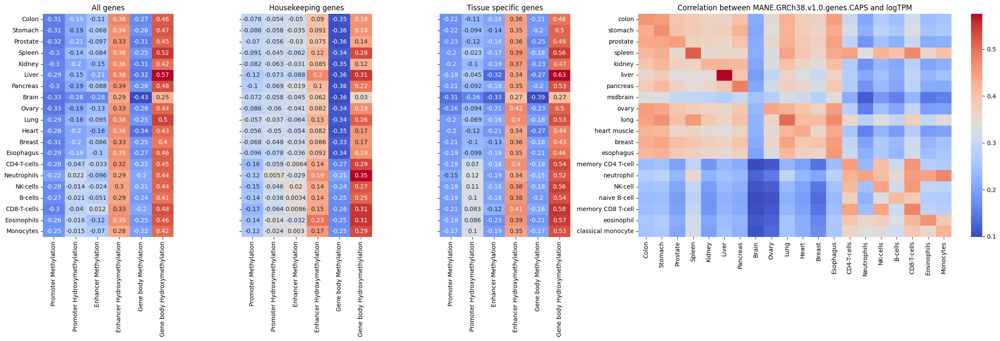

In [83]:
# Create figure with GridSpec layout
fig = plt.figure(figsize=(24, 8))  # You may need to adjust the size to fit your display
gs = gridspec.GridSpec(1, 4, width_ratios=[1, 1, 1, 3])

xlabel_features = [display_feature_dict[feature] for feature in epigenetic_features]

# Function to plot a heatmap without annotations
def plot_heatmap(ax, data, title,include_ticklabels=False):
    sns.heatmap(data, annot=True, cmap="coolwarm", cbar=False, ax=ax)
    ax.set_title(title)
    
    if include_ticklabels:
        ax.set_yticklabels(tissues,rotation=0)
    else:
        ax.set_yticklabels([])
    
    ax.set_xticklabels(xlabel_features,rotation=90)


# Plot each heatmap
plot_heatmap(plt.subplot(gs[0, 0]), all_gene_pearson_corrs,"All genes",include_ticklabels=True)
plot_heatmap(plt.subplot(gs[0, 1]), housekeeping_pearson_corrs, "Housekeeping genes")
plot_heatmap(plt.subplot(gs[0, 2]), tissue_specific_pearson_corrs, "Tissue specific genes")

# Plot the fourth heatmap
ax4 = plt.subplot(gs[0, 3])
df_subset = df.loc[df['gene'].isin(tissue_specific_genes)]
feature = epigenetic_features[-1]
correlation_matrix = calculate_feature_correlation(feature)  # Define this function or replace with correct calculations
sns.heatmap(correlation_matrix.T, 
            annot=False,  # Assuming you want annotations for this one
            cmap="coolwarm", 
            yticklabels=df_subset['rna_seq_tissue_name'].unique(), 
            xticklabels=df_subset['tissue_x'].unique(), ax=ax4)
ax4.set_title(f'Correlation between {feature} and logTPM')
# ax4.set_ylabel('RNA-Seq Tissue Name')
ax4.set_ylabel('')
ax4.set_xlabel('')

# Adjust the layout
plt.tight_layout()

# Show the figure
plt.show()

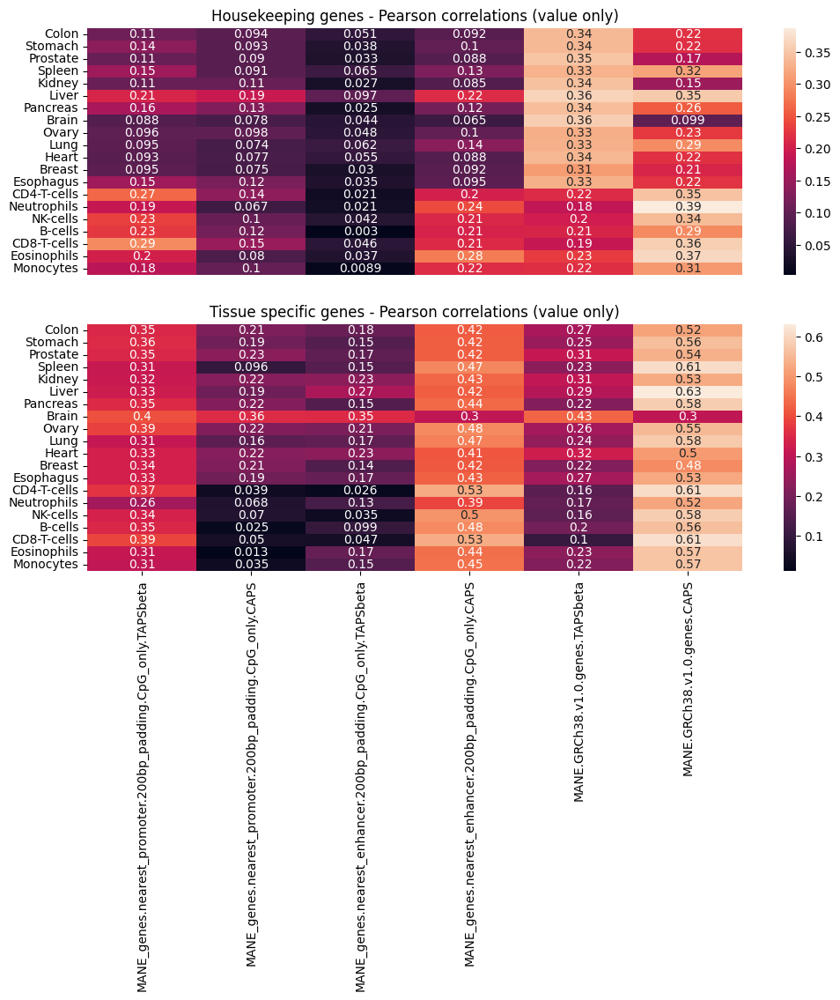

In [84]:
from scipy.stats import spearmanr, pearsonr

value_only = True


tissues = df['tissue_x'].unique()

# Initialize correlation matrices
pearson_corrs = np.zeros((len(tissues), len(epigenetic_features)))
spearman_corrs = np.zeros((len(tissues), len(epigenetic_features)))


### Housekeeping genes
fig, axes = plt.subplots(2, 1, figsize=(12,8))
for i, tissue in enumerate(tissues):
    tissue_df = df[df['tissue_x'] == tissue]
    tissue_df = tissue_df.loc[tissue_df['gene'].isin(housekeeping_genes)]
    for j, feature in enumerate(epigenetic_features):
        # Compute correlations
        pearson_corrs[i, j] = pearsonr(tissue_df[feature], tissue_df['log_tpm'])[0]
        spearman_corrs[i, j] = spearmanr(tissue_df[feature], tissue_df['log_tpm'])[0]


ax = axes[0]
# Plot heatmaps
if value_only:
    sns.heatmap(np.abs(spearman_corrs), annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features)
    ax.set_title("Housekeeping genes - Pearson correlations (value only)")
else:
    sns.heatmap(spearman_corrs, annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features)
    ax.set_title("Housekeeping genes - Pearson correlations")


ax.set_xticks([])

    
    
### Tissue specific genes
for i, tissue in enumerate(tissues):
    tissue_df = df[df['tissue_x'] == tissue]
    tissue_df = tissue_df.loc[tissue_df['gene'].isin(tissue_specific_genes)]
    for j, feature in enumerate(epigenetic_features):
        # Compute correlations
        pearson_corrs[i, j] = pearsonr(tissue_df[feature], tissue_df['log_tpm'])[0]
        spearman_corrs[i, j] = spearmanr(tissue_df[feature], tissue_df['log_tpm'])[0]


ax = axes[1]
# Plot heatmaps
if value_only:
    sns.heatmap(np.abs(spearman_corrs), annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features)
    ax.set_title("Tissue specific genes - Pearson correlations (value only)")
else:
    sns.heatmap(spearman_corrs, annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features)
    ax.set_title("Tissue specific genes - Pearson correlations")
    
    
    

# fig, ax = plt.subplots(1, 1, figsize=(12,8))

# # Plot heatmaps
# if value_only:
#     sns.heatmap(np.abs(spearman_corrs), annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features)
#     ax.set_title("Spearman correlations (value only)")
# else:
#     sns.heatmap(spearman_corrs, annot=True, ax=ax, yticklabels=tissues, xticklabels=epigenetic_features)
#     ax.set_title("Spearman correlations")

# # plt.tight_layout()
# # plt.show()


### Tissue specific correlation

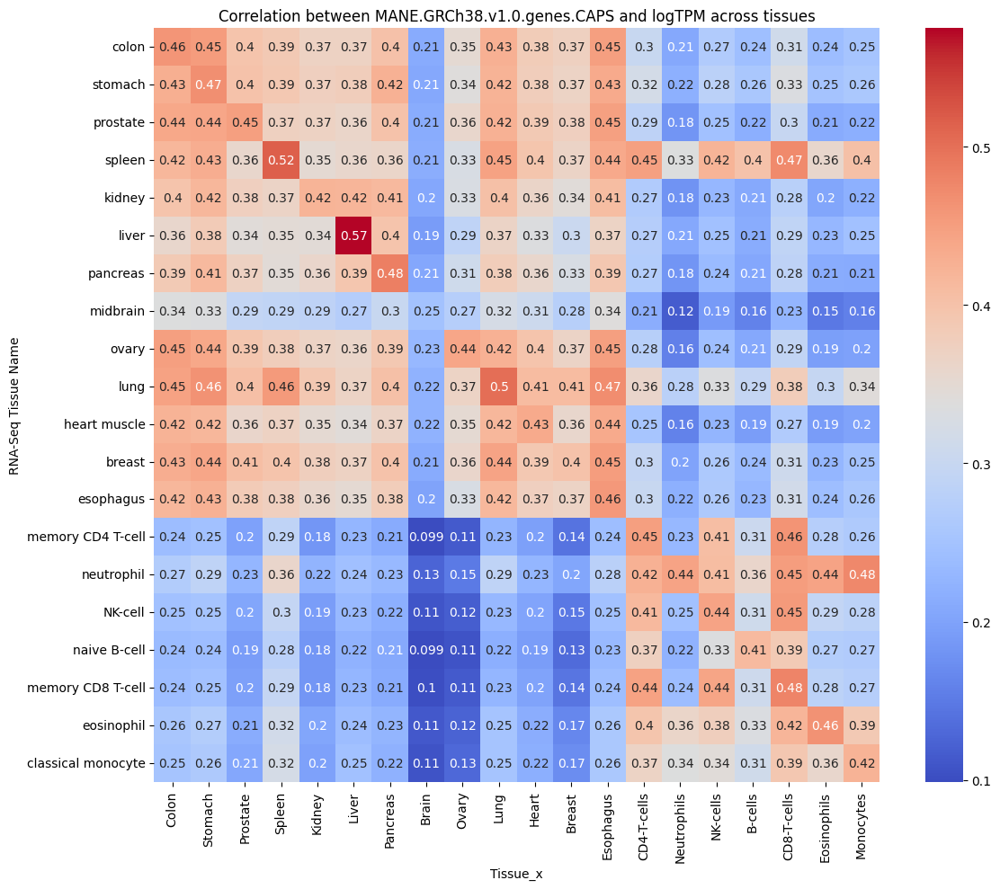

In [85]:
def calculate_feature_correlation(feature):
    """
    Calculate correlation between a given epigenetic feature and logTPM for each tissue.
    
    Args:
    - feature (str): Epigenetic feature column name
    
    Returns:
    - numpy array: Matrix of correlations
    """
    # Get unique tissues from the subset
    tissue_x_values = df_subset['tissue_x'].unique()
    rna_seq_tissue_values = df_subset['rna_seq_tissue_name'].unique()
    
    # Initialize matrix to store correlations
    correlation_matrix = np.zeros((len(tissue_x_values), len(rna_seq_tissue_values)))
    
    # Calculate correlations
    for i, tissue_x in enumerate(tissue_x_values):
        for j, rna_tissue in enumerate(rna_seq_tissue_values):
            feature_values = df_subset[df_subset['tissue_x'] == tissue_x][feature].values
            log_tpm_values = df_subset[df_subset['rna_seq_tissue_name'] == rna_tissue]['log_tpm'].values
            if len(feature_values) > 1 and len(log_tpm_values) > 1:  # Ensure we have more than one data point
                correlation_matrix[i, j] = np.corrcoef(feature_values, log_tpm_values)[0, 1]
    
    return correlation_matrix

df_subset =df
# Generate correlation matrix for the example feature
# feature = 'MANE_genes.nearest_promoter.200bp_padding.TAPSbeta'
# feature = 'MANE.GRCh38.v1.0.genes.TAPSbeta'
feature = 'MANE.GRCh38.v1.0.genes.CAPS'

correlation_matrix_feature = calculate_feature_correlation(feature)

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix_feature.T, annot=True, cmap="coolwarm", 
            yticklabels=df_subset['rna_seq_tissue_name'].unique(), 
            xticklabels=df_subset['tissue_x'].unique())
plt.title(f'Correlation between {feature} and logTPM across tissues')
plt.ylabel('RNA-Seq Tissue Name')
plt.xlabel('Tissue_x')
plt.tight_layout()
plt.show()

### TODO: Could add in CGI_shore and exon1 to this comparison

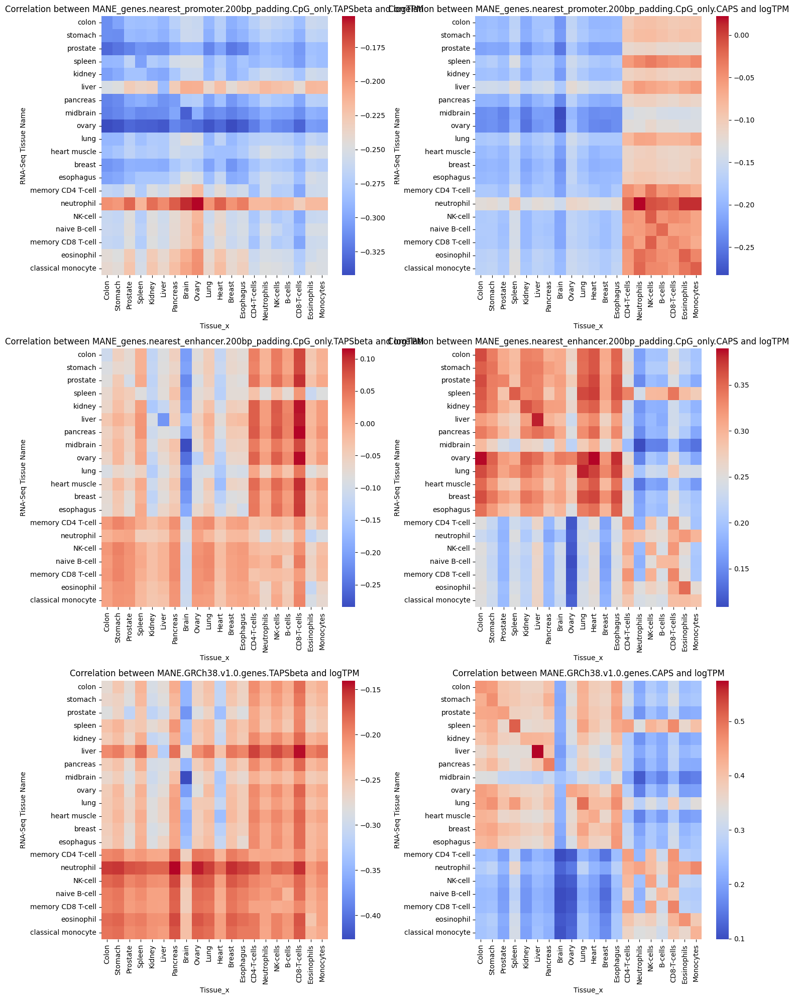

In [86]:

# Initialize a figure with the specified layout
fig, axes = plt.subplots(3, 2, figsize=(15, 20))

# Plot each heatmap in the appropriate subplot
for i, feature in enumerate(epigenetic_features):
    ax = axes[i // 2, i % 2]
    correlation_matrix = calculate_feature_correlation(feature)
    sns.heatmap(correlation_matrix.T, 
                annot=False, 
                cmap="coolwarm", 
                yticklabels=df_subset['rna_seq_tissue_name'].unique(), 
                xticklabels=df_subset['tissue_x'].unique(), ax=ax)
    ax.set_title(f'Correlation between {feature} and logTPM')
    ax.set_ylabel('RNA-Seq Tissue Name')
    ax.set_xlabel('Tissue_x')

plt.tight_layout()
plt.show()

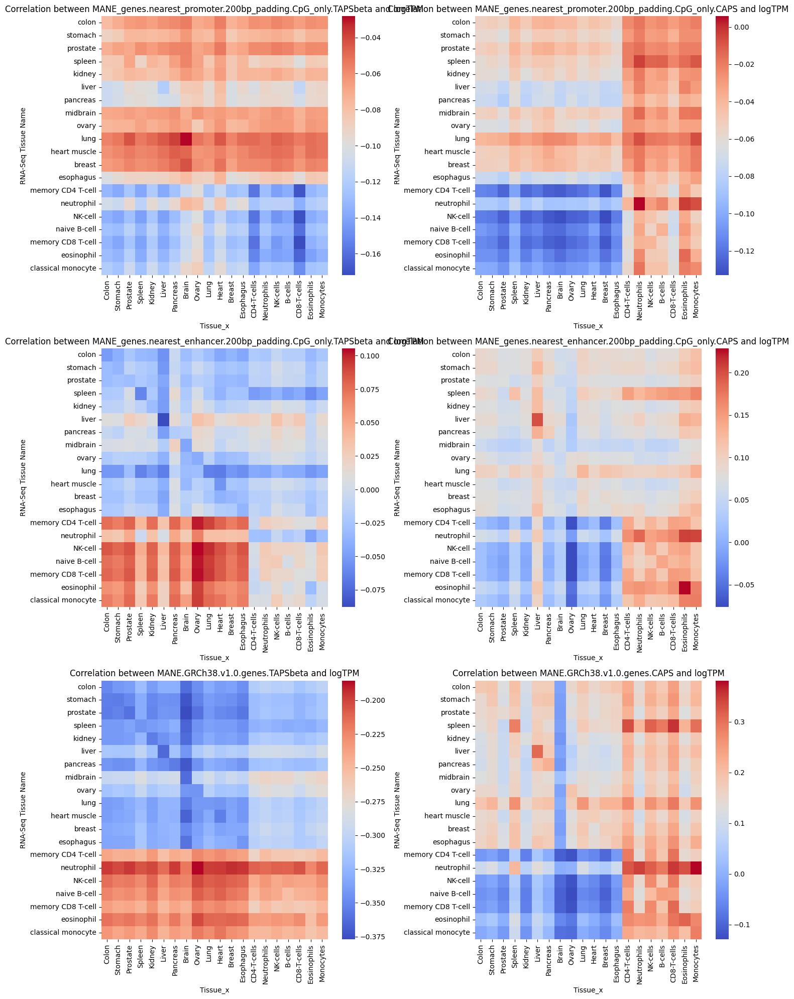

In [87]:
df_subset = df.loc[df['gene'].isin(housekeeping_genes)]

# Generate correlation matrix for the example feature
# feature = 'MANE_genes.nearest_promoter.200bp_padding.TAPSbeta'
# feature = 'MANE.GRCh38.v1.0.genes.TAPSbeta'

# Initialize a figure with the specified layout
fig, axes = plt.subplots(3, 2, figsize=(15, 20))

# Plot each heatmap in the appropriate subplot
for i, feature in enumerate(epigenetic_features):
    ax = axes[i // 2, i % 2]
    correlation_matrix = calculate_feature_correlation(feature)
    sns.heatmap(correlation_matrix.T, 
                annot=False, 
                cmap="coolwarm", 
                yticklabels=df_subset['rna_seq_tissue_name'].unique(), 
                xticklabels=df_subset['tissue_x'].unique(), ax=ax)
    ax.set_title(f'Correlation between {feature} and logTPM')
    ax.set_ylabel('RNA-Seq Tissue Name')
    ax.set_xlabel('Tissue_x')

plt.tight_layout()
plt.show()

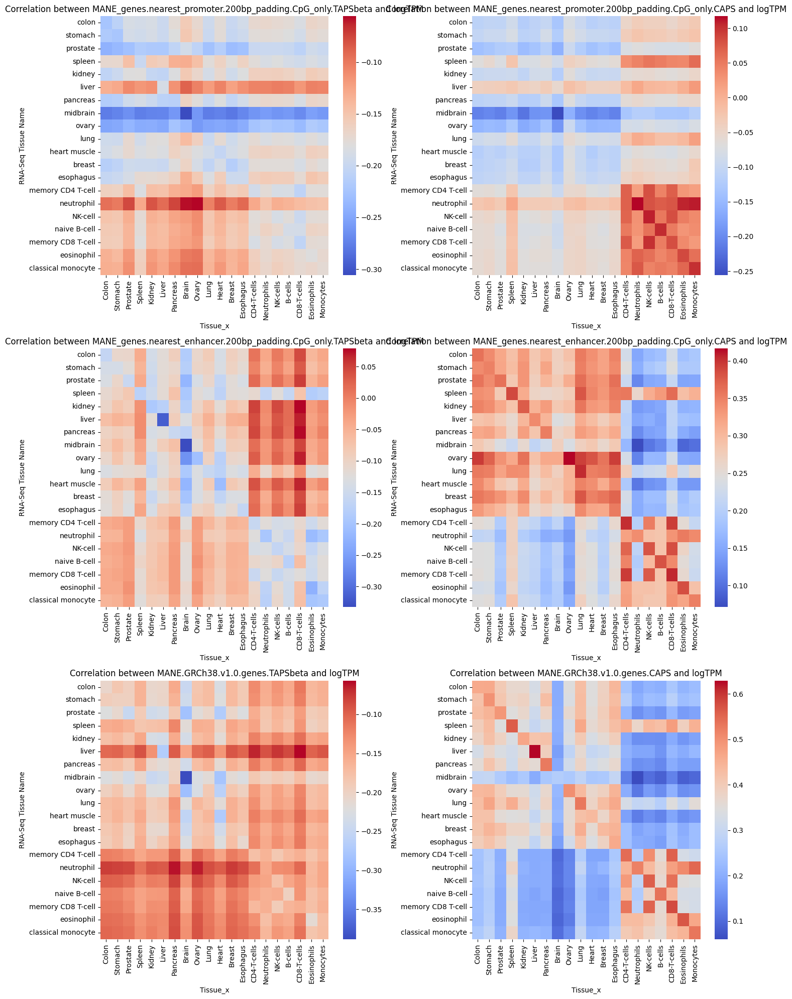

In [88]:
df_subset = df.loc[df['gene'].isin(tissue_specific_genes)]

# Generate correlation matrix for the example feature
# feature = 'MANE_genes.nearest_promoter.200bp_padding.TAPSbeta'
# feature = 'MANE.GRCh38.v1.0.genes.TAPSbeta'
# epigenetic_features = [
#     'MANE_genes.nearest_promoter.200bp_padding.TAPSbeta',
#     'MANE_genes.nearest_promoter.200bp_padding.CAPS',
#     'MANE_genes.nearest_enhancer.200bp_padding.TAPSbeta',
#     'MANE_genes.nearest_enhancer.200bp_padding.CAPS',
#     'MANE.GRCh38.v1.0.genes.TAPSbeta',
#     'MANE.GRCh38.v1.0.genes.CAPS'
# ]

# Initialize a figure with the specified layout
fig, axes = plt.subplots(3, 2, figsize=(15, 20))

# Plot each heatmap in the appropriate subplot
for i, feature in enumerate(epigenetic_features):
    ax = axes[i // 2, i % 2]
    correlation_matrix = calculate_feature_correlation(feature)
    sns.heatmap(correlation_matrix.T, 
                annot=False, 
                cmap="coolwarm", 
                yticklabels=df_subset['rna_seq_tissue_name'].unique(), 
                xticklabels=df_subset['tissue_x'].unique(), ax=ax)
    ax.set_title(f'Correlation between {feature} and logTPM')
    ax.set_ylabel('RNA-Seq Tissue Name')
    ax.set_xlabel('Tissue_x')

plt.tight_layout()
plt.show()

### Illustration of 1kb data

In [35]:
model_name = "1kb_bins.leave_one_out.RF2."
save=True
load=False
normalise=False
save_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/predict_ge/1kb_model/"
tissues = [u for u in healthy_tissue_types if u not in ['Bone-Marrow','Thymus']]
tissue_mapping = {
    "Erythroblasts": "CD34-erythroblasts",
    "Megakaryocytes": "CD34-megakaryocytes"
}
tissues = [tissue_mapping.get(tissue, tissue) for tissue in tissues]


rna_seq_num1 = 2
rna_seq_num2 = 5
rna_seq_filepaths = ["/well/ludwig/users/qwb368/public_data/GTEx/TPM/GTEx_Analysis_2017-06-05_v8_RNASeQCv1.1.9_gene_median_tpm.gct",
                    "/well/ludwig/users/qwb368/public_data/HPA/rna_tissue_hpa_formatted.tsv",
                    "/well/ludwig/users/qwb368/public_data/HPA_GTEx_consensus/rna_tissue_consensus_formatted.tsv",
                    "/well/ludwig/users/qwb368/public_data/FANTOM/rna_tissue_fantom_formatted.tsv",
                    "/well/ludwig/users/qwb368/public_data/hmC-Seal/GSE144530_RNAseq_RPKM_RefSeq_formatted.tsv",
                    "/well/ludwig/users/qwb368/public_data/HPA_immune/rna_immune_cell_formatted.tsv",
                    "/well/ludwig/users/qwb368/public_data/Monaco_immune/rna_immune_cell_monaco_formatted.tsv",
                    "/well/ludwig/users/qwb368/public_data/Schmiedel_immune/rna_immune_cell_schmiedel_formatted.tsv"]
rna_seq_filepath1 = rna_seq_filepaths[rna_seq_num1]
rna_seq_filepath2 = rna_seq_filepaths[rna_seq_num2]
rna_seq_filename1 = re.sub('\..*','', re.sub('/.*/', "", rna_seq_filepath1))
rna_seq_filename2 = re.sub('\..*','', re.sub('/.*/', "", rna_seq_filepath2))
rna_seq1 = pd.read_csv(rna_seq_filepath1,sep='\t')
rna_seq2 = pd.read_csv(rna_seq_filepath2,sep='\t')
rna_seq = pd.merge(rna_seq1, rna_seq2, on=['Name','Description']) ### bc those 2 datasets don't have version numbers



if "." in rna_seq.loc[0,"Name"]:
    rna_seq[['core_gene','version']] = rna_seq['Name'].str.split('.',expand=True)
else:
    rna_seq['core_gene'] = rna_seq['Name']
    rna_seq['version'] = 0
rna_seq = rna_seq.set_index('core_gene')
rna_seq






# tissue_names = [u.lower() for u in tissue_id_map.keys()]
tissue_names = list(tissue_id_map.keys())
rna_seq_df = rna_seq
rna_seq_tissues = list(rna_seq_df.columns)


def clean_string(s):
    return s.split('-')[0]  # Split on hyphens and take the first part

# Create a lowercased version of match_tissue_list for comparison
match_tissue_list_lower = [clean_string(tissue.lower()) for tissue in rna_seq_tissues]

mapping = {}

for tissue in tissue_names:
    tissue_clean = clean_string(tissue.lower())
    for match in match_tissue_list_lower:
        if tissue_clean in match:
            mapping[tissue] = match
            break  # Found a match, go to the next tissue
        else:
            mapping[tissue] = ""  # Default case if no match is found

# print(mapping)



mapping['Neutrophils'] = 'neutrophil'
mapping['B-cells'] =  'naive B-cell' # 'memory B-cell'
mapping['Eosinophils'] = 'eosinophil'
mapping['Monocytes'] = 'classical monocyte'
mapping['NK-cells'] = 'NK-cell'
mapping['CD4-T-cells'] = 'memory CD4 T-cell'
mapping['CD8-T-cells'] = 'memory CD8 T-cell'


# Melt the RNA-seq data to long format
rna_seq_data_long = rna_seq.reset_index().melt(id_vars=['core_gene', 'Name', 'Description'], var_name='tissue', value_name='TPM')


rna_seq_data_long['logTPM'] = np.log1p(rna_seq_data_long['TPM'])



    # Calculate the mean TPM for each tissue
tissue_means = rna_seq_data_long.groupby('tissue')['TPM'].mean()

# Normalize the TPM values by dividing by the tissue mean
rna_seq_data_long['Normalized_TPM'] = rna_seq_data_long.apply(lambda row: row['TPM'] / tissue_means[row['tissue']], axis=1)






original_mlml_file = "/gpfs3/well/ludwig/users/cfo155/tissueMap/methcalls/aggregate_tissue/tissue_merged_common_cpg.mincov3.all_meth.txt"
mlml_colnames = list(pd.read_csv(original_mlml_file,sep="\t",nrows=1).columns)
mlml_colnames.insert(2, 'END')

bedfile_colnames = ["chr", "start", "end", "gene_id", "gene_name", "level", "strand"]

# mlml_file = "/well/ludwig/users/dyp502/tissue_atlas_v3/predict_ge/data/MLML.tissue_merged_common_cpg.mincov3.all_meth.gencode.protein_coding_genes.10kb_upstream_downstream.with_header.bed"
mlml_file = "/well/ludwig/users/dyp502/tissue_atlas_v3/predict_ge/data/MLML.tissue_merged_common_cpg.mincov3.all_meth.gencode.protein_coding_genes.10kb_upstream_downstream.bed"
names = bedfile_colnames + mlml_colnames
mlml = pd.read_csv(mlml_file,
                sep='\t',
                  nrows=100000,
                names=names
                )

epigenetic_cols = names[10:]

### Bin into 1kb bins
mlml['gene_id'] = mlml['gene_id'].str.split('.').str[0]

# Calculate the bin for each methylation site
# data_sample=mlml
mlml['bin'] = ((mlml['START'] - mlml['start']) // 1000).astype(int)

if normalise:
    mlml[epigenetic_cols] = mlml[epigenetic_cols]/ mlml[epigenetic_cols].mean()

# Group the data by gene_id and bin, then calculate the mean for each group
# grouped_data = data_sample.groupby(['gene_id', 'bin'])[epigenetic_cols].mean().reset_index()
grouped_data = mlml.groupby(['gene_id', 'bin']).agg({
    'chr': 'first',
    'start': 'first',
    'end': 'first',
    'gene_name': 'first',
#     'level': 'first',
    'strand': 'first',
    'CHR': 'first',
    'START': 'first',
    'END': 'first',
    **{col: 'mean' for col in epigenetic_cols}
}).reset_index()


# Calculate the start and end coordinates of each bin
grouped_data['bin_start'] = grouped_data['start'] + grouped_data['bin'] * 1000
grouped_data['bin_end'] = grouped_data['bin_start'] + 1000


In [37]:
selected_gene = "ENSG00000248333"
# selected_gene = "ENSG00000162571"
df = grouped_data.loc[grouped_data['gene_id']==selected_gene]
remove_cols = [col for col in df.columns if any(s in col for s in ['CD34'])]
df.drop(remove_cols, axis=1, inplace=True)

strand = df['strand'].iloc[0]


tissues = tissues[0:-2]
# Extracting epigenetic data
mC_data = df[[f"{tissue}_mC" for tissue in tissues]].to_numpy()
hmC_data = df[[f"{tissue}_hmC" for tissue in tissues]].to_numpy()
umC_data = df[[f"{tissue}_umC" for tissue in tissues]].to_numpy()


rna_seq_tissues = [u for u in [mapping.get(u,'') for u in tissues] if u]
rna_seq_subset = rna_seq_data_long[(rna_seq_data_long['Name'] == selected_gene) & (rna_seq_data_long['tissue'].isin(rna_seq_tissues))]
rna_seq_subset['tissue'] = pd.Categorical(rna_seq_subset['tissue'], categories=rna_seq_tissues, ordered=True)#.sor('tissue')
rna_seq_subset.sort_values(by='tissue',inplace=True)


# Extracting logTPM data for the gene of interest
logTPM = rna_seq_subset['logTPM'].to_numpy().reshape(20,1)

In [38]:
df

,gene_id,bin,chr,start,end,gene_name,strand,CHR,START,END,...,Spleen_hmC,Spleen_umC,Stomach-Tumour_mC,Stomach-Tumour_hmC,Stomach-Tumour_umC,Stomach_mC,Stomach_hmC,Stomach_umC,bin_start,bin_end
3940,ENSG00000248333,0,chr1,1649012,1669012,CDK11B,-,chr1,1649046,1649047,...,3.221892,7.137568,84.913243,2.374595,12.712432,91.034865,3.361081,5.603784,1649012,1650012
3941,ENSG00000248333,1,chr1,1649012,1669012,CDK11B,-,chr1,1650038,1650039,...,3.282500,9.695312,86.860938,2.359688,10.779375,87.689375,4.796875,7.513438,1650012,1651012
3942,ENSG00000248333,2,chr1,1649012,1669012,CDK11B,-,chr1,1651095,1651096,...,3.845500,5.238000,86.122000,2.363000,11.515500,88.861500,4.957000,6.180500,1651012,1652012
3943,ENSG00000248333,3,chr1,1649012,1669012,CDK11B,-,chr1,1652047,1652048,...,3.971786,5.961071,88.495357,1.505357,9.998929,91.570000,2.618571,5.811429,1652012,1653012
3944,ENSG00000248333,4,chr1,1649012,1669012,CDK11B,-,chr1,1653013,1653014,...,0.827143,6.906190,90.244762,0.448095,9.307619,93.183810,1.607143,5.207619,1653012,1654012
3945,ENSG00000248333,5,chr1,1649012,1669012,CDK11B,-,chr1,1654052,1654053,...,1.818214,9.145357,87.259286,0.632143,12.110357,87.464286,2.013929,10.521071,1654012,1655012
3946,ENSG00000248333,6,chr1,1649012,1669012,CDK11B,-,chr1,1655032,1655033,...,1.720500,4.373500,72.642000,0.729000,26.628500,69.862000,2.593000,27.547500,1655012,1656012
3947,ENSG00000248333,7,chr1,1649012,1669012,CDK11B,-,chr1,1656060,1656061,...,1.960000,7.210000,86.703333,1.390667,11.907333,84.984667,2.863333,12.152667,1656012,1657012
3948,ENSG00000248333,8,chr1,1649012,1669012,CDK11B,-,chr1,1657093,1657094,...,1.456364,17.635455,79.428636,0.710000,19.860909,81.073182,3.850000,15.078182,1657012,1658012
3949,ENSG00000248333,9,chr1,1649012,1669012,CDK11B,-,chr1,1658033,1658034,...,1.396027,84.336986,8.382055,0.734658,90.883014,11.466849,1.163699,87.368767,1658012,1659012


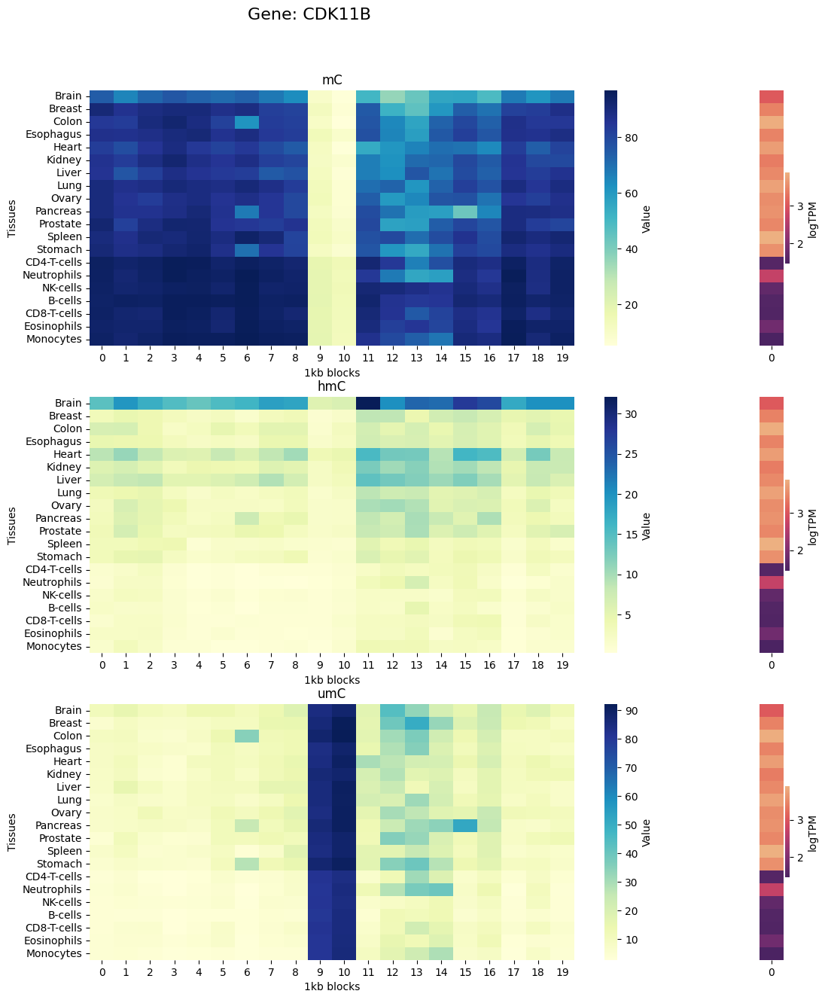

In [39]:


gene_name = df['gene_name'].iloc[0]

# Plotting the heatmaps

fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [20, 1]})

# fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [5, 1]})

sns.heatmap(mC_data.T, ax=axes[0, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
axes[0, 0].set_title('mC')
axes[0, 0].set_ylabel('Tissues')
axes[0, 0].set_xlabel('1kb blocks')

sns.heatmap(hmC_data.T, ax=axes[1, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
axes[1, 0].set_title('hmC')
axes[1, 0].set_ylabel('Tissues')
axes[1, 0].set_xlabel('1kb blocks')

sns.heatmap(umC_data.T, ax=axes[2, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
axes[2, 0].set_title('umC')
axes[2, 0].set_ylabel('Tissues')
axes[2, 0].set_xlabel('1kb blocks')


# fig.suptitle(f"Gene: {selected_gene}, Strand: {strand}",fontsize=16)
# fig.suptitle(f"Gene: {gene_name}", fontsize=16, ha='left')
fig.suptitle(f"Gene: {gene_name}", fontsize=16,
             ha='left', va='bottom',
             x=0.3,y=0.94
#              bbox={'x': 1.2, 'y': 1.05},
            )

# Secondary heatmap (logTPM values)
for i in range(3):
    sns.heatmap(logTPM, ax=axes[i, 1], cmap='flare_r', cbar_kws={'label': 'logTPM'}, yticklabels=tissues)
    axes[i, 1].set_yticks([])  # Hide y-ticks for logTPM plots
    axes[i, 1].set_ylabel('')  # Hide y-labels for logTPM plots
    
    
    
    

fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/ge_predict/"

# plt.savefig(fig_savedir + f"1kb.mC_hmC_umC_heatmap.{gene_name}.logTPM.thesis_clean.png",
#            dpi=300)


In [222]:




# # Plotting the heatmaps

# fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [20, 1]})

# # fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [5, 1]})

# sns.heatmap(mC_data.T, ax=axes[0, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
# axes[0, 0].set_title('mC')
# axes[0, 0].set_ylabel('Tissues')
# axes[0, 0].set_xlabel('1kb blocks')

# sns.heatmap(hmC_data.T, ax=axes[1, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
# axes[1, 0].set_title('hmC')
# axes[1, 0].set_ylabel('Tissues')
# axes[1, 0].set_xlabel('1kb blocks')

# sns.heatmap(umC_data.T, ax=axes[2, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
# axes[2, 0].set_title('umC')
# axes[2, 0].set_ylabel('Tissues')
# axes[2, 0].set_xlabel('1kb blocks')


# fig.suptitle(f"Gene: {selected_gene}, Strand: {strand}",fontsize=16)

# # Secondary heatmap (logTPM values)
# for i in range(3):
#     sns.heatmap(logTPM, ax=axes[i, 1], cmap='flare_r', cbar_kws={'label': 'logTPM'}, yticklabels=tissues)
#     axes[i, 1].set_yticks([])  # Hide y-ticks for logTPM plots
#     axes[i, 1].set_ylabel('')  # Hide y-labels for logTPM plots

### Replicate with new data

- where gene is binned proportionally

In [40]:
file_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/predict_ge/1kb_model/dl_model/"
# filename = "20kb_upstream_downstream_gene_equal_bins.tissue_specific.mlml_grouped_data.csv"
filename = "20kb_upstream_downstream_gene_equal_bins.mC_hmC_umC_grouped_data_before_normalisation.csv"
grouped_data = pd.read_csv(file_dir + filename,
                           sep='\t',
                          nrows=100000)

In [41]:

# gene_to_find = "CD37"
gene_to_find = "PLG"



# Read only the 'gene' column from the file
gene_column = pd.read_csv(file_dir + filename,
                           sep='\t',
                          usecols=['gene'])

# Find the indices where the gene is 'FLVCR1'
gene_indices = gene_column[gene_column['gene'] == gene_to_find].index.tolist()


specific_gene_grouped_data = pd.read_csv(file_dir + filename,
                                           sep='\t',
                                         skiprows=gene_indices[0],
                                         nrows=len(gene_indices),
                                         names=grouped_data.columns
                                        )

specific_gene_grouped_data.loc[specific_gene_grouped_data['gene']==gene_to_find]


,Unnamed: 0,chr,start,end,gene,feature,idx,Colon_mC,Colon_hmC,Colon_umC,...,Eosinophils_umC,Monocytes_mC,Monocytes_hmC,Monocytes_umC,Erythroblasts_mC,Erythroblasts_hmC,Erythroblasts_umC,Megakaryocytes_mC,Megakaryocytes_hmC,Megakaryocytes_umC
1,385615,chr6,160682193,160683193,PLG,tss,1,74.00,0.6250,25.00,...,17.500,88.250,0.41000,11.225,43.750,2.0000,54.25,59.5,2.550,38.0
3,385617,chr6,160683193,160684193,PLG,tss,2,73.00,1.0575,25.75,...,11.750,85.500,1.42750,13.025,51.750,3.4750,45.00,62.0,1.250,37.0
5,385619,chr6,160684193,160685193,PLG,tss,3,65.75,1.6325,32.75,...,20.500,81.250,0.24500,18.500,48.500,0.7500,50.50,65.0,0.265,34.5
6,385620,chr6,160685193,160686193,PLG,tss,4,71.75,1.3450,27.00,...,12.700,88.500,0.21250,11.100,62.500,0.3240,37.25,75.0,0.865,24.0
7,385621,chr6,160686193,160687193,PLG,tss,5,81.25,2.1350,17.00,...,13.250,88.000,0.73750,11.400,50.250,0.7300,49.25,67.5,0.495,32.5
8,385622,chr6,160687193,160688193,PLG,tss,6,66.50,2.1250,31.00,...,16.250,85.750,0.16250,14.250,43.000,1.6325,55.25,60.0,1.550,38.0
9,385623,chr6,160688193,160689193,PLG,tss,7,75.25,1.6925,23.00,...,11.775,88.500,0.12000,11.425,54.000,1.1950,44.75,67.5,0.750,32.0
10,385624,chr6,160689193,160690193,PLG,tss,8,79.25,1.3300,19.75,...,13.000,87.250,0.17250,12.600,60.000,0.3550,39.50,66.0,0.060,34.0
11,385625,chr6,160690193,160691193,PLG,tss,9,81.00,0.8175,18.25,...,13.500,89.250,0.12750,10.400,60.000,0.5650,39.75,69.5,0.800,30.0
12,385626,chr6,160691193,160692193,PLG,tss,10,83.25,0.8400,16.25,...,11.500,89.250,0.29500,10.100,57.500,0.6300,42.00,67.5,0.370,32.5


In [42]:

complete_gene_list = []
for gene in grouped_data['gene'].unique():
    df = grouped_data.loc[grouped_data['gene']==gene]
    
    rna_seq_subset = rna_seq_data_long[(rna_seq_data_long['Description'] == gene) & (rna_seq_data_long['tissue'].isin(rna_seq_tissues))]
    
#     
    
    if ( rna_seq_subset.shape[0]==20) and df.shape[0]==60:
        print(rna_seq_subset.shape)
        print(f"{gene}:{df.shape}")

        complete_gene_list.append(gene)
        if len(complete_gene_list)>20:
            break



(20, 7)
SAMD11:(60, 109)
(20, 7)
HES4:(60, 109)
(20, 7)
AGRN:(60, 109)
(20, 7)
TTLL10:(60, 109)
(20, 7)
TNFRSF18:(60, 109)
(20, 7)
TNFRSF4:(60, 109)
(20, 7)
SDF4:(60, 109)
(20, 7)
MRPL20:(60, 109)
(20, 7)
ANKRD65:(60, 109)
(20, 7)
ATAD3A:(60, 109)
(20, 7)
SSU72:(60, 109)
(20, 7)
NADK:(60, 109)
(20, 7)
GNB1:(60, 109)
(20, 7)
CALML6:(60, 109)
(20, 7)
TMEM52:(60, 109)
(20, 7)
CFAP74:(60, 109)
(20, 7)
GABRD:(60, 109)
(20, 7)
PRKCZ:(60, 109)
(20, 7)
FAAP20:(60, 109)
(20, 7)
SKI:(60, 109)
(20, 7)
MORN1:(60, 109)


In [ ]:
# ", ".join([u for u in list(grouped_data['gene'].unique())])

In [ ]:
rna_seq_subset

In [ ]:
rna_seq_subset.shape

In [ ]:
[u for u in id_tissue_map.keys() if 'Tumour' in u]

In [ ]:
len([u for u in id_tissue_map.keys()])

In [ ]:
tissue_id_map.keys()

### specific_gene_grouped_data

In [ ]:
# selected_gene = "SAMD11"
# selected_gene = "CDK11B"
# selected_gene = "TNFRSF4"
# selected_gene = "TTLL10"
# selected_gene = "ANKRD65"
# selected_gene = "CDK11B"
# selected_gene = "HES4"
# selected_gene = "AGRN"
# selected_gene = "GABRD"
selected_gene = "PLG"
# selected_gene = gene_to_find
# df = grouped_data.loc[grouped_data['gene']==selected_gene]
df = specific_gene_grouped_data.loc[specific_gene_grouped_data['gene']==selected_gene]



# strand = df['strand'].iloc[0]


# tissues = tissues[0:-2]
# Extracting epigenetic data
mC_data = df[[f"{tissue}_mC" for tissue in tissues]].to_numpy()
hmC_data = df[[f"{tissue}_hmC" for tissue in tissues]].to_numpy()
umC_data = df[[f"{tissue}_umC" for tissue in tissues]].to_numpy()


rna_seq_tissues = [u for u in [mapping.get(u,'') for u in tissues] if u]
# rna_seq_subset = rna_seq_data_long[(rna_seq_data_long['Name'] == selected_gene) & (rna_seq_data_long['tissue'].isin(rna_seq_tissues))]
rna_seq_subset = rna_seq_data_long[(rna_seq_data_long['Description'] == selected_gene) & (rna_seq_data_long['tissue'].isin(rna_seq_tissues))]
rna_seq_subset['tissue'] = pd.Categorical(rna_seq_subset['tissue'], categories=rna_seq_tissues, ordered=True)#.sor('tissue')
rna_seq_subset.sort_values(by='tissue',inplace=True)


# Extracting logTPM data for the gene of interest
# logTPM = rna_seq_subset['logTPM'].to_numpy().reshape(20,1)

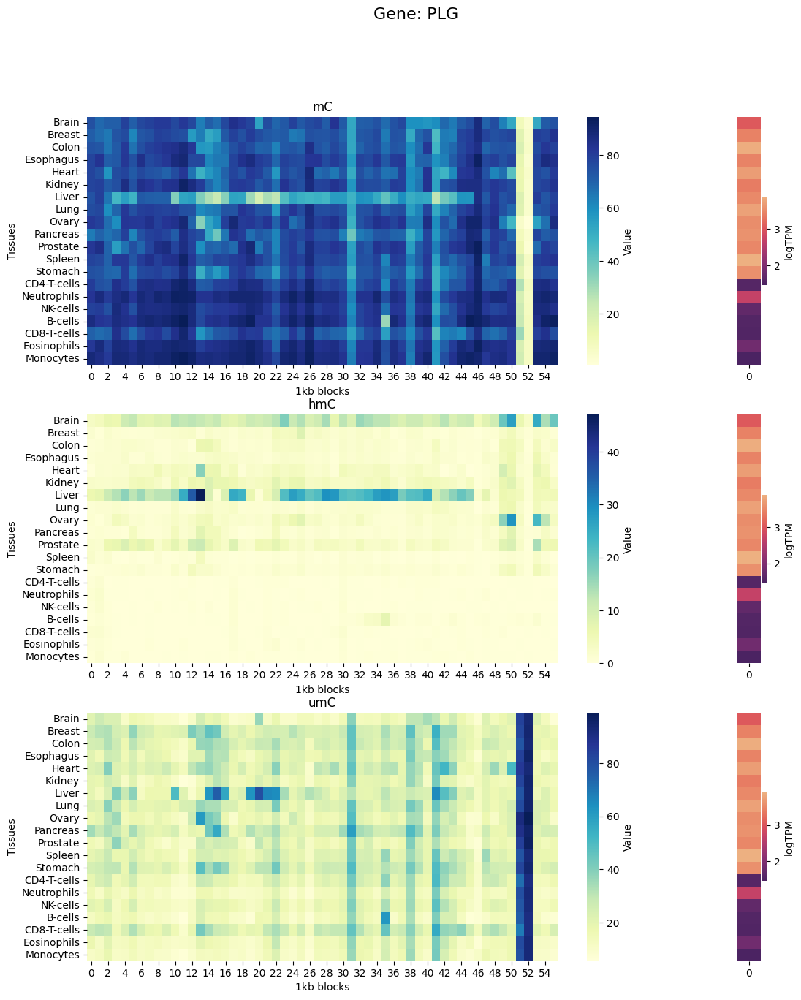

In [21]:
# Plotting the heatmaps
fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [20, 1]})

# fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [5, 1]})

sns.heatmap(mC_data.T, ax=axes[0, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
axes[0, 0].set_title('mC')
axes[0, 0].set_ylabel('Tissues')
axes[0, 0].set_xlabel('1kb blocks')

sns.heatmap(hmC_data.T, ax=axes[1, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
axes[1, 0].set_title('hmC')
axes[1, 0].set_ylabel('Tissues')
axes[1, 0].set_xlabel('1kb blocks')

sns.heatmap(umC_data.T, ax=axes[2, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
axes[2, 0].set_title('umC')
axes[2, 0].set_ylabel('Tissues')
axes[2, 0].set_xlabel('1kb blocks')


# fig.suptitle(f"Gene: {selected_gene}, Strand: {strand}",fontsize=16)
fig.suptitle(f"Gene: {selected_gene}",fontsize=16)

# Secondary heatmap (logTPM values)
for i in range(3):
    sns.heatmap(logTPM, ax=axes[i, 1], cmap='flare_r', cbar_kws={'label': 'logTPM'}, yticklabels=tissues)
    axes[i, 1].set_yticks([])  # Hide y-ticks for logTPM plots
    axes[i, 1].set_ylabel('')  # Hide y-labels for logTPM plots

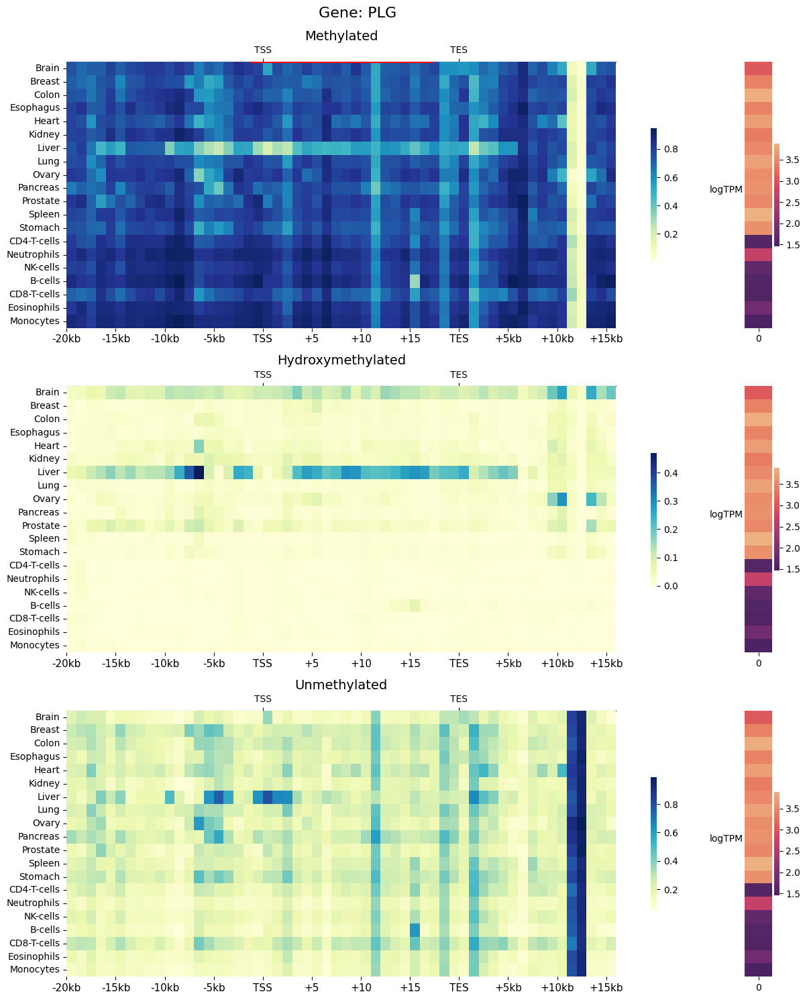

In [22]:

# positions = 60
# custom_labels = ['' for _ in range(positions)]
# for i in range(0, positions, 5):
#     if i < 20:
#         custom_labels[i] = 'TSS-{}kb'.format(20 - i)
#     elif i == 20:
#         custom_labels[i] = 'TSS'
#     elif i <= 39:
#         custom_labels[i] = 'TSS+{}'.format(i - 20)

#     elif i==40:
#         custom_labels[i] = 'TES'.format(i - 20)
#     else:
#         custom_labels[i] = 'TES+{}kb'.format(i - 40)  # Labels for positions after TES




positions = 60
custom_labels = ['' for _ in range(positions)]
for i in range(0, positions, 5):
    if i < 20:
        custom_labels[i] = '-{}kb'.format(20 - i)
    elif i == 20:
        custom_labels[i] = 'TSS'
    elif i <= 39:
        custom_labels[i] = '+{}'.format(i - 20)

    elif i==40:
        custom_labels[i] = 'TES'.format(i - 20)
    else:
        custom_labels[i] = '+{}kb'.format(i - 40)  # Labels for positions after TES

# Plotting the heatmaps
fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [20, 1]})

# fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [5, 1]})

sns.heatmap(mC_data.T/100, ax=axes[0, 0], cmap='YlGnBu', cbar_kws={'shrink': 0.5}, yticklabels=tissues)
axes[0, 0].set_title('Methylated',fontsize=14)
axes[0, 0].set_ylabel('Tissues')
# axes[0, 0].set_xlabel('1kb blocks')

ax0 = axes[0, 0]
ax0.axhline(y=-0.01, xmin=(0.335), xmax=(0.665), color='red', linestyle='-', linewidth=2)


sns.heatmap(hmC_data.T/100, ax=axes[1, 0], cmap='YlGnBu', cbar_kws={'shrink': 0.5}, yticklabels=tissues)
axes[1, 0].set_title('Hydroxymethylated',fontsize=14)
axes[1, 0].set_ylabel('Tissues')
# axes[1, 0].set_xlabel('1kb blocks')

sns.heatmap(umC_data.T/100, ax=axes[2, 0], cmap='YlGnBu', cbar_kws={'shrink': 0.5}, yticklabels=tissues)
axes[2, 0].set_title('Unmethylated',fontsize=14)
axes[2, 0].set_ylabel('Tissues')
# axes[2, 0].set_xlabel('1kb blocks')


# fig.suptitle(f"Gene: {selected_gene}, Strand: {strand}",fontsize=16)
fig.suptitle(f"Gene: {selected_gene}",
             fontsize=16,
            ha='left', va='top',
             x=0.4,y=0.99)

# Secondary heatmap (logTPM values)
for i in range(3):
    sns.heatmap(logTPM, ax=axes[i, 1], cmap='flare_r', cbar_kws={'shrink': 0.5}, yticklabels=tissues)
    axes[i, 1].set_yticks([])  # Hide y-ticks for logTPM plots
    axes[i, 1].set_ylabel('logTPM',rotation=0,labelpad=20)  # Hide y-labels for logTPM plots
    
    
    ax = axes[i,0]
#     ax.set_xticks(np.arange(0,positions))
    ax.set_xticks(np.arange(0,positions,5))
    ax.set_xticklabels([u for u in custom_labels if u],fontsize=11)
    
    ax2 = ax.secondary_xaxis('top')
    ax2.set_xticks([20, 40])
    ax2.set_xticklabels(['TSS', 'TES'])
    
    ax.set_xlabel('')
    ax.set_ylabel('')

    
    
plt.tight_layout()

# fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/ge_predict/"
# plt.savefig(fig_savedir + f"20kb_gene_normalised_windows.mC_hmC_umC_heatmap.{gene_name}.logTPM.thesis_clean.png",
#            dpi=300)


### Genes from top n rows

In [24]:
# selected_gene = "SAMD11"
# selected_gene = "CDK11B"
# selected_gene = "TNFRSF4"
# selected_gene = "TTLL10"
# selected_gene = "ANKRD65"
# selected_gene = "CDK11B"
# selected_gene = "HES4"
# selected_gene = "AGRN"
# selected_gene = "GABRD"
selected_gene = "SKI"
# selected_gene = gene_to_find
df = grouped_data.loc[grouped_data['gene']==selected_gene]
# df = specific_gene_grouped_data.loc[specific_gene_grouped_data['gene']==selected_gene]



# strand = df['strand'].iloc[0]


# tissues = tissues[0:-2]
# Extracting epigenetic data
mC_data = df[[f"{tissue}_mC" for tissue in tissues]].to_numpy()
hmC_data = df[[f"{tissue}_hmC" for tissue in tissues]].to_numpy()
umC_data = df[[f"{tissue}_umC" for tissue in tissues]].to_numpy()


rna_seq_tissues = [u for u in [mapping.get(u,'') for u in tissues] if u]
# rna_seq_subset = rna_seq_data_long[(rna_seq_data_long['Name'] == selected_gene) & (rna_seq_data_long['tissue'].isin(rna_seq_tissues))]
rna_seq_subset = rna_seq_data_long[(rna_seq_data_long['Description'] == selected_gene) & (rna_seq_data_long['tissue'].isin(rna_seq_tissues))]
rna_seq_subset['tissue'] = pd.Categorical(rna_seq_subset['tissue'], categories=rna_seq_tissues, ordered=True)#.sor('tissue')
rna_seq_subset.sort_values(by='tissue',inplace=True)


# Extracting logTPM data for the gene of interest
# logTPM = rna_seq_subset['logTPM'].to_numpy().reshape(20,1)

In [25]:
mC_data.shape

(60, 20)

In [333]:
rna_seq_subset

,core_gene,Name,Description,tissue,TPM,logTPM,Normalized_TPM
532338,ENSG00000157933,ENSG00000157933,SKI,midbrain,16.9,2.884801,0.196945
130538,ENSG00000157933,ENSG00000157933,SKI,breast,31.5,3.481240,0.627731
230988,ENSG00000157933,ENSG00000157933,SKI,colon,34.6,3.572346,0.549676
311348,ENSG00000157933,ENSG00000157933,SKI,esophagus,23.5,3.198673,0.403241
371618,ENSG00000157933,ENSG00000157933,SKI,heart muscle,34.4,3.566712,0.207465
431888,ENSG00000157933,ENSG00000157933,SKI,kidney,23.6,3.202746,0.286069
451978,ENSG00000157933,ENSG00000157933,SKI,liver,24.3,3.230804,0.177224
472068,ENSG00000157933,ENSG00000157933,SKI,lung,33.9,3.552487,0.847767
552428,ENSG00000157933,ENSG00000157933,SKI,ovary,36.4,3.621671,0.848129
572518,ENSG00000157933,ENSG00000157933,SKI,pancreas,13.1,2.646175,0.061263


In [334]:
df

,Unnamed: 0,chr,start,end,gene,feature,idx,Colon_mC,Colon_hmC,Colon_umC,...,Eosinophils_umC,Monocytes_mC,Monocytes_hmC,Monocytes_umC,Erythroblasts_mC,Erythroblasts_hmC,Erythroblasts_umC,Megakaryocytes_mC,Megakaryocytes_hmC,Megakaryocytes_umC
2890,2890,chr1,2208319,2209319,SKI,tss,1,32.7500,6.60000,60.50,...,17.250,84.0000,1.79250,14.250,73.7500,0.13500,26.00,83.000,0.4600,17.00
2892,2892,chr1,2209319,2210319,SKI,tss,2,57.7500,8.27500,34.25,...,11.750,88.0000,0.58500,11.450,69.0000,0.20050,30.50,85.000,0.4500,15.00
2894,2894,chr1,2210319,2211319,SKI,tss,3,68.5000,9.42500,22.25,...,10.600,90.0000,1.06750,8.700,69.2500,0.23150,30.50,83.500,0.5650,15.50
2896,2896,chr1,2211319,2212319,SKI,tss,4,60.2500,9.47500,30.25,...,5.800,89.2500,1.21000,9.350,81.5000,0.50250,17.75,86.000,1.7500,12.00
2897,2897,chr1,2212319,2213319,SKI,tss,5,6.4000,0.75250,92.75,...,85.000,13.5000,0.80000,86.000,17.0000,0.37500,82.75,11.500,3.4500,85.00
2899,2899,chr1,2213319,2214319,SKI,tss,6,28.5000,2.15000,69.75,...,33.250,68.7500,2.17500,29.500,65.0000,0.28850,34.75,64.500,3.5000,32.00
2901,2901,chr1,2214319,2215319,SKI,tss,7,36.5000,3.22500,60.00,...,11.400,83.5000,2.25000,14.250,70.5000,0.27000,28.75,82.000,1.4500,16.50
2903,2903,chr1,2215319,2216319,SKI,tss,8,78.5000,7.55000,14.00,...,5.075,95.0000,0.27925,4.475,80.7500,0.12225,19.00,90.500,0.3400,9.45
2905,2905,chr1,2216319,2217319,SKI,tss,9,69.0000,8.82500,22.50,...,7.600,90.7500,1.02500,8.025,74.5000,0.22000,25.00,86.500,0.9700,12.50
2907,2907,chr1,2217319,2218319,SKI,tss,10,76.7500,5.82500,17.25,...,5.275,94.7500,0.64500,4.725,76.2500,0.29000,23.75,88.500,0.4700,10.50


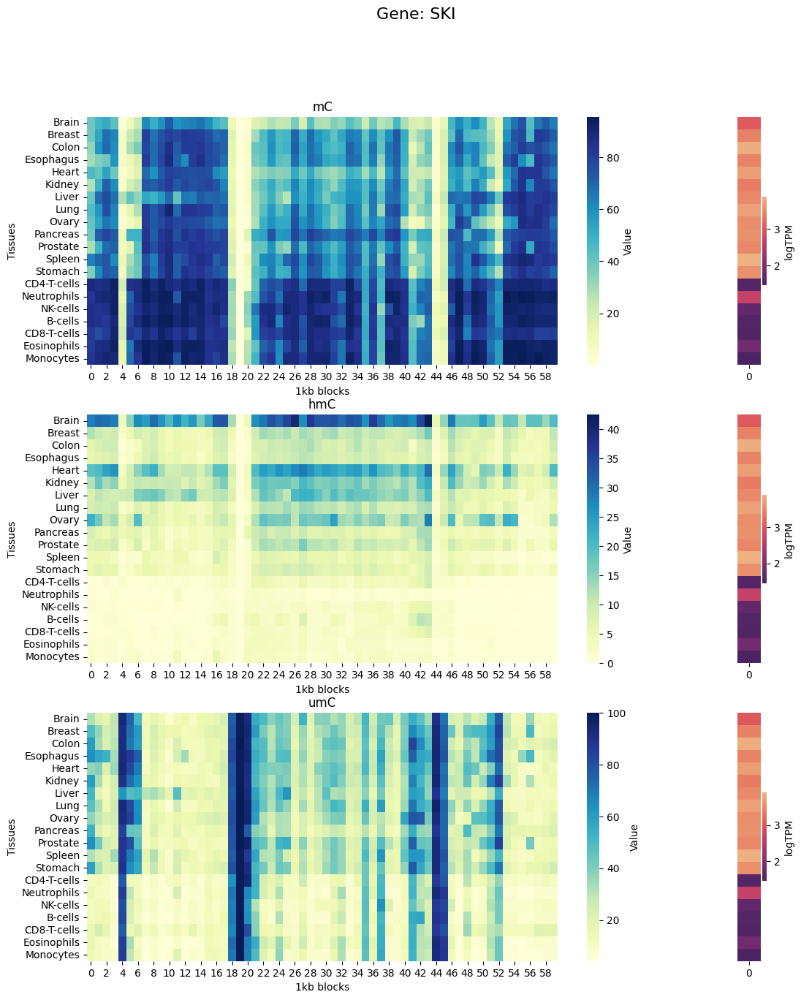

In [346]:
# Plotting the heatmaps
fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [20, 1]})

# fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [5, 1]})

sns.heatmap(mC_data.T, ax=axes[0, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
axes[0, 0].set_title('mC')
axes[0, 0].set_ylabel('Tissues')
axes[0, 0].set_xlabel('1kb blocks')

sns.heatmap(hmC_data.T, ax=axes[1, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
axes[1, 0].set_title('hmC')
axes[1, 0].set_ylabel('Tissues')
axes[1, 0].set_xlabel('1kb blocks')

sns.heatmap(umC_data.T, ax=axes[2, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
axes[2, 0].set_title('umC')
axes[2, 0].set_ylabel('Tissues')
axes[2, 0].set_xlabel('1kb blocks')


# fig.suptitle(f"Gene: {selected_gene}, Strand: {strand}",fontsize=16)
fig.suptitle(f"Gene: {selected_gene}",fontsize=16)

# Secondary heatmap (logTPM values)
for i in range(3):
    sns.heatmap(logTPM, ax=axes[i, 1], cmap='flare_r', cbar_kws={'label': 'logTPM'}, yticklabels=tissues)
    axes[i, 1].set_yticks([])  # Hide y-ticks for logTPM plots
    axes[i, 1].set_ylabel('')  # Hide y-labels for logTPM plots

### Customise heatmap plot labels

In [385]:

# positions = 60
# custom_labels = ['' for _ in range(positions)]
# for i in range(0, positions, 5):
#     if i < 20:
#         custom_labels[i] = 'TSS-{}kb'.format(20 - i)
#     elif i == 20:
#         custom_labels[i] = 'TSS'
#     elif i <= 39:
#         custom_labels[i] = 'TSS+{}'.format(i - 20)

#     elif i==40:
#         custom_labels[i] = 'TES'.format(i - 20)
#     else:
#         custom_labels[i] = 'TES+{}kb'.format(i - 40)  # Labels for positions after TES




positions = 60
custom_labels = ['' for _ in range(positions)]
for i in range(0, positions, 5):
    if i < 20:
        custom_labels[i] = '-{}kb'.format(20 - i)
    elif i == 20:
        custom_labels[i] = 'TSS'
    elif i <= 39:
        custom_labels[i] = '+{}'.format(i - 20)

    elif i==40:
        custom_labels[i] = 'TES'.format(i - 20)
    else:
        custom_labels[i] = '+{}kb'.format(i - 40)  # Labels for positions after TES



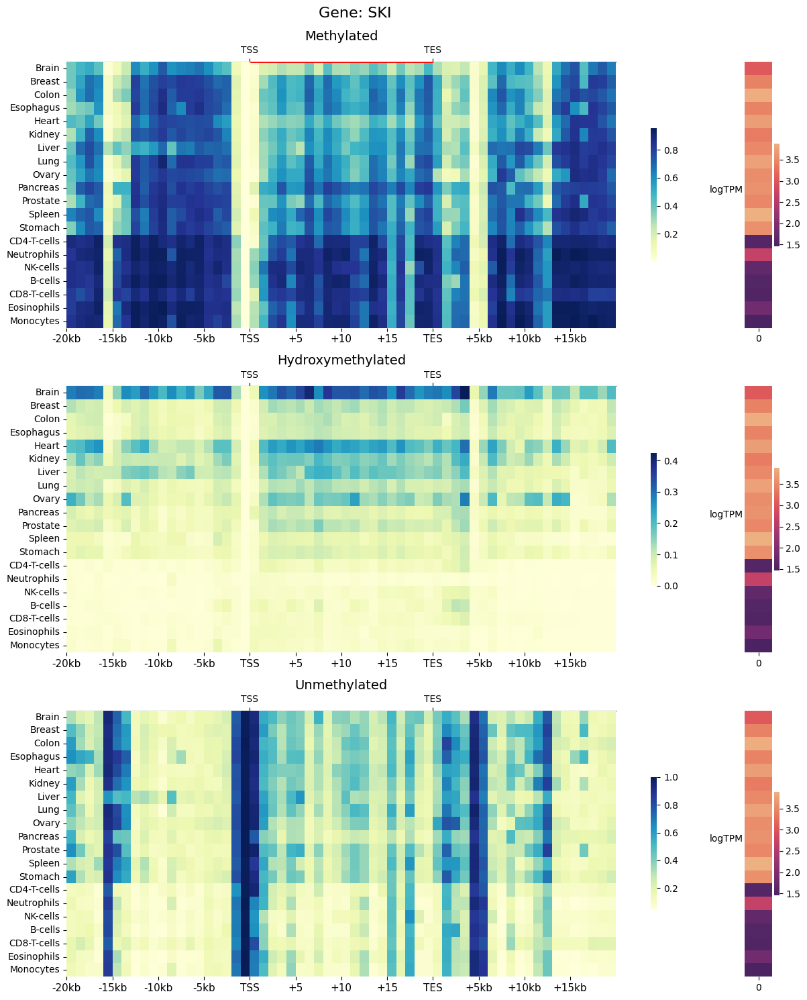

In [388]:
# Plotting the heatmaps
fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [20, 1]})

# fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [5, 1]})

sns.heatmap(mC_data.T/100, ax=axes[0, 0], cmap='YlGnBu', cbar_kws={'shrink': 0.5}, yticklabels=tissues)
axes[0, 0].set_title('Methylated',fontsize=14)
axes[0, 0].set_ylabel('Tissues')
# axes[0, 0].set_xlabel('1kb blocks')

ax0 = axes[0, 0]
ax0.axhline(y=-0.01, xmin=(0.335), xmax=(0.665), color='red', linestyle='-', linewidth=2)


sns.heatmap(hmC_data.T/100, ax=axes[1, 0], cmap='YlGnBu', cbar_kws={'shrink': 0.5}, yticklabels=tissues)
axes[1, 0].set_title('Hydroxymethylated',fontsize=14)
axes[1, 0].set_ylabel('Tissues')
# axes[1, 0].set_xlabel('1kb blocks')

sns.heatmap(umC_data.T/100, ax=axes[2, 0], cmap='YlGnBu', cbar_kws={'shrink': 0.5}, yticklabels=tissues)
axes[2, 0].set_title('Unmethylated',fontsize=14)
axes[2, 0].set_ylabel('Tissues')
# axes[2, 0].set_xlabel('1kb blocks')


# fig.suptitle(f"Gene: {selected_gene}, Strand: {strand}",fontsize=16)
fig.suptitle(f"Gene: {selected_gene}",
             fontsize=16,
            ha='left', va='top',
             x=0.4,y=0.99)

# Secondary heatmap (logTPM values)
for i in range(3):
    sns.heatmap(logTPM, ax=axes[i, 1], cmap='flare_r', cbar_kws={'shrink': 0.5}, yticklabels=tissues)
    axes[i, 1].set_yticks([])  # Hide y-ticks for logTPM plots
    axes[i, 1].set_ylabel('logTPM',rotation=0,labelpad=20)  # Hide y-labels for logTPM plots
    
    
    ax = axes[i,0]
#     ax.set_xticks(np.arange(0,positions))
    ax.set_xticks(np.arange(0,positions,5))
    ax.set_xticklabels([u for u in custom_labels if u],fontsize=11)
    
    ax2 = ax.secondary_xaxis('top')
    ax2.set_xticks([20, 40])
    ax2.set_xticklabels(['TSS', 'TES'])
    
    ax.set_xlabel('')
    ax.set_ylabel('')

    
    
plt.tight_layout()

# fig_savedir = "/well/ludwig/users/dyp502/thesis/thesis_figures/ge_predict/"
# plt.savefig(fig_savedir + f"20kb_gene_normalised_windows.mC_hmC_umC_heatmap.{gene_name}.logTPM.thesis_clean.png",
#            dpi=300)


In [ ]:
fig = plt.figure(figsize=(12, len(tissues) * 1.5))
outer_grid = gridspec.GridSpec(3, 1, height_ratios=[1 for _ in mean_shap_values_dict], hspace=0.3)

# Updated custom_labels with TES+ labels
custom_labels = ['' for _ in range(positions)]
for i in range(0, positions, 5):
    if i < 20:
        custom_labels[i] = 'TSS - {}kb'.format(20 - i)
    elif i == 20:
        custom_labels[i] = 'TSS'
    elif i <= 39:
        custom_labels[i] = 'TSS + {}'.format(i - 20)

    elif i==40:
        custom_labels[i] = 'TES'.format(i - 20)
    else:
        custom_labels[i] = 'TES + {}kb'.format(i - 40)  # Labels for positions after TES

for idx, (mark_name, mean_shap_values) in enumerate(mean_shap_values_dict.items()):
    # Create an inner grid for each row
    inner_grid = gridspec.GridSpecFromSubplotSpec(2, 1, subplot_spec=outer_grid[idx], height_ratios=[1, 20], hspace=0)
    # Add a subplot for the red line
    ax0 = fig.add_subplot(inner_grid[0])
#         print((20.5/positions))
#         print((40.5/positions))
#         ax0.axhline(y=0.5, xmin=(20.5/positions), xmax=(40.5/positions), color='red', linestyle='-', linewidth=2)
#         ax0.axhline(y=0.5, xmin=(0.3), xmax=(0.4), color='red', linestyle='-', linewidth=2)

    tss_pos = 20  # Assuming TSS is always at position 20
    tes_pos = 40  # Assuming TES is always at position 40

    # Add the red line between TSS and TES
    ax0.axhline(y=0.3, xmin=(0.28), xmax=(0.54), color='red', linestyle='-', linewidth=2)


    ax0.set_xlim(0, positions)
    ax0.axis('off')

    # Add a subplot for the heatmap
    ax = fig.add_subplot(inner_grid[1])
    cax = ax.matshow(mean_shap_values, cmap='viridis', aspect='auto')
    fig.colorbar(cax, ax=ax, orientation='vertical', label="Mean Absolute SHAP Value", shrink=0.5)
    ax.set_title(f"Mean Absolute SHAP Value Heatmap for {mark_name} Across Tissues")
    ax.set_ylabel("Tissue")
    ax.set_xticks(np.arange(0, positions, 1))
    ax.xaxis.tick_bottom()
    ax.set_xticklabels(custom_labels, rotation=90)
    ax.set_yticks(np.arange(len(tissues)))
    ax.set_yticklabels(tissues)

    # Set up secondary axis for TSS and TES labels on the heatmap
    ax2 = ax.secondary_xaxis('top')
    ax2.set_xticks([20, 40])
    ax2.set_xticklabels(['TSS', 'TES'])

plt.tight_layout()
if savename:
    plt.savefig(savename)
plt.show()

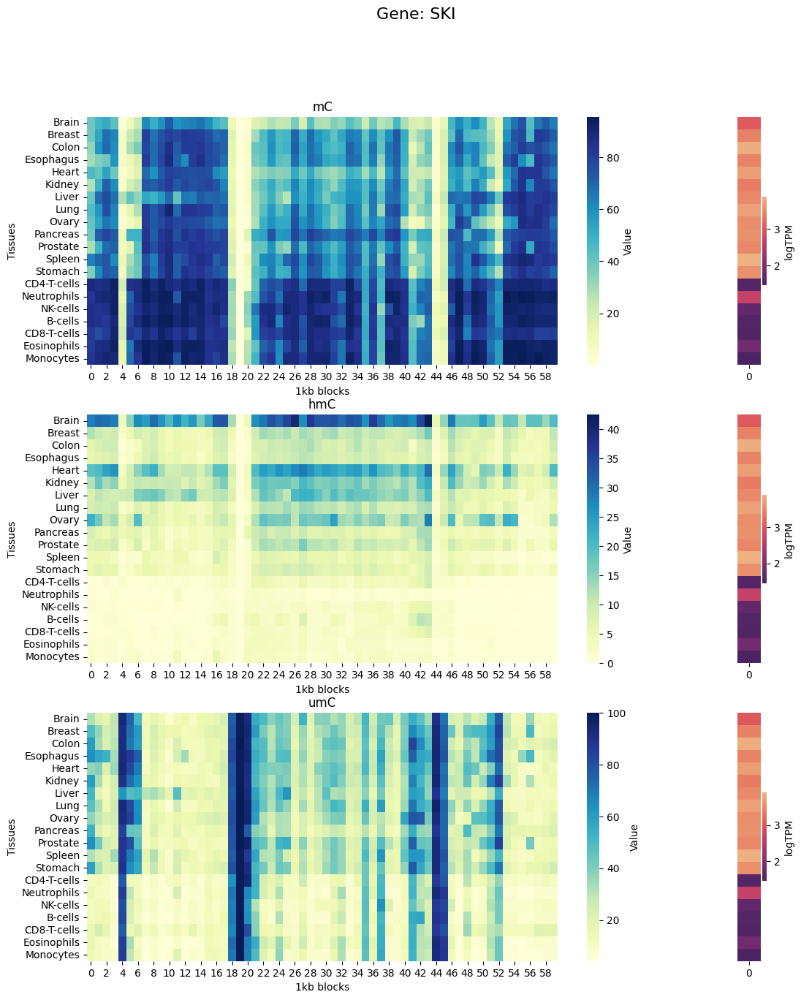

In [338]:
# Plotting the heatmaps
fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [20, 1]})

# fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [5, 1]})

sns.heatmap(mC_data.T, ax=axes[0, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
axes[0, 0].set_title('mC')
axes[0, 0].set_ylabel('Tissues')
axes[0, 0].set_xlabel('1kb blocks')

sns.heatmap(hmC_data.T, ax=axes[1, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
axes[1, 0].set_title('hmC')
axes[1, 0].set_ylabel('Tissues')
axes[1, 0].set_xlabel('1kb blocks')

sns.heatmap(umC_data.T, ax=axes[2, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
axes[2, 0].set_title('umC')
axes[2, 0].set_ylabel('Tissues')
axes[2, 0].set_xlabel('1kb blocks')


# fig.suptitle(f"Gene: {selected_gene}, Strand: {strand}",fontsize=16)
fig.suptitle(f"Gene: {selected_gene}",fontsize=16)

# Secondary heatmap (logTPM values)
for i in range(3):
    sns.heatmap(logTPM, ax=axes[i, 1], cmap='flare_r', cbar_kws={'label': 'logTPM'}, yticklabels=tissues)
    axes[i, 1].set_yticks([])  # Hide y-ticks for logTPM plots
    axes[i, 1].set_ylabel('')  # Hide y-labels for logTPM plots
    

    
    
    
    
ax = fig.add_subplot(inner_grid[1])
cax = ax.matshow(mean_shap_values, cmap='viridis', aspect='auto')
fig.colorbar(cax, ax=ax, orientation='vertical', label="Mean Absolute SHAP Value", shrink=0.5)
ax.set_title(f"Mean Absolute SHAP Value Heatmap for {mark_name} Across Tissues")
ax.set_ylabel("Tissue")
ax.set_xticks(np.arange(0, positions, 1))
ax.xaxis.tick_bottom()
ax.set_xticklabels(custom_labels, rotation=90)
ax.set_yticks(np.arange(len(tissues)))
ax.set_yticklabels(tissues)

# Set up secondary axis for TSS and TES labels on the heatmap
ax2 = ax.secondary_xaxis('top')
ax2.set_xticks([20, 40])
ax2.set_xticklabels(['TSS', 'TES'])

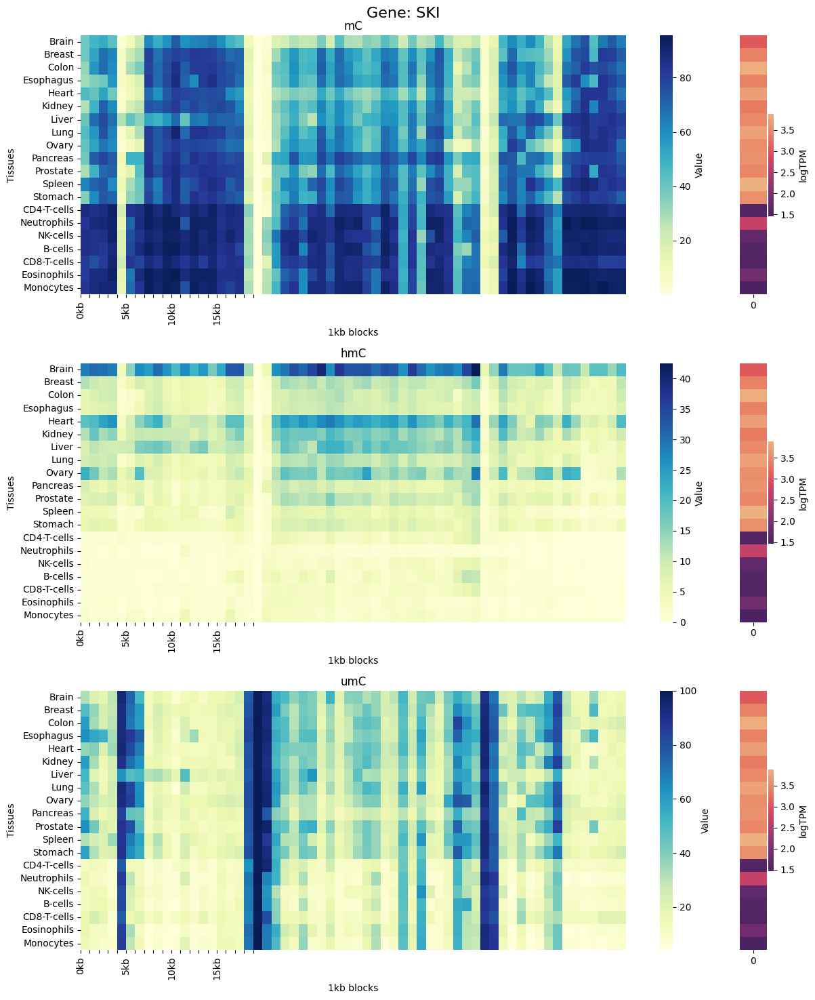

In [340]:
import matplotlib.pyplot as plt
import seaborn as sns

# Function to create custom labels at every 5kb interval
def create_custom_5kb_labels(num_columns):
    labels = [''] * num_columns
    for i in range(0, num_columns, 5):
        labels[i] = f"{i}kb"
    return labels

# Get the number of columns (1kb blocks) from your data
num_columns = mC_data.shape[1]

# Generate the custom labels
custom_labels = create_custom_5kb_labels(num_columns)

# Plotting the heatmaps with the new custom labels
fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [20, 1]})
data_list = [mC_data, hmC_data, umC_data]
titles = ['mC', 'hmC', 'umC']

for i, (data, title) in enumerate(zip(data_list, titles)):
    sns.heatmap(data.T, ax=axes[i, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
    axes[i, 0].set_title(title)
    axes[i, 0].set_ylabel('Tissues')
    axes[i, 0].set_xlabel('1kb blocks')

    # Set custom x-tick labels
    axes[i, 0].set_xticks(range(num_columns))  # Set x-ticks for every column
    axes[i, 0].set_xticklabels(custom_labels, rotation=90)  # Apply custom labels

# fig.suptitle(f"Gene: {selected_gene}, Strand: {strand}",fontsize=16)
fig.suptitle(f"Gene: {selected_gene}", fontsize=16)

# Secondary heatmap (logTPM values)
for i in range(3):
    sns.heatmap(logTPM, ax=axes[i, 1], cmap='flare_r', cbar_kws={'label': 'logTPM'}, yticklabels=tissues)
    axes[i, 1].set_yticks([])  # Hide y-ticks for logTPM plots
    axes[i, 1].set_ylabel('')  # Hide y-labels for logTPM plots

plt.tight_layout()
plt.show()


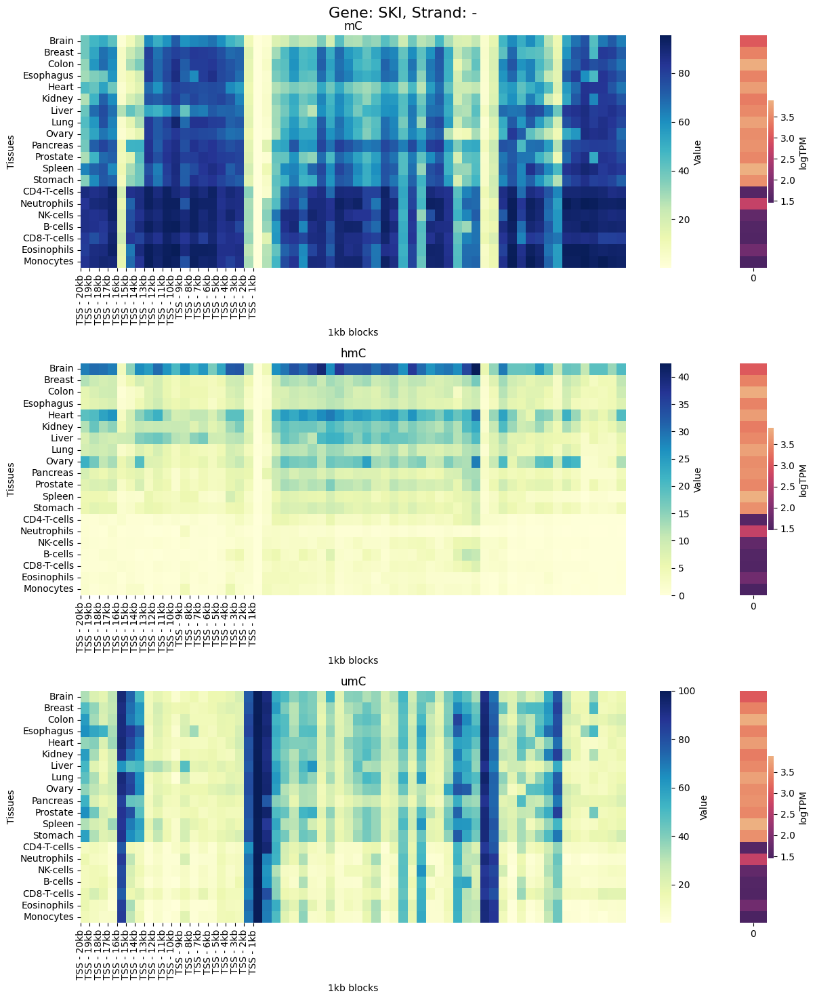

In [339]:
# Assuming the number of 1kb blocks matches the number of columns in your data matrices
n_blocks = mC_data.shape[1]  # Replace with the number of columns in your data

# Update custom_labels generation to match the number of columns in your data
custom_labels = create_custom_labels(n_blocks)

# Plotting the heatmaps with updated labels
fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [20, 1]})

for i, data in enumerate([mC_data, hmC_data, umC_data]):
    ax = sns.heatmap(data.T, ax=axes[i, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
    axes[i, 0].set_title(['mC', 'hmC', 'umC'][i])
    axes[i, 0].set_ylabel('Tissues')
    axes[i, 0].set_xlabel('1kb blocks')

    # Set the x-tick labels
    ax.set_xticks(np.arange(data.shape[1]))  # Set x-ticks for each column
    ax.set_xticklabels(custom_labels, rotation=90)  # Apply custom labels

# Rest of your plotting code for logTPM and figure adjustments
fig.suptitle(f"Gene: {selected_gene}, Strand: {strand}", fontsize=16)
for i in range(3):
    sns.heatmap(logTPM, ax=axes[i, 1], cmap='flare_r', cbar_kws={'label': 'logTPM'}, yticklabels=tissues)
    axes[i, 1].set_yticks([])
    axes[i, 1].set_ylabel('')

plt.tight_layout()
plt.show()


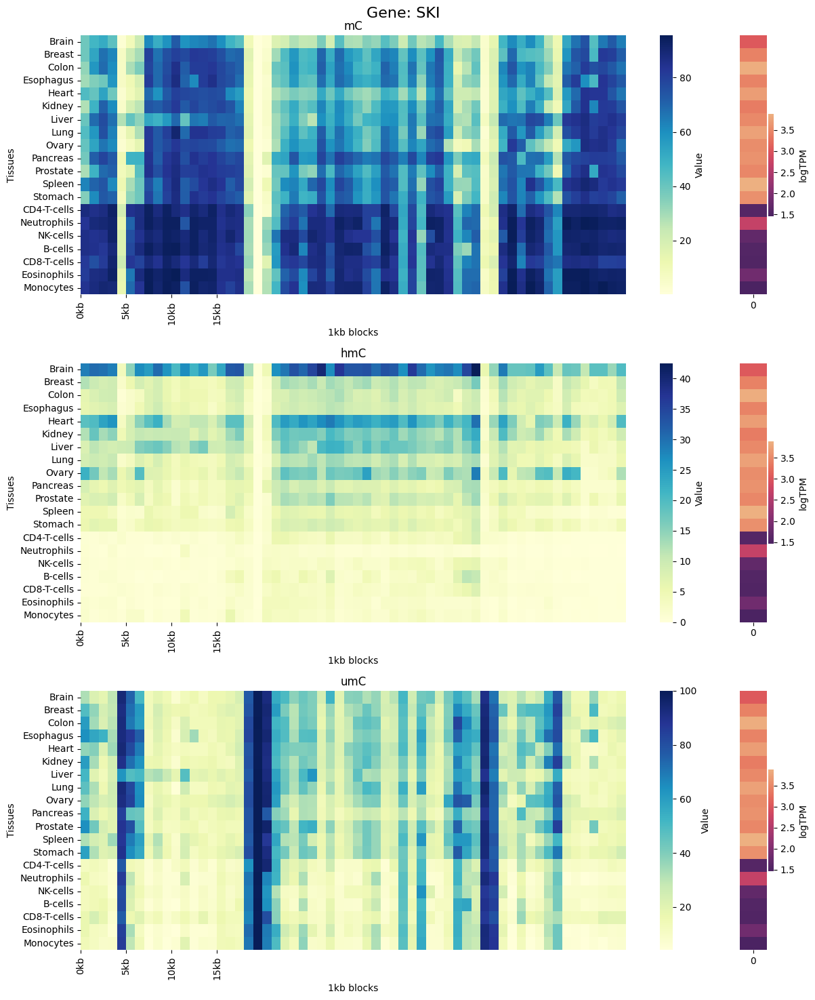

In [351]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming that one column in the data corresponds to 1kb, adjust if your data is different
blocks_per_kb = 1  # Set this to the number of blocks that make up 1kb in your data
interval = 5  # The interval in kb for the labels

# Function to create custom labels at every 5kb interval
def create_custom_5kb_labels(num_blocks, interval):
    # Calculate the positions where the labels should be placed
    label_positions = list(range(0, num_blocks, blocks_per_kb * interval))
    # Create the labels
    labels = [f"{int(i/blocks_per_kb)}kb" for i in label_positions]
    return labels, label_positions

# Get the number of columns (1kb blocks) from your data
num_blocks = mC_data.shape[1]

# Generate the custom labels and positions
custom_labels, label_positions = create_custom_5kb_labels(num_blocks, interval)

# Plotting the heatmaps with the new custom labels
fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [20, 1]})
data_list = [mC_data, hmC_data, umC_data]
titles = ['mC', 'hmC', 'umC']

for i, (data, title) in enumerate(zip(data_list, titles)):
    heatmap = sns.heatmap(data.T, ax=axes[i, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
    axes[i, 0].set_title(title)
    axes[i, 0].set_ylabel('Tissues')
    axes[i, 0].set_xlabel('1kb blocks')
    
    # Set custom x-tick labels at the correct positions
    heatmap.set_xticks(label_positions)  # Set x-ticks at every 5kb interval
    heatmap.set_xticklabels(custom_labels, rotation=90)  # Apply custom labels

# Set the figure title
fig.suptitle(f"Gene: {selected_gene}", fontsize=16)

# Secondary heatmap (logTPM values)
for i in range(3):
    sns.heatmap(logTPM, ax=axes[i, 1], cmap='flare_r', cbar_kws={'label': 'logTPM'}, yticklabels=False)
    axes[i, 1].set_yticks([])  # Hide y-ticks for logTPM plots
    axes[i, 1].set_ylabel('')  # Hide y-labels for logTPM plots

plt.tight_layout()
plt.show()


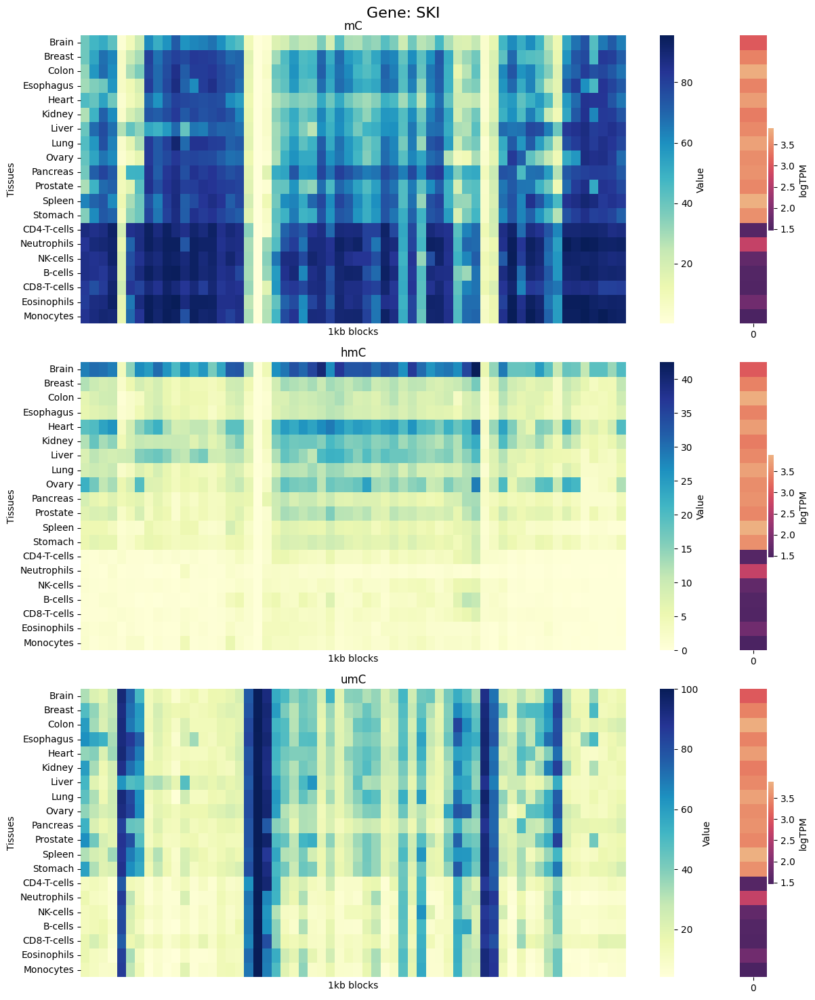

In [341]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming there are 20 blocks per kb, adjust if your data is different
blocks_per_kb = 20
interval = 5  # The interval in kb for the labels

# Function to create custom labels at every 5kb interval
def create_custom_5kb_labels(num_blocks, blocks_per_kb, interval):
    num_labels = num_blocks // (blocks_per_kb * interval)
    labels = [f"{i*interval}kb" for i in range(num_labels)]
    return labels, [i*blocks_per_kb*interval for i in range(num_labels)]

# Get the number of columns (1kb blocks) from your data
num_blocks = mC_data.shape[1]

# Generate the custom labels and positions
custom_labels, label_positions = create_custom_5kb_labels(num_blocks, blocks_per_kb, interval)

# Plotting the heatmaps with the new custom labels
fig, axes = plt.subplots(3, 2, figsize=(12, 15), gridspec_kw={'width_ratios': [20, 1]})
data_list = [mC_data, hmC_data, umC_data]
titles = ['mC', 'hmC', 'umC']

for i, (data, title) in enumerate(zip(data_list, titles)):
    sns.heatmap(data.T, ax=axes[i, 0], cmap='YlGnBu', cbar_kws={'label': 'Value'}, yticklabels=tissues)
    axes[i, 0].set_title(title)
    axes[i, 0].set_ylabel('Tissues')
    axes[i, 0].set_xlabel('1kb blocks')

    # Set custom x-tick labels at the correct positions
    axes[i, 0].set_xticks(label_positions)  # Set x-ticks at every 5kb interval
    axes[i, 0].set_xticklabels(custom_labels, rotation=90)  # Apply custom labels

# fig.suptitle(f"Gene: {selected_gene}, Strand: {strand}",fontsize=16)
fig.suptitle(f"Gene: {selected_gene}", fontsize=16)

# Secondary heatmap (logTPM values)
for i in range(3):
    sns.heatmap(logTPM, ax=axes[i, 1], cmap='flare_r', cbar_kws={'label': 'logTPM'}, yticklabels=tissues)
    axes[i, 1].set_yticks([])  # Hide y-ticks for logTPM plots
    axes[i, 1].set_ylabel('')  # Hide y-labels for logTPM plots

plt.tight_layout()
plt.show()


### Deep Learning models

- ConvNet architecture



Python 3.10.10
ConvNet(
  (layer1): ResidualBlock(
    (layer1): Sequential(
      (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (layer2): Sequential(
      (0): Conv2d(16, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (shortcut): Sequential(
      (0): Conv2d(1, 16, kernel_size=(1, 1), stride=(1, 1))
      (1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (layer2): ResidualBlock(
    (layer1): Sequential(
      (0): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (layer2): Sequential(
      (0): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (shortcut): Sequential(
      (0): Conv2d(16, 32, kernel_size=(1, 1), stride=(1, 1))
      (1): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (layer3): ResidualBlock(
    (layer1): Sequential(
      (0): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (layer2): Sequential(
      (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (shortcut): Sequential(
      (0): Conv2d(32, 64, kernel_size=(1, 1), stride=(1, 1))
      (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
  )
  (fc1): Linear(in_features=3840, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=64, bias=True)
  (fc3): Linear(in_features=64, out_features=1, bias=True)
)

In [37]:
models_dir = "/well/ludwig/users/dyp502/tissue_atlas_v3/predict_ge/1kb_model/dl_model/"
model_name = "1kb_bins.leave_one_out.test4.no_brain.normalisedTPM."
filename = f"{model_name}tissue_results.csv"
metrics_df = pd.read_csv(models_dir + filename,sep='\t').sort_values(by='Test R2',ascending=False)
metrics_df

,Unnamed: 0,train_samples,test_samples,Tissue,Train MAE,Test MAE,Train R2,Test R2
17,17,306396,17022,eosinophil,1.121924,1.353182,5.413891e-01,0.691577
16,16,306396,17022,memory CD8 T-cell,1.059141,1.298788,6.811119e-01,0.609610
5,5,306396,17022,liver,1.095591,1.091008,5.987875e-01,0.568886
18,18,306396,17022,classical monocyte,1.034821,1.360355,6.956314e-01,0.544369
15,15,306396,17022,naive B-cell,1.105908,1.267802,6.289926e-01,0.407243
12,12,306396,17022,memory CD4 T-cell,1.111867,1.441696,5.473756e-01,0.226956
14,14,306396,17022,NK-cell,1.129588,1.396413,4.408783e-01,0.200404
0,0,306396,17022,breast,1.089071,1.004010,6.153785e-01,0.122113
8,8,306396,17022,pancreas,1.105610,1.613175,5.008470e-01,0.070899
7,7,306396,17022,ovary,1.097026,1.169694,6.312287e-01,0.046190
